# Entrenamiento de YOLOv8 con Transfer Learning - Especies Galápagos 🦎🐧

Este cuaderno entrena un modelo YOLOv8 sobre un dataset personalizado de especies endémicas del Ecuador.


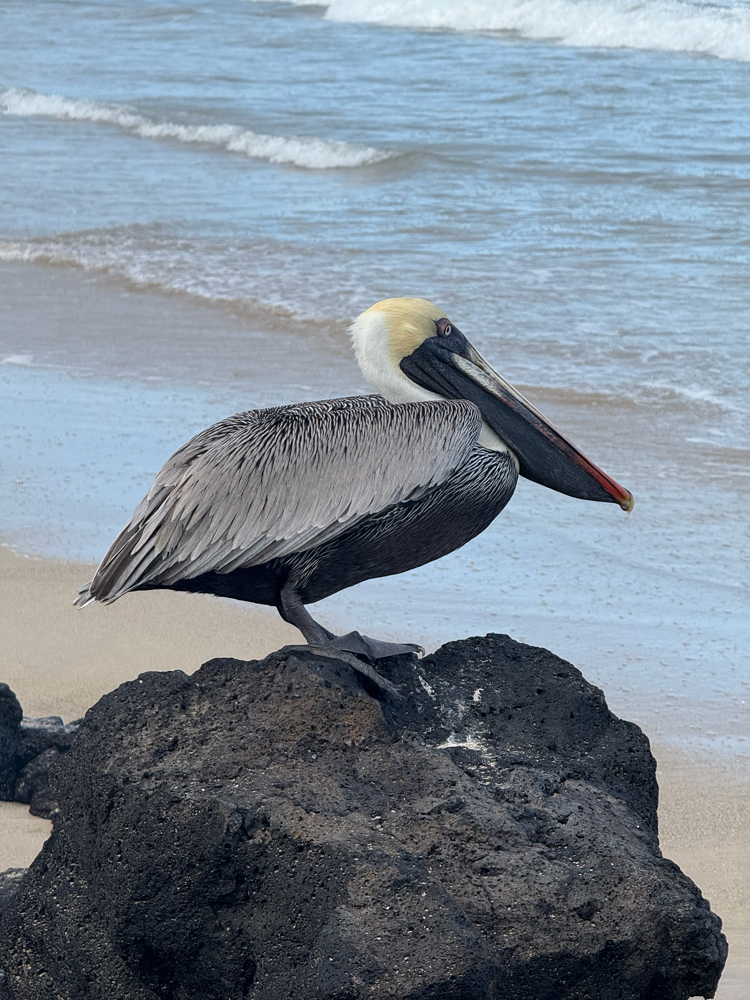

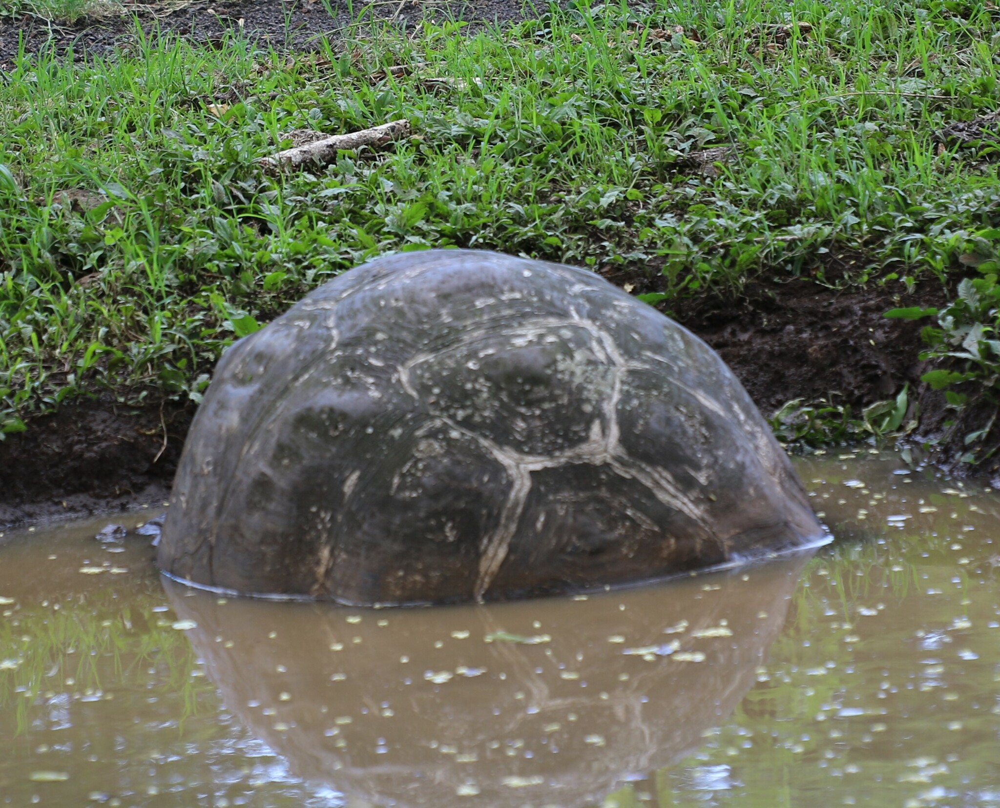

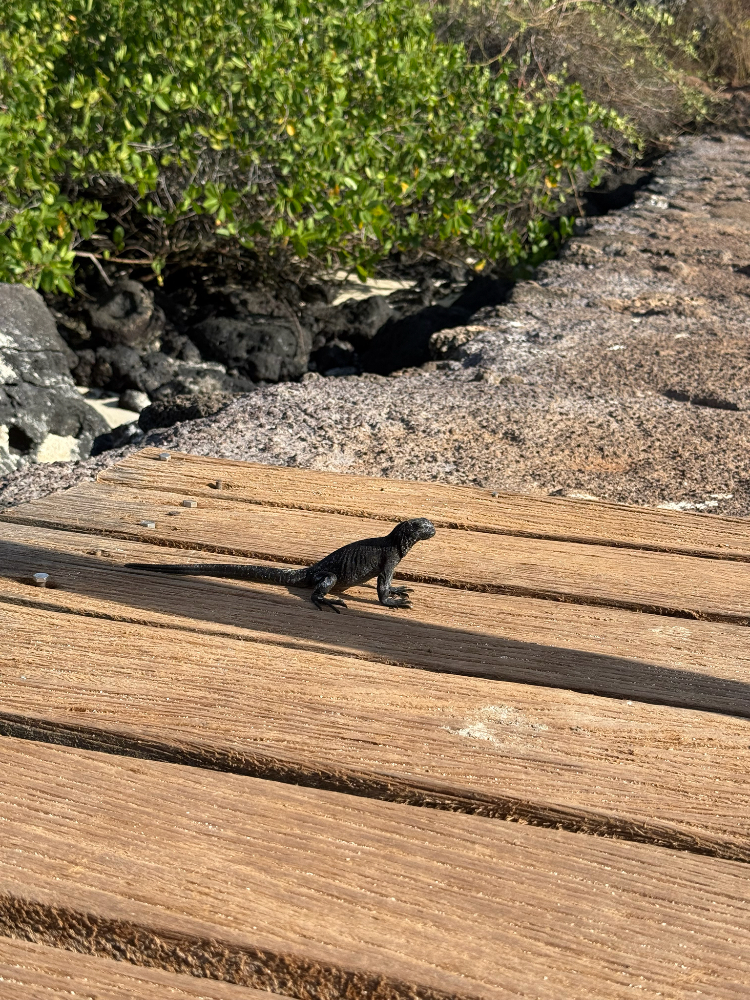

In [1]:
from IPython.display import Image, display
import os

# Visualiza 3 imágenes de entrenamiento
image_dir = "dataset_final_yolo_v8/images/train"
sample_images = os.listdir(image_dir)[:3]
for img in sample_images:
    display(Image(filename=os.path.join(image_dir, img)))


In [2]:
from pathlib import Path
import os

# Ruta base del dataset
dataset_path = Path("/home/jdominguez/Documentos/Cuadernos/PaulVisionDCC/dataset_final_yolo/dataset_final_yolo/obj_train_data")
assert dataset_path.exists(), f"❌ Ruta no encontrada: {dataset_path}"

# Crear un archivo dataset.yaml reproducible
yaml_content = """
path: /home/jdominguez/Documentos/Cuadernos/PaulVisionDCC/dataset_final_yolo/dataset_final_yolo
train: obj_train_data
val: obj_train_data
test: obj_train_data

names:
  0: iguana
  1: lobo_marino
  2: pelícano
  3: pingüino
  4: tortuga
"""

with open("dataset.yaml", "w") as f:
    f.write(yaml_content.strip())

print("✅ Archivo dataset.yaml generado correctamente.")


✅ Archivo dataset.yaml generado correctamente.


In [7]:
import os
os.remove("yolov8n.pt")


In [1]:
import torch
print(torch.__version__)  # ✅ Debe decir 2.1.2



A module that was compiled using NumPy 1.x cannot be run in
NumPy 2.2.6 as it may crash. To support both 1.x and 2.x
versions of NumPy, modules must be compiled with NumPy 2.0.
Some module may need to rebuild instead e.g. with 'pybind11>=2.12'.

If you are a user of the module, the easiest solution will be to
downgrade to 'numpy<2' or try to upgrade the affected module.
We expect that some modules will need time to support NumPy 2.

Traceback (most recent call last):  File "/home/jdominguez/anaconda3/envs/yolov8-galapagos/lib/python3.11/runpy.py", line 198, in _run_module_as_main
    return _run_code(code, main_globals, None,
  File "/home/jdominguez/anaconda3/envs/yolov8-galapagos/lib/python3.11/runpy.py", line 88, in _run_code
    exec(code, run_globals)
  File "/home/jdominguez/anaconda3/envs/yolov8-galapagos/lib/python3.11/site-packages/ipykernel_launcher.py", line 18, in <module>
    app.launch_new_instance()
  File "/home/jdominguez/anaconda3/envs/yolov8-galapagos/lib/python3.11

2.1.2+cu121


In [2]:
from ultralytics import YOLO

# Carga directa sin errores
model = YOLO("yolov8n.pt")


In [5]:
!pip uninstall numpy -y
!pip install numpy==1.24.4


Found existing installation: numpy 2.2.6
Uninstalling numpy-2.2.6:
  Successfully uninstalled numpy-2.2.6
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 17.3/17.3 MB 53.5 MB/s eta 0:00:00MB/s eta 0:00:01
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
scipy 1.16.1 requires numpy<2.6,>=1.25.2, but you have numpy 1.24.4 which is incompatible.
contourpy 1.3.3 requires numpy>=1.25, but you have numpy 1.24.4 which is incompatible.
opencv-python 4.12.0.88 requires numpy<2.3.0,>=2; python_version >= "3.9", but you have numpy 1.24.4 which is incompatible.


In [1]:
import numpy as np
import scipy
print("NumPy:", np.__version__)
print("SciPy:", scipy.__version__)


NumPy: 1.24.4
SciPy: 1.11.4


In [2]:
# Entrenar el modelo sobre el dataset personalizado
from ultralytics import YOLO

model = YOLO("yolov8n.pt")  # Modelo base (nano)

results = model.train(
    data="dataset.yaml",        # Tu archivo .yaml con clases y rutas
    epochs=100,                 # Número de épocas
    imgsz=640,                  # Tamaño de imagen (puedes aumentar a 800 o 960 si tienes GPU potente)
    batch=8,                    # Tamaño de lote
    name="galapagos_yolov8n",   # Nombre del experimento
    project="runs/train",       # Carpeta de resultados
    optimizer="Adam",           # Optimizador (puede cambiarse por SGD)
    device=0                    # GPU 0 (usa 'cpu' si no tienes GPU)
)


New https://pypi.org/project/ultralytics/8.3.170 available 😃 Update with 'pip install -U ultralytics'
Ultralytics YOLOv8.1.0 🚀 Python-3.11.13 torch-2.1.2+cu121 CUDA:0 (Quadro P1000, 4032MiB)
engine/trainer: task=detect, mode=train, model=yolov8n.pt, data=dataset.yaml, epochs=100, time=None, patience=50, batch=8, imgsz=640, save=True, save_period=-1, cache=False, device=0, workers=8, project=runs/train, name=galapagos_yolov8n10, exist_ok=False, pretrained=True, optimizer=Adam, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, sa

/home/jdominguez/anaconda3/envs/yolov8-galapagos/lib/python3.11/site-packages/torch/cuda/__init__.py:611: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")


Transferred 319/355 items from pretrained weights
Freezing layer 'model.22.dfl.conv.weight'
AMP: running Automatic Mixed Precision (AMP) checks with YOLOv8n...
AMP: checks passed ✅


train: Scanning /home/jdominguez/Documentos/Cuadernos/PaulVisionDCC/dataset_final_yolo/dataset_final_yolo/obj_train_data.cache... 148 images, 14 backgrounds, 1 corrupt: 100%|██████████| 148/148 [00:00<?, ?it/s]

train: WARNING ⚠️ /home/jdominguez/Documentos/Cuadernos/PaulVisionDCC/dataset_final_yolo/dataset_final_yolo/obj_train_data/Zalophus_wollebaeki_9.jpg: ignoring corrupt image/label: could not convert string to float: '0.551530g'



val: Scanning /home/jdominguez/Documentos/Cuadernos/PaulVisionDCC/dataset_final_yolo/dataset_final_yolo/obj_train_data.cache... 148 images, 14 backgrounds, 1 corrupt: 100%|██████████| 148/148 [00:00<?, ?it/s]

train: WARNING ⚠️ /home/jdominguez/Documentos/Cuadernos/PaulVisionDCC/dataset_final_yolo/dataset_final_yolo/obj_train_data/Zalophus_wollebaeki_9.jpg: ignoring corrupt image/label: could not convert string to float: '0.551530g'


Plotting labels to runs/train/galapagos_yolov8n10/labels.jpg... 
optimizer: Adam(lr=0.01, momentum=0.937) with parameter groups 57 weight(decay=0.0), 64 weight(decay=0.0005), 63 bias(decay=0.0)
100 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      1/100      1.24G      1.736      3.918      1.886          2        640: 100%|██████████| 19/19 [00:07<00:00,  2.49it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:02<00:00,  4.44it/s]

                   all        147        198    0.00149      0.404    0.00192   0.000578



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      2/100      1.26G      2.457      3.897      2.554          5        640: 100%|██████████| 19/19 [00:07<00:00,  2.59it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:05<00:00,  1.99it/s]

                   all        147        198   6.89e-05    0.00667    3.2e-05   6.41e-06



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      3/100      1.24G      2.658       3.84      2.745          5        640: 100%|██████████| 19/19 [00:07<00:00,  2.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:07<00:00,  1.40it/s]

                   all        147        198   6.89e-05    0.00667    3.2e-05   6.41e-06



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      4/100      1.24G      2.575      3.826      2.697         18        640: 100%|██████████| 19/19 [00:07<00:00,  2.60it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:08<00:00,  1.13it/s]

                   all        147        198   6.89e-05    0.00667    3.2e-05   6.41e-06



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      5/100      1.24G      2.721      3.944      2.729         15        640: 100%|██████████| 19/19 [00:07<00:00,  2.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:02<00:00,  4.42it/s]

                   all        147        198    7.2e-06     0.0069   3.73e-06   7.46e-07



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      6/100      1.24G      2.585      3.886      2.723          5        640: 100%|██████████| 19/19 [00:07<00:00,  2.58it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:04<00:00,  2.32it/s]

                   all        147        198   5.66e-05     0.0336   3.29e-05   7.02e-06



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      7/100      1.24G      2.628      3.874      2.742         11        640: 100%|██████████| 19/19 [00:07<00:00,  2.45it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:04<00:00,  2.46it/s]

                   all        147        198    0.00114      0.136   0.000712   0.000153



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      8/100      1.24G      2.604      3.879      2.695          7        640: 100%|██████████| 19/19 [00:08<00:00,  2.37it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:02<00:00,  3.64it/s]

                   all        147        198    0.00155      0.187   0.000957   0.000364



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      9/100      1.24G      2.499       3.87      2.612          6        640: 100%|██████████| 19/19 [00:08<00:00,  2.33it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:02<00:00,  3.90it/s]

                   all        147        198      0.401      0.176    0.00185   0.000649



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     10/100      1.24G      2.453      3.842      2.585          7        640: 100%|██████████| 19/19 [00:08<00:00,  2.35it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:02<00:00,  3.69it/s]

                   all        147        198   0.000703      0.155   0.000848   0.000221



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     11/100      1.24G       2.55      3.794      2.668          8        640: 100%|██████████| 19/19 [00:08<00:00,  2.30it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:02<00:00,  3.88it/s]

                   all        147        198      0.609       0.02    0.00461    0.00135



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     12/100      1.23G      2.372      3.753      2.519          6        640: 100%|██████████| 19/19 [00:08<00:00,  2.31it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:02<00:00,  3.92it/s]

                   all        147        198      0.604     0.0133    0.00325   0.000984



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     13/100      1.24G      2.504      3.782      2.642          8        640: 100%|██████████| 19/19 [00:08<00:00,  2.29it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:02<00:00,  3.92it/s]

                   all        147        198      0.641     0.0405     0.0155    0.00544



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     14/100      1.24G      2.498      3.711      2.617         13        640: 100%|██████████| 19/19 [00:08<00:00,  2.30it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:02<00:00,  4.04it/s]

                   all        147        198      0.814     0.0462     0.0111    0.00261



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     15/100      1.24G      2.329      3.616      2.489          5        640: 100%|██████████| 19/19 [00:08<00:00,  2.28it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:02<00:00,  3.74it/s]

                   all        147        198     0.0519     0.0372    0.00477   0.000698



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     16/100      1.24G      2.344      3.632       2.48          5        640: 100%|██████████| 19/19 [00:08<00:00,  2.28it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:02<00:00,  3.67it/s]

                   all        147        198    0.00353     0.0642     0.0011   0.000301



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     17/100      1.24G      2.426      3.653      2.515          7        640: 100%|██████████| 19/19 [00:08<00:00,  2.28it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:02<00:00,  3.90it/s]

                   all        147        198     0.0187      0.213     0.0127    0.00197



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     18/100      1.24G      2.343      3.643      2.449          7        640: 100%|██████████| 19/19 [00:08<00:00,  2.29it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:02<00:00,  3.95it/s]

                   all        147        198     0.0183      0.156     0.0194    0.00431



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     19/100      1.24G      2.335      3.562      2.476          8        640: 100%|██████████| 19/19 [00:08<00:00,  2.28it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:02<00:00,  3.91it/s]

                   all        147        198      0.741     0.0528      0.025    0.00599



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     20/100      1.23G      2.326      3.613      2.451          7        640: 100%|██████████| 19/19 [00:08<00:00,  2.28it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:02<00:00,  3.99it/s]

                   all        147        198      0.407     0.0523     0.0175    0.00566



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     21/100      1.24G      2.186      3.505      2.359         10        640: 100%|██████████| 19/19 [00:08<00:00,  2.28it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:02<00:00,  4.03it/s]

                   all        147        198      0.275      0.157     0.0351     0.0121



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     22/100      1.24G      2.275      3.545      2.435          7        640: 100%|██████████| 19/19 [00:08<00:00,  2.29it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:02<00:00,  3.92it/s]

                   all        147        198     0.0286      0.217     0.0238    0.00746



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     23/100      1.24G      2.213      3.584      2.389          5        640: 100%|██████████| 19/19 [00:08<00:00,  2.27it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:02<00:00,  3.97it/s]

                   all        147        198      0.947     0.0564     0.0846     0.0278



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     24/100      1.24G      2.223      3.444        2.4         10        640: 100%|██████████| 19/19 [00:08<00:00,  2.29it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:02<00:00,  3.87it/s]

                   all        147        198     0.0884     0.0967     0.0644     0.0249



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     25/100      1.24G      2.283      3.487      2.443          6        640: 100%|██████████| 19/19 [00:08<00:00,  2.27it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:02<00:00,  3.51it/s]

                   all        147        198      0.548     0.0899     0.0364      0.014



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     26/100      1.24G      2.184      3.534      2.315          6        640: 100%|██████████| 19/19 [00:08<00:00,  2.28it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:02<00:00,  3.65it/s]

                   all        147        198       0.44     0.0908      0.032     0.0119



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     27/100      1.24G      2.193      3.455       2.33         12        640: 100%|██████████| 19/19 [00:08<00:00,  2.28it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:02<00:00,  3.63it/s]

                   all        147        198      0.661      0.134     0.0639     0.0229



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     28/100      1.23G      2.292      3.501      2.403          7        640: 100%|██████████| 19/19 [00:08<00:00,  2.27it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:02<00:00,  3.88it/s]

                   all        147        198       0.92     0.0718     0.0983     0.0336



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     29/100      1.25G       2.23      3.463      2.369          8        640: 100%|██████████| 19/19 [00:08<00:00,  2.29it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:02<00:00,  3.97it/s]

                   all        147        198      0.861     0.0872     0.0828     0.0282



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     30/100      1.24G      2.226      3.471      2.367         17        640: 100%|██████████| 19/19 [00:08<00:00,  2.27it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:02<00:00,  4.01it/s]

                   all        147        198      0.422     0.0974     0.0497     0.0174



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     31/100      1.24G      2.155      3.427      2.302         13        640: 100%|██████████| 19/19 [00:08<00:00,  2.26it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:02<00:00,  4.01it/s]

                   all        147        198      0.562      0.107      0.119      0.047



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     32/100      1.24G      2.185      3.402      2.275          6        640: 100%|██████████| 19/19 [00:08<00:00,  2.28it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:02<00:00,  4.02it/s]

                   all        147        198      0.548     0.0971      0.117     0.0424



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     33/100      1.24G      2.089      3.355      2.231          6        640: 100%|██████████| 19/19 [00:08<00:00,  2.27it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:02<00:00,  4.02it/s]

                   all        147        198       0.91      0.128       0.15     0.0522



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     34/100      1.26G      2.131      3.197      2.212          6        640: 100%|██████████| 19/19 [00:08<00:00,  2.28it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:02<00:00,  3.99it/s]

                   all        147        198      0.896     0.0923      0.126     0.0434



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     35/100      1.25G      2.138      3.282      2.218         20        640: 100%|██████████| 19/19 [00:08<00:00,  2.27it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:02<00:00,  4.01it/s]

                   all        147        198       0.16       0.22     0.0998     0.0301



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     36/100      1.23G      2.133      3.258      2.235          4        640: 100%|██████████| 19/19 [00:08<00:00,  2.27it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:02<00:00,  3.94it/s]

                   all        147        198      0.341      0.153      0.127     0.0522



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     37/100      1.24G      2.068      3.195      2.156          3        640: 100%|██████████| 19/19 [00:08<00:00,  2.28it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:02<00:00,  3.93it/s]

                   all        147        198      0.318      0.188      0.118     0.0527



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     38/100      1.24G      2.095      3.133      2.178          7        640: 100%|██████████| 19/19 [00:08<00:00,  2.25it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:02<00:00,  3.97it/s]

                   all        147        198      0.398      0.197      0.129     0.0557



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     39/100      1.25G      2.094       3.17      2.195          5        640: 100%|██████████| 19/19 [00:08<00:00,  2.27it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:02<00:00,  4.00it/s]

                   all        147        198      0.529      0.161      0.126     0.0508



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     40/100      1.24G      2.046       3.04      2.156          9        640: 100%|██████████| 19/19 [00:08<00:00,  2.27it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:02<00:00,  4.00it/s]

                   all        147        198      0.426      0.177      0.137      0.052



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     41/100      1.24G      2.066      3.006      2.113          9        640: 100%|██████████| 19/19 [00:08<00:00,  2.27it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:02<00:00,  4.01it/s]

                   all        147        198      0.137      0.177      0.153     0.0554



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     42/100      1.24G      1.997      3.013      2.157          9        640: 100%|██████████| 19/19 [00:08<00:00,  2.28it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:02<00:00,  4.03it/s]

                   all        147        198       0.15       0.19      0.113     0.0378



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     43/100      1.24G      2.059      3.025      2.169          8        640: 100%|██████████| 19/19 [00:08<00:00,  2.27it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:02<00:00,  4.04it/s]

                   all        147        198      0.491      0.137      0.181     0.0701



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     44/100      1.23G      2.063      3.028      2.173         10        640: 100%|██████████| 19/19 [00:08<00:00,  2.27it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:02<00:00,  4.02it/s]

                   all        147        198      0.167      0.174      0.161     0.0728



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     45/100      1.24G       2.03      3.037      2.153          4        640: 100%|██████████| 19/19 [00:08<00:00,  2.28it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:02<00:00,  4.01it/s]

                   all        147        198      0.288      0.238      0.176     0.0771



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     46/100      1.24G      2.062      3.035       2.15         14        640: 100%|██████████| 19/19 [00:08<00:00,  2.27it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:02<00:00,  4.01it/s]

                   all        147        198       0.28       0.21      0.201     0.0814



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     47/100      1.24G      1.939      2.942      2.113         23        640: 100%|██████████| 19/19 [00:08<00:00,  2.28it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:02<00:00,  3.98it/s]

                   all        147        198      0.416      0.145      0.175     0.0713



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     48/100      1.24G      2.025      2.919       2.15          9        640: 100%|██████████| 19/19 [00:08<00:00,  2.28it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:02<00:00,  3.98it/s]

                   all        147        198      0.168      0.232      0.152     0.0587



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     49/100      1.24G      1.997      3.053      2.106         15        640: 100%|██████████| 19/19 [00:08<00:00,  2.27it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:02<00:00,  4.01it/s]

                   all        147        198      0.598      0.173      0.164     0.0749



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     50/100      1.24G      1.994      2.902      2.144          8        640: 100%|██████████| 19/19 [00:08<00:00,  2.27it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:02<00:00,  4.04it/s]

                   all        147        198      0.195       0.26      0.228      0.106



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     51/100      1.24G      1.951      2.829      2.035         10        640: 100%|██████████| 19/19 [00:08<00:00,  2.28it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:02<00:00,  4.04it/s]

                   all        147        198      0.202      0.303       0.24      0.113



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     52/100      1.26G       1.96      2.796      2.057          9        640: 100%|██████████| 19/19 [00:08<00:00,  2.27it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:02<00:00,  4.04it/s]

                   all        147        198      0.336      0.213      0.124     0.0453



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     53/100      1.24G       1.98      2.933      2.092         14        640: 100%|██████████| 19/19 [00:08<00:00,  2.27it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:02<00:00,  4.02it/s]

                   all        147        198       0.39      0.208      0.164      0.058



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     54/100      1.24G      1.937      2.936      2.107          6        640: 100%|██████████| 19/19 [00:08<00:00,  2.27it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:02<00:00,  4.01it/s]

                   all        147        198      0.231      0.216      0.245      0.106



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     55/100      1.24G      2.021      2.873      2.113          5        640: 100%|██████████| 19/19 [00:08<00:00,  2.26it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:02<00:00,  3.98it/s]

                   all        147        198      0.183      0.299      0.237      0.103



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     56/100      1.24G      1.969      2.829      2.091          7        640: 100%|██████████| 19/19 [00:08<00:00,  2.27it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:02<00:00,  4.00it/s]

                   all        147        198       0.33      0.324      0.287       0.12



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     57/100      1.24G       1.96      2.852      2.027         16        640: 100%|██████████| 19/19 [00:08<00:00,  2.27it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:02<00:00,  4.03it/s]

                   all        147        198      0.432      0.306       0.31      0.141



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     58/100      1.24G      1.928      2.847      2.068          4        640: 100%|██████████| 19/19 [00:08<00:00,  2.28it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:02<00:00,  4.01it/s]

                   all        147        198      0.364      0.254       0.28      0.131



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     59/100      1.24G      1.917      2.777      2.044         14        640: 100%|██████████| 19/19 [00:08<00:00,  2.28it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:02<00:00,  4.03it/s]

                   all        147        198      0.453      0.231      0.293      0.131



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     60/100      1.23G      1.954      2.799      2.068         19        640: 100%|██████████| 19/19 [00:08<00:00,  2.27it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:02<00:00,  4.05it/s]

                   all        147        198      0.718      0.189      0.256      0.107



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     61/100      1.24G      1.949      2.908      2.075          5        640: 100%|██████████| 19/19 [00:08<00:00,  2.27it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:02<00:00,  4.04it/s]

                   all        147        198      0.255      0.287      0.273      0.126



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     62/100      1.24G      1.922       2.82      2.045         16        640: 100%|██████████| 19/19 [00:08<00:00,  2.27it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:02<00:00,  4.02it/s]

                   all        147        198      0.392      0.267      0.295      0.136



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     63/100      1.24G      1.871      2.695      1.997          6        640: 100%|██████████| 19/19 [00:08<00:00,  2.27it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:02<00:00,  4.03it/s]

                   all        147        198      0.245      0.306      0.323      0.154



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     64/100      1.24G      1.885      2.695      1.974         13        640: 100%|██████████| 19/19 [00:08<00:00,  2.28it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:02<00:00,  4.02it/s]

                   all        147        198      0.284      0.346       0.33       0.16



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     65/100      1.24G      1.823      2.613      1.956         12        640: 100%|██████████| 19/19 [00:08<00:00,  2.27it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:02<00:00,  4.06it/s]

                   all        147        198      0.894      0.214      0.309      0.156



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     66/100      1.24G      1.908      2.696      2.001         13        640: 100%|██████████| 19/19 [00:08<00:00,  2.27it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:02<00:00,  4.04it/s]

                   all        147        198      0.778      0.241      0.332      0.171



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     67/100      1.25G        1.9      2.552      2.007          6        640: 100%|██████████| 19/19 [00:08<00:00,  2.28it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:02<00:00,  4.04it/s]

                   all        147        198      0.312      0.289      0.333      0.167



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     68/100      1.23G      1.834      2.553      1.921         20        640: 100%|██████████| 19/19 [00:08<00:00,  2.27it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:02<00:00,  4.05it/s]

                   all        147        198      0.356       0.35      0.311      0.148



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     69/100      1.24G      1.817      2.585      1.925         13        640: 100%|██████████| 19/19 [00:08<00:00,  2.27it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:02<00:00,  4.04it/s]

                   all        147        198      0.313      0.379      0.308      0.152



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     70/100      1.26G      1.845      2.705      1.978         10        640: 100%|██████████| 19/19 [00:08<00:00,  2.27it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:02<00:00,  4.02it/s]

                   all        147        198      0.323      0.396      0.314       0.16



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     71/100      1.24G      1.784      2.541       1.93         10        640: 100%|██████████| 19/19 [00:08<00:00,  2.27it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:02<00:00,  4.04it/s]

                   all        147        198      0.341      0.384      0.299      0.164



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     72/100      1.24G      1.821      2.628      1.957          5        640: 100%|██████████| 19/19 [00:08<00:00,  2.28it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:02<00:00,  3.99it/s]

                   all        147        198      0.381      0.361      0.313      0.167



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     73/100      1.24G       1.77      2.485      1.935          7        640: 100%|██████████| 19/19 [00:08<00:00,  2.26it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:02<00:00,  4.02it/s]

                   all        147        198      0.277      0.352      0.281      0.141



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     74/100      1.24G      1.771      2.625      1.914         12        640: 100%|██████████| 19/19 [00:08<00:00,  2.28it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:02<00:00,  4.02it/s]

                   all        147        198      0.269      0.333        0.3       0.15



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     75/100      1.24G      1.798      2.551      1.899          7        640: 100%|██████████| 19/19 [00:08<00:00,  2.27it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:02<00:00,  4.02it/s]

                   all        147        198      0.216      0.299      0.283      0.146



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     76/100      1.23G      1.819      2.648      1.923          9        640: 100%|██████████| 19/19 [00:08<00:00,  2.28it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:02<00:00,  4.03it/s]

                   all        147        198      0.701      0.234      0.277      0.149



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     77/100      1.24G      1.801      2.548      1.906         14        640: 100%|██████████| 19/19 [00:08<00:00,  2.28it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:02<00:00,  4.01it/s]

                   all        147        198      0.289      0.325      0.296      0.149



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     78/100      1.24G      1.779      2.668       1.94          8        640: 100%|██████████| 19/19 [00:08<00:00,  2.28it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:02<00:00,  4.03it/s]

                   all        147        198      0.319      0.316      0.308      0.165



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     79/100      1.25G      1.761      2.555      1.885          6        640: 100%|██████████| 19/19 [00:08<00:00,  2.26it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:02<00:00,  4.06it/s]

                   all        147        198      0.394      0.359      0.352      0.186



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     80/100      1.25G      1.778      2.471       1.89         10        640: 100%|██████████| 19/19 [00:08<00:00,  2.28it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:02<00:00,  4.04it/s]

                   all        147        198        0.5      0.411       0.39      0.205



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     81/100      1.24G      1.696      2.447      1.838          5        640: 100%|██████████| 19/19 [00:08<00:00,  2.28it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:02<00:00,  4.05it/s]

                   all        147        198      0.631      0.372      0.405      0.202



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     82/100      1.24G      1.694      2.457      1.858          3        640: 100%|██████████| 19/19 [00:08<00:00,  2.27it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:02<00:00,  4.04it/s]

                   all        147        198      0.535      0.372       0.41      0.211



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     83/100      1.25G      1.758       2.47      1.887         13        640: 100%|██████████| 19/19 [00:08<00:00,  2.28it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:02<00:00,  4.01it/s]

                   all        147        198      0.608      0.377      0.408       0.21



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     84/100      1.23G      1.682      2.475      1.869         13        640: 100%|██████████| 19/19 [00:08<00:00,  2.27it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:02<00:00,  4.02it/s]

                   all        147        198      0.466      0.399      0.384      0.207



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     85/100      1.24G      1.692      2.355      1.844         11        640: 100%|██████████| 19/19 [00:08<00:00,  2.28it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:02<00:00,  4.04it/s]

                   all        147        198      0.484      0.405      0.409      0.219



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     86/100      1.24G      1.666      2.332      1.809          8        640: 100%|██████████| 19/19 [00:08<00:00,  2.28it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:02<00:00,  4.02it/s]

                   all        147        198      0.322      0.482      0.405      0.223



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     87/100      1.24G      1.667      2.326      1.776          8        640: 100%|██████████| 19/19 [00:08<00:00,  2.27it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:02<00:00,  4.02it/s]

                   all        147        198      0.353      0.418      0.408      0.215



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     88/100      1.24G      1.758      2.373      1.872         14        640: 100%|██████████| 19/19 [00:08<00:00,  2.27it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:02<00:00,  4.02it/s]

                   all        147        198      0.393      0.428      0.416      0.221



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     89/100      1.26G      1.694      2.418      1.861         12        640: 100%|██████████| 19/19 [00:08<00:00,  2.27it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:02<00:00,  4.03it/s]

                   all        147        198      0.431      0.381      0.427      0.233



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     90/100      1.24G      1.689      2.295      1.859          9        640: 100%|██████████| 19/19 [00:08<00:00,  2.28it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:02<00:00,  4.06it/s]

                   all        147        198      0.423      0.448      0.431      0.236


Closing dataloader mosaic

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     91/100      1.24G      1.726      2.471      1.958          3        640: 100%|██████████| 19/19 [00:08<00:00,  2.18it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:02<00:00,  4.03it/s]

                   all        147        198      0.474      0.399      0.437      0.243



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     92/100      1.23G      1.746      2.525      2.049          4        640: 100%|██████████| 19/19 [00:08<00:00,  2.29it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:02<00:00,  4.06it/s]

                   all        147        198       0.63      0.416      0.462      0.257



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     93/100      1.24G      1.692      2.461      1.995          3        640: 100%|██████████| 19/19 [00:08<00:00,  2.30it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:02<00:00,  4.07it/s]

                   all        147        198      0.666      0.402      0.464      0.262



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     94/100      1.24G      1.668      2.406      1.986          4        640: 100%|██████████| 19/19 [00:08<00:00,  2.29it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:02<00:00,  4.05it/s]

                   all        147        198      0.618      0.416      0.475      0.265



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     95/100      1.24G      1.767      2.379      2.055          4        640: 100%|██████████| 19/19 [00:08<00:00,  2.29it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:02<00:00,  4.06it/s]

                   all        147        198      0.626      0.447      0.492      0.276



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     96/100      1.25G      1.682      2.336      1.967          3        640: 100%|██████████| 19/19 [00:08<00:00,  2.31it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:02<00:00,  4.07it/s]

                   all        147        198      0.576      0.479      0.504      0.284



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     97/100      1.24G      1.637      2.278      1.932          4        640: 100%|██████████| 19/19 [00:08<00:00,  2.29it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:02<00:00,  4.08it/s]

                   all        147        198      0.541      0.491      0.498      0.277



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     98/100      1.24G      1.608      2.319      1.918          6        640: 100%|██████████| 19/19 [00:08<00:00,  2.29it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:02<00:00,  4.04it/s]

                   all        147        198      0.604       0.45      0.501      0.287



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     99/100      1.24G        1.7      2.396       1.98          4        640: 100%|██████████| 19/19 [00:08<00:00,  2.29it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:02<00:00,  4.07it/s]

                   all        147        198      0.643      0.477      0.517      0.294



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    100/100      1.23G      1.716      2.239      1.964          6        640: 100%|██████████| 19/19 [00:08<00:00,  2.29it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:02<00:00,  4.06it/s]

                   all        147        198      0.592      0.473      0.519      0.296



100 epochs completed in 0.314 hours.
Optimizer stripped from runs/train/galapagos_yolov8n10/weights/last.pt, 6.2MB
Optimizer stripped from runs/train/galapagos_yolov8n10/weights/best.pt, 6.2MB

Validating runs/train/galapagos_yolov8n10/weights/best.pt...
Ultralytics YOLOv8.1.0 🚀 Python-3.11.13 torch-2.1.2+cu121 CUDA:0 (Quadro P1000, 4032MiB)
Model summary (fused): 168 layers, 3006623 parameters, 0 gradients, 8.1 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:02<00:00,  4.15it/s]


                   all        147        198      0.593      0.474       0.52      0.296
                iguana        147         62      0.537      0.145      0.224      0.107
           lobo_marino        147         29      0.687      0.152      0.316      0.154
              pelícano        147         38       0.57      0.632      0.648      0.361
              pingüino        147         30      0.477      0.567      0.532      0.263
               tortuga        147         39      0.693      0.872      0.879      0.597
Speed: 0.6ms preprocess, 13.3ms inference, 0.0ms loss, 0.6ms postprocess per image
Results saved to runs/train/galapagos_yolov8n10


In [3]:
results = model.train(
    data="dataset.yaml",
    epochs=200,            # Más épocas
    imgsz=800,             # Imágenes más grandes
    batch=8,
    name="galapagos_yolov8n_aug",
    mosaic=1.0,            # Activar mosaic augmentation
    hsv_h=0.015, hsv_s=0.7, hsv_v=0.4,  # Perturbaciones de color
    flipud=0.5, fliplr=0.5,  # Volteos horizontales y verticales
    degrees=10, translate=0.1, scale=0.5, shear=2.0,
    device=0
)


New https://pypi.org/project/ultralytics/8.3.170 available 😃 Update with 'pip install -U ultralytics'
Ultralytics YOLOv8.1.0 🚀 Python-3.11.13 torch-2.1.2+cu121 CUDA:0 (Quadro P1000, 4032MiB)
engine/trainer: task=detect, mode=train, model=yolov8n.pt, data=dataset.yaml, epochs=200, time=None, patience=50, batch=8, imgsz=800, save=True, save_period=-1, cache=False, device=0, workers=8, project=runs/train, name=galapagos_yolov8n_aug, exist_ok=False, pretrained=True, optimizer=Adam, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, 

train: Scanning /home/jdominguez/Documentos/Cuadernos/PaulVisionDCC/dataset_final_yolo/dataset_final_yolo/obj_train_data.cache... 148 images, 14 backgrounds, 1 corrupt: 100%|██████████| 148/148 [00:00<?, ?it/s]

train: WARNING ⚠️ /home/jdominguez/Documentos/Cuadernos/PaulVisionDCC/dataset_final_yolo/dataset_final_yolo/obj_train_data/Zalophus_wollebaeki_9.jpg: ignoring corrupt image/label: could not convert string to float: '0.551530g'



val: Scanning /home/jdominguez/Documentos/Cuadernos/PaulVisionDCC/dataset_final_yolo/dataset_final_yolo/obj_train_data.cache... 148 images, 14 backgrounds, 1 corrupt: 100%|██████████| 148/148 [00:00<?, ?it/s]

train: WARNING ⚠️ /home/jdominguez/Documentos/Cuadernos/PaulVisionDCC/dataset_final_yolo/dataset_final_yolo/obj_train_data/Zalophus_wollebaeki_9.jpg: ignoring corrupt image/label: could not convert string to float: '0.551530g'


Plotting labels to runs/train/galapagos_yolov8n_aug/labels.jpg... 
optimizer: Adam(lr=0.01, momentum=0.937) with parameter groups 57 weight(decay=0.0), 64 weight(decay=0.0005), 63 bias(decay=0.0)
200 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      1/200      1.86G       2.23      3.242      2.503          4        800: 100%|██████████| 19/19 [00:11<00:00,  1.66it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:03<00:00,  2.80it/s]

                   all        147        198      0.336      0.133      0.103     0.0442



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      2/200      1.87G      2.129      3.155      2.376          6        800: 100%|██████████| 19/19 [00:11<00:00,  1.68it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:03<00:00,  2.91it/s]

                   all        147        198      0.663     0.0754     0.0504     0.0177



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      3/200      1.84G      2.125      3.247      2.369          5        800: 100%|██████████| 19/19 [00:11<00:00,  1.69it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:03<00:00,  3.13it/s]

                   all        147        198      0.515      0.176     0.0701     0.0218



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      4/200      1.87G      2.169      3.113      2.388         18        800: 100%|██████████| 19/19 [00:11<00:00,  1.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:03<00:00,  2.96it/s]

                   all        147        198     0.0568      0.145     0.0408     0.0118



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      5/200      1.84G      2.251      3.317      2.415         15        800: 100%|██████████| 19/19 [00:12<00:00,  1.52it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:03<00:00,  2.90it/s]

                   all        147        198     0.0785      0.213     0.0616     0.0203



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      6/200      1.87G      2.174      3.305       2.44          5        800: 100%|██████████| 19/19 [00:12<00:00,  1.49it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:03<00:00,  2.82it/s]

                   all        147        198      0.236      0.132     0.0177    0.00532



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      7/200      1.87G      2.224      3.392      2.467         11        800: 100%|██████████| 19/19 [00:12<00:00,  1.48it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:03<00:00,  2.75it/s]

                   all        147        198      0.855     0.0158     0.0146    0.00571



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      8/200      1.84G      2.201      3.365      2.437          8        800: 100%|██████████| 19/19 [00:12<00:00,  1.48it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:03<00:00,  2.73it/s]

                   all        147        198      0.541     0.0782     0.0841     0.0334



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      9/200      1.87G      2.215      3.304      2.486          6        800: 100%|██████████| 19/19 [00:12<00:00,  1.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:03<00:00,  2.68it/s]

                   all        147        198      0.296      0.071     0.0727     0.0229



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     10/200      1.87G      2.155      3.303      2.418          7        800: 100%|██████████| 19/19 [00:12<00:00,  1.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:03<00:00,  2.73it/s]

                   all        147        198       0.46      0.116     0.0133    0.00319



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     11/200      1.87G       2.21      3.328      2.518          8        800: 100%|██████████| 19/19 [00:12<00:00,  1.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:03<00:00,  2.72it/s]

                   all        147        198      0.671     0.0727     0.0385     0.0124



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     12/200      1.83G       2.13      3.341      2.451          7        800: 100%|██████████| 19/19 [00:12<00:00,  1.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:03<00:00,  2.72it/s]

                   all        147        198      0.626     0.0564     0.0342     0.0123



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     13/200      1.84G      2.239      3.415       2.52          9        800: 100%|██████████| 19/19 [00:12<00:00,  1.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:03<00:00,  2.79it/s]

                   all        147        198      0.628     0.0877     0.0449      0.015



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     14/200      1.84G      2.181      3.296      2.473         13        800: 100%|██████████| 19/19 [00:12<00:00,  1.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:03<00:00,  2.72it/s]

                   all        147        198      0.661     0.0571      0.044     0.0125



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     15/200      1.87G      2.156      3.319      2.428          6        800: 100%|██████████| 19/19 [00:12<00:00,  1.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:03<00:00,  2.70it/s]

                   all        147        198      0.407     0.0103    0.00494    0.00157



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     16/200      1.87G      2.145      3.379      2.422          6        800: 100%|██████████| 19/19 [00:12<00:00,  1.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:03<00:00,  2.68it/s]

                   all        147        198       0.51     0.0426     0.0455    0.00985



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     17/200      1.87G      2.136      3.362      2.398          7        800: 100%|██████████| 19/19 [00:12<00:00,  1.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:04<00:00,  2.43it/s]

                   all        147        198     0.0444     0.0996     0.0346     0.0131



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     18/200      1.87G      2.119      3.275      2.401          7        800: 100%|██████████| 19/19 [00:12<00:00,  1.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:03<00:00,  2.50it/s]

                   all        147        198      0.458      0.139     0.0321    0.00937



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     19/200      1.87G      2.144       3.17      2.368          8        800: 100%|██████████| 19/19 [00:12<00:00,  1.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:03<00:00,  2.66it/s]

                   all        147        198       0.48      0.129     0.0422     0.0131



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     20/200      1.86G      2.163       3.23      2.394          7        800: 100%|██████████| 19/19 [00:12<00:00,  1.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:03<00:00,  2.74it/s]

                   all        147        198      0.496      0.192     0.0987     0.0306



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     21/200      1.87G      2.073      3.159      2.328         10        800: 100%|██████████| 19/19 [00:12<00:00,  1.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:03<00:00,  2.78it/s]

                   all        147        198      0.581      0.181      0.155     0.0511



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     22/200      1.88G      2.067      3.178       2.33          7        800: 100%|██████████| 19/19 [00:12<00:00,  1.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:03<00:00,  2.78it/s]

                   all        147        198      0.638      0.206      0.181     0.0607



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     23/200      1.87G      2.118       3.21      2.414          5        800: 100%|██████████| 19/19 [00:12<00:00,  1.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:03<00:00,  2.78it/s]

                   all        147        198      0.398      0.149      0.157      0.051



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     24/200      1.87G      2.118      3.097      2.396         10        800: 100%|██████████| 19/19 [00:12<00:00,  1.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:03<00:00,  2.76it/s]

                   all        147        198      0.357      0.173      0.128     0.0417



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     25/200      1.86G       2.09      3.166      2.395          7        800: 100%|██████████| 19/19 [00:12<00:00,  1.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:03<00:00,  2.66it/s]

                   all        147        198      0.563     0.0979     0.0719     0.0251



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     26/200      1.87G      2.061      3.161      2.353          5        800: 100%|██████████| 19/19 [00:12<00:00,  1.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:03<00:00,  2.71it/s]

                   all        147        198      0.189      0.173      0.147       0.05



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     27/200      1.87G      2.085      3.118      2.394         13        800: 100%|██████████| 19/19 [00:12<00:00,  1.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:03<00:00,  2.72it/s]

                   all        147        198      0.595      0.197      0.173     0.0611



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     28/200      1.84G      2.104      3.109      2.397          7        800: 100%|██████████| 19/19 [00:12<00:00,  1.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:03<00:00,  2.64it/s]

                   all        147        198      0.353      0.145      0.112     0.0334



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     29/200      1.85G      2.052      3.167      2.359          8        800: 100%|██████████| 19/19 [00:12<00:00,  1.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:03<00:00,  2.55it/s]

                   all        147        198      0.268      0.146       0.06     0.0147



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     30/200      1.88G      2.047      3.125      2.336         16        800: 100%|██████████| 19/19 [00:12<00:00,  1.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:03<00:00,  2.67it/s]

                   all        147        198      0.467      0.125      0.056     0.0151



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     31/200      1.87G      2.058      3.136      2.358         13        800: 100%|██████████| 19/19 [00:12<00:00,  1.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:03<00:00,  2.74it/s]

                   all        147        198       0.29      0.211        0.2     0.0749



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     32/200      1.87G      2.048      3.203      2.357          7        800: 100%|██████████| 19/19 [00:12<00:00,  1.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:03<00:00,  2.78it/s]

                   all        147        198      0.604      0.151       0.15     0.0558



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     33/200      1.87G      2.032      3.272      2.383          6        800: 100%|██████████| 19/19 [00:12<00:00,  1.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:03<00:00,  2.77it/s]

                   all        147        198      0.708      0.168      0.208      0.079



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     34/200      1.85G      2.106      3.111      2.374          7        800: 100%|██████████| 19/19 [00:12<00:00,  1.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:03<00:00,  2.77it/s]

                   all        147        198       0.19      0.304       0.17     0.0678



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     35/200      1.85G      2.019      3.083      2.247         20        800: 100%|██████████| 19/19 [00:12<00:00,  1.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:03<00:00,  2.76it/s]

                   all        147        198      0.198      0.313      0.188     0.0737



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     36/200      1.86G      2.037      3.114       2.33          5        800: 100%|██████████| 19/19 [00:12<00:00,  1.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:03<00:00,  2.74it/s]

                   all        147        198      0.206      0.274      0.175     0.0647



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     37/200      1.87G      1.998      3.066      2.291          3        800: 100%|██████████| 19/19 [00:12<00:00,  1.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:03<00:00,  2.75it/s]

                   all        147        198      0.419      0.207      0.152     0.0595



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     38/200      1.87G       2.09      3.149      2.364          8        800: 100%|██████████| 19/19 [00:12<00:00,  1.46it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:03<00:00,  2.74it/s]

                   all        147        198      0.317       0.18      0.112     0.0352



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     39/200      1.85G      2.084      3.076      2.346          5        800: 100%|██████████| 19/19 [00:12<00:00,  1.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:03<00:00,  2.70it/s]

                   all        147        198      0.374      0.177      0.103     0.0344



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     40/200      1.87G       2.06      3.042      2.341          9        800: 100%|██████████| 19/19 [00:12<00:00,  1.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:03<00:00,  2.67it/s]

                   all        147        198      0.109      0.169     0.0806      0.027



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     41/200      1.85G      2.046      2.933      2.289         10        800: 100%|██████████| 19/19 [00:12<00:00,  1.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:03<00:00,  2.61it/s]

                   all        147        198      0.401      0.207      0.145     0.0559



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     42/200      1.87G      1.992      2.965      2.308         10        800: 100%|██████████| 19/19 [00:12<00:00,  1.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:03<00:00,  2.67it/s]

                   all        147        198      0.509      0.191     0.0809      0.034



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     43/200      1.87G      2.055      3.064        2.3          8        800: 100%|██████████| 19/19 [00:12<00:00,  1.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:03<00:00,  2.75it/s]

                   all        147        198      0.508      0.235     0.0987     0.0343



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     44/200      1.86G      1.951      3.022      2.245          9        800: 100%|██████████| 19/19 [00:12<00:00,  1.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:03<00:00,  2.76it/s]

                   all        147        198      0.624      0.253      0.186      0.076



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     45/200      1.87G      1.982      3.017      2.293          4        800: 100%|██████████| 19/19 [00:12<00:00,  1.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:03<00:00,  2.76it/s]

                   all        147        198       0.16      0.298      0.187     0.0679



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     46/200      1.87G      2.027      2.957      2.268         14        800: 100%|██████████| 19/19 [00:12<00:00,  1.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:03<00:00,  2.77it/s]

                   all        147        198      0.349      0.231      0.168     0.0548



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     47/200      1.87G      1.997      3.013      2.318         23        800: 100%|██████████| 19/19 [00:12<00:00,  1.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:03<00:00,  2.79it/s]

                   all        147        198       0.24      0.179       0.13     0.0436



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     48/200      1.88G      2.013      3.046      2.321          9        800: 100%|██████████| 19/19 [00:12<00:00,  1.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:03<00:00,  2.76it/s]

                   all        147        198      0.247      0.257      0.186     0.0552



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     49/200      1.87G      2.019      3.029      2.274         15        800: 100%|██████████| 19/19 [00:12<00:00,  1.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:03<00:00,  2.75it/s]

                   all        147        198      0.274      0.245      0.149     0.0487



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     50/200      1.87G      1.953      2.998      2.277          9        800: 100%|██████████| 19/19 [00:12<00:00,  1.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:03<00:00,  2.75it/s]

                   all        147        198      0.603      0.313       0.24     0.0856



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     51/200      1.87G      2.019      2.861      2.263         10        800: 100%|██████████| 19/19 [00:12<00:00,  1.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:03<00:00,  2.76it/s]

                   all        147        198      0.767      0.207      0.213     0.0906



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     52/200      1.84G      1.966      2.888      2.225         10        800: 100%|██████████| 19/19 [00:12<00:00,  1.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:03<00:00,  2.77it/s]

                   all        147        198      0.699      0.152      0.184     0.0631



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     53/200      1.87G      1.941      2.912      2.219         14        800: 100%|██████████| 19/19 [00:12<00:00,  1.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:03<00:00,  2.77it/s]

                   all        147        198      0.606      0.248      0.214     0.0722



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     54/200      1.87G      1.936      2.926      2.273          6        800: 100%|██████████| 19/19 [00:12<00:00,  1.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:03<00:00,  2.77it/s]

                   all        147        198      0.431      0.285      0.203     0.0683



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     55/200      1.87G      2.044      2.872      2.285          5        800: 100%|██████████| 19/19 [00:12<00:00,  1.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:03<00:00,  2.77it/s]

                   all        147        198      0.431      0.239      0.202     0.0731



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     56/200      1.84G      1.958      2.903      2.225          7        800: 100%|██████████| 19/19 [00:12<00:00,  1.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:03<00:00,  2.76it/s]

                   all        147        198      0.208      0.221      0.174     0.0672



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     57/200      1.87G      1.995      2.867      2.207         17        800: 100%|██████████| 19/19 [00:12<00:00,  1.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:03<00:00,  2.79it/s]

                   all        147        198      0.255      0.301      0.238     0.0921



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     58/200      1.87G      1.955      2.904      2.248          4        800: 100%|██████████| 19/19 [00:12<00:00,  1.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:03<00:00,  2.78it/s]

                   all        147        198      0.383       0.26      0.268      0.111



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     59/200      1.87G      1.943      2.807      2.223         13        800: 100%|██████████| 19/19 [00:12<00:00,  1.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:03<00:00,  2.79it/s]

                   all        147        198      0.421      0.242      0.268      0.114



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     60/200      1.86G      1.951      2.816       2.21         19        800: 100%|██████████| 19/19 [00:12<00:00,  1.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:03<00:00,  2.74it/s]

                   all        147        198      0.293       0.26      0.217      0.086



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     61/200      1.87G      1.958      2.851      2.201          5        800: 100%|██████████| 19/19 [00:12<00:00,  1.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:03<00:00,  2.75it/s]

                   all        147        198      0.178       0.23      0.154     0.0612



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     62/200      1.88G      1.956      2.897       2.23         16        800: 100%|██████████| 19/19 [00:12<00:00,  1.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:03<00:00,  2.75it/s]

                   all        147        198      0.226      0.217      0.162     0.0611



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     63/200      1.87G      1.906      2.782      2.157          6        800: 100%|██████████| 19/19 [00:12<00:00,  1.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:03<00:00,  2.78it/s]

                   all        147        198       0.55      0.267      0.268      0.106



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     64/200      1.88G      1.915      2.696      2.174         13        800: 100%|██████████| 19/19 [00:12<00:00,  1.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:03<00:00,  2.78it/s]

                   all        147        198      0.613      0.236      0.257     0.0952



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     65/200      1.87G      1.876      2.697      2.127         12        800: 100%|██████████| 19/19 [00:12<00:00,  1.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:03<00:00,  2.77it/s]

                   all        147        198      0.326      0.316      0.318      0.119



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     66/200      1.87G      1.857      2.747      2.144         14        800: 100%|██████████| 19/19 [00:12<00:00,  1.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:03<00:00,  2.77it/s]

                   all        147        198      0.294      0.368      0.303      0.124



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     67/200      1.85G      1.876      2.653      2.151          6        800: 100%|██████████| 19/19 [00:12<00:00,  1.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:03<00:00,  2.78it/s]

                   all        147        198      0.265      0.314      0.299      0.117



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     68/200      1.83G      1.911      2.709      2.185         20        800: 100%|██████████| 19/19 [00:12<00:00,  1.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:03<00:00,  2.76it/s]

                   all        147        198      0.534      0.234      0.246     0.0982



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     69/200      1.87G      1.908      2.704      2.167         14        800: 100%|██████████| 19/19 [00:12<00:00,  1.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:03<00:00,  2.77it/s]

                   all        147        198       0.49      0.236       0.25      0.104



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     70/200       1.9G      1.852      2.738      2.182          9        800: 100%|██████████| 19/19 [00:13<00:00,  1.46it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:03<00:00,  2.75it/s]

                   all        147        198      0.638      0.214      0.273      0.108



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     71/200      1.87G      1.989      2.759      2.301         10        800: 100%|██████████| 19/19 [00:12<00:00,  1.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:03<00:00,  2.77it/s]

                   all        147        198      0.367      0.312      0.305      0.117



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     72/200      1.88G      1.855      2.777      2.193          6        800: 100%|██████████| 19/19 [00:12<00:00,  1.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:03<00:00,  2.78it/s]

                   all        147        198      0.353      0.243      0.262      0.108



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     73/200      1.87G      1.852      2.693      2.162          7        800: 100%|██████████| 19/19 [00:12<00:00,  1.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:03<00:00,  2.78it/s]

                   all        147        198      0.605      0.247       0.27      0.113



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     74/200      1.87G      1.873      2.734      2.145         13        800: 100%|██████████| 19/19 [00:12<00:00,  1.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:03<00:00,  2.78it/s]

                   all        147        198       0.51      0.255      0.304      0.122



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     75/200      1.88G      1.806      2.645      2.066          7        800: 100%|██████████| 19/19 [00:12<00:00,  1.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:03<00:00,  2.77it/s]

                   all        147        198      0.621      0.322      0.303      0.116



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     76/200      1.84G      1.893      2.794      2.164          9        800: 100%|██████████| 19/19 [00:12<00:00,  1.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:03<00:00,  2.77it/s]

                   all        147        198      0.487      0.297      0.277       0.11



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     77/200      1.87G      1.855      2.703      2.139         15        800: 100%|██████████| 19/19 [00:12<00:00,  1.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:03<00:00,  2.78it/s]

                   all        147        198      0.339       0.39      0.303      0.119



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     78/200      1.87G      1.833      2.694      2.179          9        800: 100%|██████████| 19/19 [00:12<00:00,  1.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:03<00:00,  2.78it/s]

                   all        147        198      0.483      0.341      0.314      0.123



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     79/200      1.85G      1.939      2.663      2.178          7        800: 100%|██████████| 19/19 [00:12<00:00,  1.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:03<00:00,  2.77it/s]

                   all        147        198      0.536      0.258      0.232     0.0939



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     80/200      1.85G      1.914      2.705      2.171         10        800: 100%|██████████| 19/19 [00:12<00:00,  1.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:03<00:00,  2.77it/s]

                   all        147        198      0.548      0.257      0.237     0.0935



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     81/200      1.88G      1.876      2.615      2.155          5        800: 100%|██████████| 19/19 [00:12<00:00,  1.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:03<00:00,  2.77it/s]

                   all        147        198      0.529      0.305      0.311      0.131



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     82/200      1.88G      1.876      2.668      2.161          3        800: 100%|██████████| 19/19 [00:12<00:00,  1.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:03<00:00,  2.76it/s]

                   all        147        198       0.39      0.439      0.351      0.145



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     83/200      1.85G      1.936      2.637      2.177         14        800: 100%|██████████| 19/19 [00:12<00:00,  1.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:03<00:00,  2.75it/s]

                   all        147        198      0.497      0.375      0.349      0.149



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     84/200      1.86G      1.867      2.521      2.105         13        800: 100%|██████████| 19/19 [00:12<00:00,  1.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:03<00:00,  2.75it/s]

                   all        147        198      0.678      0.348      0.371      0.147



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     85/200      1.87G      1.877        2.5      2.136         10        800: 100%|██████████| 19/19 [00:12<00:00,  1.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:03<00:00,  2.77it/s]

                   all        147        198      0.671      0.282      0.334      0.125



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     86/200      1.84G      1.843      2.537       2.11          8        800: 100%|██████████| 19/19 [00:12<00:00,  1.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:03<00:00,  2.76it/s]

                   all        147        198      0.678      0.219      0.264     0.0891



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     87/200      1.88G       1.94      2.636      2.146          8        800: 100%|██████████| 19/19 [00:12<00:00,  1.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:03<00:00,  2.77it/s]

                   all        147        198      0.348      0.326      0.275     0.0918



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     88/200      1.87G      1.926      2.713      2.176         14        800: 100%|██████████| 19/19 [00:12<00:00,  1.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:03<00:00,  2.78it/s]

                   all        147        198      0.485      0.327      0.318      0.116



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     89/200       1.9G      1.882       2.62      2.178         12        800: 100%|██████████| 19/19 [00:12<00:00,  1.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:03<00:00,  2.78it/s]

                   all        147        198      0.535      0.349      0.341      0.144



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     90/200      1.88G      1.845      2.638      2.122          9        800: 100%|██████████| 19/19 [00:12<00:00,  1.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:03<00:00,  2.77it/s]

                   all        147        198      0.538      0.315      0.327      0.133



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     91/200      1.87G       1.89      2.636      2.132         11        800: 100%|██████████| 19/19 [00:12<00:00,  1.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:03<00:00,  2.77it/s]

                   all        147        198      0.503      0.371       0.33      0.142



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     92/200      1.84G      1.931      2.661      2.165         11        800: 100%|██████████| 19/19 [00:12<00:00,  1.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:03<00:00,  2.79it/s]

                   all        147        198      0.407       0.41      0.378      0.155



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     93/200      1.87G      1.824      2.527      2.139         10        800: 100%|██████████| 19/19 [00:12<00:00,  1.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:03<00:00,  2.78it/s]

                   all        147        198      0.415      0.389      0.377      0.155



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     94/200      1.84G      1.861      2.585      2.114          7        800: 100%|██████████| 19/19 [00:12<00:00,  1.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:03<00:00,  2.79it/s]

                   all        147        198      0.335      0.303      0.324      0.138



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     95/200      1.85G      1.926      2.655      2.157          7        800: 100%|██████████| 19/19 [00:12<00:00,  1.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:03<00:00,  2.76it/s]

                   all        147        198      0.341      0.364      0.344      0.153



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     96/200      1.85G      1.938      2.633      2.206         10        800: 100%|██████████| 19/19 [00:12<00:00,  1.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:03<00:00,  2.77it/s]

                   all        147        198      0.438      0.304       0.35      0.158



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     97/200      1.85G      1.885      2.584      2.096          8        800: 100%|██████████| 19/19 [00:12<00:00,  1.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:03<00:00,  2.72it/s]

                   all        147        198      0.362       0.27       0.27      0.106



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     98/200      1.88G      1.831      2.638      2.093         10        800: 100%|██████████| 19/19 [00:12<00:00,  1.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:03<00:00,  2.73it/s]

                   all        147        198      0.345       0.35      0.302      0.116



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     99/200      1.86G      1.847      2.519       2.14          4        800: 100%|██████████| 19/19 [00:12<00:00,  1.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:03<00:00,  2.69it/s]

                   all        147        198      0.204      0.361      0.277      0.113



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    100/200      1.87G      1.838      2.585      2.147         15        800: 100%|██████████| 19/19 [00:12<00:00,  1.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:03<00:00,  2.71it/s]

                   all        147        198      0.344      0.323      0.303      0.131



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    101/200      1.87G      1.824      2.583      2.154          9        800: 100%|██████████| 19/19 [00:12<00:00,  1.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:03<00:00,  2.76it/s]

                   all        147        198      0.336       0.37      0.355      0.152



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    102/200      1.87G      1.818      2.576      2.087          8        800: 100%|██████████| 19/19 [00:12<00:00,  1.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:03<00:00,  2.77it/s]

                   all        147        198      0.351       0.38      0.371      0.151



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    103/200      1.87G      1.822       2.56      2.083          6        800: 100%|██████████| 19/19 [00:12<00:00,  1.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:03<00:00,  2.77it/s]

                   all        147        198      0.228      0.408      0.299      0.132



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    104/200      1.84G      1.899      2.674       2.12         12        800: 100%|██████████| 19/19 [00:12<00:00,  1.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:03<00:00,  2.78it/s]

                   all        147        198      0.289       0.44      0.352      0.153



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    105/200      1.85G      1.821      2.602      2.086          7        800: 100%|██████████| 19/19 [00:12<00:00,  1.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:03<00:00,  2.78it/s]

                   all        147        198      0.404       0.35      0.351      0.153



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    106/200      1.87G      1.787      2.442      2.058          7        800: 100%|██████████| 19/19 [00:12<00:00,  1.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:03<00:00,  2.76it/s]

                   all        147        198      0.401      0.343      0.296      0.127



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    107/200      1.84G      1.824      2.617      2.121          8        800: 100%|██████████| 19/19 [00:12<00:00,  1.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:03<00:00,  2.77it/s]

                   all        147        198      0.366      0.374      0.327      0.138



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    108/200      1.84G      1.798      2.611      2.078          7        800: 100%|██████████| 19/19 [00:12<00:00,  1.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:03<00:00,  2.78it/s]

                   all        147        198      0.472        0.4      0.395      0.181



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    109/200      1.84G      1.777      2.543      2.049          7        800: 100%|██████████| 19/19 [00:12<00:00,  1.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:03<00:00,  2.77it/s]

                   all        147        198      0.452      0.391      0.391      0.166



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    110/200      1.87G       1.76      2.567       2.06          7        800: 100%|██████████| 19/19 [00:12<00:00,  1.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:03<00:00,  2.78it/s]

                   all        147        198      0.425      0.385      0.384      0.164



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    111/200      1.84G      1.775      2.387      2.055          5        800: 100%|██████████| 19/19 [00:12<00:00,  1.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:03<00:00,  2.78it/s]

                   all        147        198      0.521      0.366      0.322      0.146



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    112/200      1.87G      1.713      2.377       2.02          9        800: 100%|██████████| 19/19 [00:12<00:00,  1.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:03<00:00,  2.77it/s]

                   all        147        198      0.386      0.343      0.315      0.141



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    113/200      1.84G      1.822       2.46      2.043         10        800: 100%|██████████| 19/19 [00:12<00:00,  1.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:03<00:00,  2.77it/s]

                   all        147        198      0.463      0.373      0.366      0.165



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    114/200      1.88G      1.819      2.533      2.086          7        800: 100%|██████████| 19/19 [00:12<00:00,  1.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:03<00:00,  2.76it/s]

                   all        147        198      0.436      0.389      0.376      0.171



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    115/200      1.87G      1.763      2.493      2.041          8        800: 100%|██████████| 19/19 [00:12<00:00,  1.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:03<00:00,  2.78it/s]

                   all        147        198      0.399      0.392      0.377      0.175



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    116/200      1.84G      1.735      2.451      2.043          7        800: 100%|██████████| 19/19 [00:12<00:00,  1.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:03<00:00,  2.78it/s]

                   all        147        198      0.413      0.383      0.388      0.177



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    117/200      1.85G      1.788      2.505       2.05          8        800: 100%|██████████| 19/19 [00:12<00:00,  1.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:03<00:00,  2.78it/s]

                   all        147        198      0.373      0.487       0.41       0.18



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    118/200      1.86G      1.735      2.493      2.031          3        800: 100%|██████████| 19/19 [00:12<00:00,  1.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:03<00:00,  2.78it/s]

                   all        147        198      0.346      0.509      0.367      0.151



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    119/200      1.87G      1.821      2.487       2.05         13        800: 100%|██████████| 19/19 [00:12<00:00,  1.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:03<00:00,  2.77it/s]

                   all        147        198      0.363      0.439      0.351       0.15



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    120/200      1.87G      1.749      2.277      2.026          6        800: 100%|██████████| 19/19 [00:12<00:00,  1.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:03<00:00,  2.76it/s]

                   all        147        198      0.428      0.432       0.39       0.17



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    121/200      1.87G      1.755      2.333      2.048         10        800: 100%|██████████| 19/19 [00:12<00:00,  1.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:03<00:00,  2.78it/s]

                   all        147        198      0.349      0.411      0.329      0.145



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    122/200      1.88G       1.76      2.363      2.008          6        800: 100%|██████████| 19/19 [00:12<00:00,  1.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:03<00:00,  2.78it/s]

                   all        147        198      0.347      0.374      0.345      0.144



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    123/200      1.87G      1.799      2.379      2.057          6        800: 100%|██████████| 19/19 [00:12<00:00,  1.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:03<00:00,  2.79it/s]

                   all        147        198      0.474      0.382       0.36      0.145



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    124/200      1.83G      1.819      2.477      2.056          8        800: 100%|██████████| 19/19 [00:12<00:00,  1.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:03<00:00,  2.79it/s]

                   all        147        198      0.394      0.392      0.372      0.149



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    125/200      1.87G       1.79      2.347      2.051          7        800: 100%|██████████| 19/19 [00:12<00:00,  1.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:03<00:00,  2.79it/s]

                   all        147        198      0.339       0.46      0.394      0.176



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    126/200      1.87G      1.793      2.473      2.073          8        800: 100%|██████████| 19/19 [00:12<00:00,  1.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:03<00:00,  2.79it/s]

                   all        147        198      0.519      0.359      0.403      0.186



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    127/200      1.85G      1.863       2.41      2.094          5        800: 100%|██████████| 19/19 [00:12<00:00,  1.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:03<00:00,  2.79it/s]

                   all        147        198      0.452      0.463      0.443       0.19



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    128/200       1.9G      1.866      2.481      2.079         16        800: 100%|██████████| 19/19 [00:12<00:00,  1.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:03<00:00,  2.79it/s]

                   all        147        198      0.382      0.489      0.416      0.182



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    129/200      1.88G      1.829      2.358      2.072          8        800: 100%|██████████| 19/19 [00:12<00:00,  1.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:03<00:00,  2.79it/s]

                   all        147        198      0.454      0.475      0.467      0.219



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    130/200      1.87G      1.789      2.258      2.021          5        800: 100%|██████████| 19/19 [00:12<00:00,  1.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:03<00:00,  2.78it/s]

                   all        147        198      0.504      0.466      0.498      0.242



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    131/200      1.85G      1.841      2.364      2.091         13        800: 100%|██████████| 19/19 [00:12<00:00,  1.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:03<00:00,  2.78it/s]

                   all        147        198      0.588       0.45      0.491      0.242



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    132/200      1.83G      1.795      2.332      2.012         19        800: 100%|██████████| 19/19 [00:12<00:00,  1.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:03<00:00,  2.77it/s]

                   all        147        198      0.518      0.418      0.428      0.211



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    133/200      1.85G      1.771      2.392      2.026          6        800: 100%|██████████| 19/19 [00:12<00:00,  1.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:03<00:00,  2.78it/s]

                   all        147        198      0.424       0.47      0.429      0.198



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    134/200      1.85G      1.765      2.367      2.025          6        800: 100%|██████████| 19/19 [00:12<00:00,  1.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:03<00:00,  2.77it/s]

                   all        147        198      0.413      0.474      0.416      0.187



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    135/200      1.85G      1.781      2.328      2.021         11        800: 100%|██████████| 19/19 [00:12<00:00,  1.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:03<00:00,  2.77it/s]

                   all        147        198      0.436      0.465      0.432      0.204



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    136/200      1.87G      1.726      2.284      2.009         21        800: 100%|██████████| 19/19 [00:12<00:00,  1.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:03<00:00,  2.78it/s]

                   all        147        198        0.5      0.522       0.46      0.202



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    137/200      1.85G      1.738      2.202      2.017          8        800: 100%|██████████| 19/19 [00:12<00:00,  1.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:03<00:00,  2.78it/s]

                   all        147        198      0.479      0.512       0.48      0.211



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    138/200      1.87G      1.714      2.237      1.993         11        800: 100%|██████████| 19/19 [00:12<00:00,  1.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:03<00:00,  2.79it/s]

                   all        147        198      0.538      0.494      0.504      0.225



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    139/200      1.87G      1.759       2.27      2.008          7        800: 100%|██████████| 19/19 [00:12<00:00,  1.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:03<00:00,  2.78it/s]

                   all        147        198      0.505      0.455      0.488       0.22



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    140/200      1.86G      1.719      2.217      2.012          9        800: 100%|██████████| 19/19 [00:12<00:00,  1.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:03<00:00,  2.78it/s]

                   all        147        198      0.459      0.493      0.476      0.211



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    141/200      1.87G      1.837      2.278       2.09          7        800: 100%|██████████| 19/19 [00:12<00:00,  1.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:03<00:00,  2.76it/s]

                   all        147        198      0.484      0.503      0.483      0.222



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    142/200      1.88G      1.799      2.308       2.01         16        800: 100%|██████████| 19/19 [00:12<00:00,  1.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:03<00:00,  2.78it/s]

                   all        147        198      0.512      0.523      0.504      0.235



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    143/200      1.87G      1.754       2.23      1.985          8        800: 100%|██████████| 19/19 [00:12<00:00,  1.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:03<00:00,  2.77it/s]

                   all        147        198      0.403       0.54      0.465      0.207



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    144/200      1.84G      1.722        2.2      1.972          6        800: 100%|██████████| 19/19 [00:12<00:00,  1.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:03<00:00,  2.78it/s]

                   all        147        198      0.473      0.476       0.45      0.203



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    145/200      1.85G      1.808      2.369      2.044          8        800: 100%|██████████| 19/19 [00:12<00:00,  1.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:03<00:00,  2.77it/s]

                   all        147        198      0.475      0.478      0.492      0.223



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    146/200      1.87G      1.714      2.391      1.996          8        800: 100%|██████████| 19/19 [00:12<00:00,  1.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:03<00:00,  2.78it/s]

                   all        147        198      0.484      0.503      0.493      0.233



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    147/200      1.87G      1.725       2.28      2.049          9        800: 100%|██████████| 19/19 [00:12<00:00,  1.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:03<00:00,  2.78it/s]

                   all        147        198       0.57      0.447      0.482       0.23



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    148/200      1.86G      1.703      2.284      1.996          3        800: 100%|██████████| 19/19 [00:12<00:00,  1.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:03<00:00,  2.79it/s]

                   all        147        198      0.471      0.435      0.472      0.223



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    149/200      1.87G      1.703      2.253      1.949          7        800: 100%|██████████| 19/19 [00:12<00:00,  1.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:03<00:00,  2.78it/s]

                   all        147        198      0.402      0.518      0.483      0.237



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    150/200      1.87G      1.757      2.333      2.018          9        800: 100%|██████████| 19/19 [00:12<00:00,  1.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:03<00:00,  2.79it/s]

                   all        147        198      0.511      0.447      0.499       0.24



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    151/200      1.87G      1.693      2.249      1.962         18        800: 100%|██████████| 19/19 [00:12<00:00,  1.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:03<00:00,  2.78it/s]

                   all        147        198      0.529      0.491      0.533      0.259



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    152/200      1.87G      1.743      2.169       2.01         10        800: 100%|██████████| 19/19 [00:12<00:00,  1.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:03<00:00,  2.79it/s]

                   all        147        198      0.581      0.479      0.535       0.25



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    153/200      1.85G      1.746      2.264      1.985         10        800: 100%|██████████| 19/19 [00:12<00:00,  1.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:03<00:00,  2.78it/s]

                   all        147        198      0.595      0.518      0.542      0.234



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    154/200      1.85G      1.714      2.071      1.922          7        800: 100%|██████████| 19/19 [00:12<00:00,  1.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:03<00:00,  2.79it/s]

                   all        147        198      0.539      0.512      0.518      0.227



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    155/200      1.87G      1.646      2.149      1.922         13        800: 100%|██████████| 19/19 [00:12<00:00,  1.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:03<00:00,  2.79it/s]

                   all        147        198      0.584      0.463      0.525      0.244



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    156/200      1.86G      1.641      2.069      1.953          5        800: 100%|██████████| 19/19 [00:12<00:00,  1.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:03<00:00,  2.77it/s]

                   all        147        198      0.571      0.536       0.55      0.267



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    157/200      1.87G      1.671      2.106      1.967          9        800: 100%|██████████| 19/19 [00:12<00:00,  1.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:03<00:00,  2.78it/s]

                   all        147        198      0.655      0.518      0.561       0.27



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    158/200      1.87G      1.748      2.157      1.987          7        800: 100%|██████████| 19/19 [00:12<00:00,  1.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:03<00:00,  2.78it/s]

                   all        147        198      0.595      0.527      0.575      0.267



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    159/200      1.87G      1.713      2.164      1.994          7        800: 100%|██████████| 19/19 [00:12<00:00,  1.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:03<00:00,  2.79it/s]

                   all        147        198      0.546       0.48      0.541      0.261



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    160/200      1.87G      1.694      2.259      1.996          5        800: 100%|██████████| 19/19 [00:12<00:00,  1.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:03<00:00,  2.77it/s]

                   all        147        198      0.587      0.474       0.52      0.241



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    161/200      1.84G      1.745      2.252       2.02          8        800: 100%|██████████| 19/19 [00:12<00:00,  1.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:03<00:00,  2.79it/s]

                   all        147        198      0.576      0.424      0.506      0.219



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    162/200      1.87G      1.746      2.123      1.977         10        800: 100%|██████████| 19/19 [00:12<00:00,  1.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:03<00:00,  2.78it/s]

                   all        147        198      0.669      0.363       0.52      0.243



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    163/200      1.87G      1.724      2.219      1.946          5        800: 100%|██████████| 19/19 [00:12<00:00,  1.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:03<00:00,  2.78it/s]

                   all        147        198      0.538      0.522      0.554      0.281



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    164/200      1.86G      1.714      2.191      2.005         14        800: 100%|██████████| 19/19 [00:12<00:00,  1.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:03<00:00,  2.78it/s]

                   all        147        198      0.514      0.504      0.532      0.273



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    165/200      1.87G      1.681      2.136       1.98          8        800: 100%|██████████| 19/19 [00:12<00:00,  1.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:03<00:00,  2.78it/s]

                   all        147        198      0.485       0.53      0.541      0.264



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    166/200      1.84G      1.676      2.124      1.938          7        800: 100%|██████████| 19/19 [00:12<00:00,  1.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:03<00:00,  2.78it/s]

                   all        147        198      0.515       0.55      0.556      0.266



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    167/200      1.87G      1.663      2.135      1.922          8        800: 100%|██████████| 19/19 [00:12<00:00,  1.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:03<00:00,  2.78it/s]

                   all        147        198      0.547      0.568      0.569      0.277



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    168/200      1.87G      1.702      2.037      1.932         11        800: 100%|██████████| 19/19 [00:12<00:00,  1.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:03<00:00,  2.78it/s]

                   all        147        198      0.523      0.565      0.555      0.268



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    169/200      1.87G      1.678       2.18      1.964          5        800: 100%|██████████| 19/19 [00:12<00:00,  1.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:03<00:00,  2.78it/s]

                   all        147        198      0.584      0.542      0.584      0.283



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    170/200      1.87G      1.646      2.049      1.928          9        800: 100%|██████████| 19/19 [00:12<00:00,  1.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:03<00:00,  2.78it/s]

                   all        147        198       0.56      0.581      0.608      0.299



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    171/200      1.87G      1.701      2.059      1.904          8        800: 100%|██████████| 19/19 [00:12<00:00,  1.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:03<00:00,  2.79it/s]

                   all        147        198      0.664      0.553      0.604       0.29



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    172/200      1.86G      1.712      2.108      1.998          3        800: 100%|██████████| 19/19 [00:12<00:00,  1.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:03<00:00,  2.78it/s]

                   all        147        198      0.636      0.573        0.6      0.282



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    173/200      1.87G      1.661      2.095      1.896         13        800: 100%|██████████| 19/19 [00:12<00:00,  1.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:03<00:00,  2.78it/s]

                   all        147        198      0.647      0.579      0.614      0.305



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    174/200      1.85G      1.606      2.006      1.926          8        800: 100%|██████████| 19/19 [00:12<00:00,  1.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:03<00:00,  2.78it/s]

                   all        147        198      0.667      0.549      0.614      0.307



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    175/200      1.87G      1.626      2.013      1.938         10        800: 100%|██████████| 19/19 [00:12<00:00,  1.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:03<00:00,  2.78it/s]

                   all        147        198      0.631      0.553      0.621      0.314



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    176/200      1.87G      1.664      2.014      1.921         11        800: 100%|██████████| 19/19 [00:12<00:00,  1.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:03<00:00,  2.78it/s]

                   all        147        198      0.588      0.557      0.608        0.3



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    177/200      1.87G      1.599      1.933       1.87          7        800: 100%|██████████| 19/19 [00:12<00:00,  1.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:03<00:00,  2.79it/s]

                   all        147        198      0.608      0.527      0.592      0.299



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    178/200       1.9G      1.667      2.088      1.951          7        800: 100%|██████████| 19/19 [00:12<00:00,  1.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:03<00:00,  2.78it/s]

                   all        147        198      0.601      0.555      0.602      0.305



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    179/200      1.86G      1.581      1.915      1.905          8        800: 100%|██████████| 19/19 [00:12<00:00,  1.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:03<00:00,  2.79it/s]

                   all        147        198       0.59      0.573      0.611      0.308



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    180/200      1.87G      1.653      2.004       1.94          7        800: 100%|██████████| 19/19 [00:12<00:00,  1.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:03<00:00,  2.76it/s]

                   all        147        198       0.61      0.589      0.615      0.312



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    181/200      1.87G      1.635      1.926      1.918          9        800: 100%|██████████| 19/19 [00:12<00:00,  1.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:03<00:00,  2.79it/s]

                   all        147        198      0.615      0.601      0.612      0.313



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    182/200      1.85G      1.619      2.019      1.864         14        800: 100%|██████████| 19/19 [00:12<00:00,  1.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:03<00:00,  2.78it/s]

                   all        147        198      0.589      0.579        0.6      0.316



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    183/200      1.87G      1.614      1.971      1.883          4        800: 100%|██████████| 19/19 [00:12<00:00,  1.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:03<00:00,  2.78it/s]

                   all        147        198      0.554      0.618      0.605      0.315



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    184/200      1.87G      1.645       1.96      1.855         12        800: 100%|██████████| 19/19 [00:12<00:00,  1.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:03<00:00,  2.78it/s]

                   all        147        198      0.553      0.648      0.612       0.31



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    185/200      1.87G      1.561      1.994      1.868          7        800: 100%|██████████| 19/19 [00:12<00:00,  1.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:03<00:00,  2.79it/s]

                   all        147        198      0.563      0.638      0.619      0.311



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    186/200      1.87G      1.695      2.048      1.923         10        800: 100%|██████████| 19/19 [00:12<00:00,  1.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:03<00:00,  2.79it/s]

                   all        147        198      0.581      0.622      0.638      0.316



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    187/200      1.87G      1.627      1.935       1.86          9        800: 100%|██████████| 19/19 [00:12<00:00,  1.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:03<00:00,  2.79it/s]

                   all        147        198      0.618      0.594      0.643      0.314



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    188/200      1.86G      1.655      1.936      1.898          8        800: 100%|██████████| 19/19 [00:12<00:00,  1.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:03<00:00,  2.79it/s]

                   all        147        198      0.585      0.626      0.661      0.329



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    189/200      1.85G      1.582      2.038       1.88         19        800: 100%|██████████| 19/19 [00:12<00:00,  1.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:03<00:00,  2.78it/s]

                   all        147        198      0.573      0.641      0.661      0.334



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    190/200      1.87G      1.678      1.972       1.93         13        800: 100%|██████████| 19/19 [00:12<00:00,  1.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:03<00:00,  2.79it/s]

                   all        147        198      0.577       0.65       0.66      0.332


Closing dataloader mosaic

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    191/200      1.87G      1.788      2.197       2.28          2        800: 100%|██████████| 19/19 [00:13<00:00,  1.43it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:03<00:00,  2.78it/s]

                   all        147        198      0.577      0.633      0.655      0.332



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    192/200      1.84G      1.701      2.189      2.115         11        800: 100%|██████████| 19/19 [00:12<00:00,  1.48it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:03<00:00,  2.78it/s]

                   all        147        198      0.578      0.652      0.655      0.327



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    193/200      1.87G       1.66      2.182      2.081          5        800: 100%|██████████| 19/19 [00:12<00:00,  1.48it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:03<00:00,  2.78it/s]

                   all        147        198      0.584      0.649      0.661      0.322



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    194/200      1.88G      1.596      2.088      2.046          4        800: 100%|██████████| 19/19 [00:12<00:00,  1.48it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:03<00:00,  2.79it/s]

                   all        147        198       0.64      0.634      0.654       0.31



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    195/200      1.87G        1.7       1.99       2.05          4        800: 100%|██████████| 19/19 [00:12<00:00,  1.48it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:03<00:00,  2.78it/s]

                   all        147        198      0.636      0.612      0.639      0.304



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    196/200      1.86G      1.646      1.972       2.08          2        800: 100%|██████████| 19/19 [00:12<00:00,  1.48it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:03<00:00,  2.79it/s]

                   all        147        198      0.697      0.601      0.655      0.318



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    197/200      1.87G      1.725      1.983      2.162          3        800: 100%|██████████| 19/19 [00:12<00:00,  1.48it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:03<00:00,  2.78it/s]

                   all        147        198      0.689      0.613      0.674      0.334



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    198/200      1.87G      1.653      1.976      2.062          3        800: 100%|██████████| 19/19 [00:12<00:00,  1.48it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:03<00:00,  2.78it/s]

                   all        147        198      0.667      0.636      0.675       0.34



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    199/200      1.87G      1.609      1.934      2.088          2        800: 100%|██████████| 19/19 [00:12<00:00,  1.48it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:03<00:00,  2.78it/s]

                   all        147        198      0.668      0.648      0.674      0.353



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    200/200      1.87G      1.595      2.041      2.028         13        800: 100%|██████████| 19/19 [00:12<00:00,  1.48it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:03<00:00,  2.78it/s]

                   all        147        198      0.672      0.636      0.669      0.354



200 epochs completed in 0.936 hours.
Optimizer stripped from runs/train/galapagos_yolov8n_aug/weights/last.pt, 6.3MB
Optimizer stripped from runs/train/galapagos_yolov8n_aug/weights/best.pt, 6.3MB

Validating runs/train/galapagos_yolov8n_aug/weights/best.pt...
Ultralytics YOLOv8.1.0 🚀 Python-3.11.13 torch-2.1.2+cu121 CUDA:0 (Quadro P1000, 4032MiB)
Model summary (fused): 168 layers, 3006623 parameters, 0 gradients, 8.1 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:03<00:00,  2.56it/s]


                   all        147        198      0.672      0.636      0.668      0.354
                iguana        147         62      0.709      0.353      0.458      0.177
           lobo_marino        147         29      0.434      0.552      0.541      0.285
              pelícano        147         38      0.803      0.684      0.789      0.473
              pingüino        147         30       0.47        0.7        0.6      0.292
               tortuga        147         39      0.945       0.89      0.955      0.541
Speed: 0.7ms preprocess, 22.1ms inference, 0.0ms loss, 1.4ms postprocess per image
Results saved to runs/train/galapagos_yolov8n_aug


In [2]:
!pip install huggingface_hub

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 558.8/558.8 kB 12.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.1/3.1 MB 37.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2/2 [huggingface_hub]1/2 [huggingface_hub]


In [1]:
from ultralytics import YOLO

# Carga el modelo YOLOv10m preentrenado
model = YOLO("yolov10m.pt")

# Entrena con tu dataset personalizado
results = model.train(
    data="dataset.yaml",          # Ruta al archivo de configuración del dataset
    epochs=200,                   # Aumentar si se requiere mejor convergencia
    imgsz=640,                    # Resolución de entrada razonable
    batch=4,                      # Ajustado para no saturar GPU
    name="galapagos_yolov10m",    # Nombre del experimento
    project="runs/train",         # Carpeta de salida
    device=0,                     # GPU 0 (o 'cpu' si no tienes CUDA)
    optimizer="Adam",             # Optimización estable
    workers=2,                    # Número de hilos de carga
    patience=30                   # Early stopping si no mejora
)


/home/jdominguez/anaconda3/envs/yolov8-galapagos/lib/python3.11/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


New https://pypi.org/project/ultralytics/8.3.170 available 😃 Update with 'pip install -U ultralytics'
Ultralytics YOLOv8.1.34 🚀 Python-3.11.13 torch-2.1.2+cu121 CUDA:0 (Quadro P1000, 4032MiB)
engine/trainer: task=detect, mode=train, model=yolov10m.pt, data=dataset.yaml, epochs=200, time=None, patience=30, batch=4, imgsz=640, save=True, save_period=-1, val_period=1, cache=False, device=0, workers=2, project=runs/train, name=galapagos_yolov10m3, exist_ok=False, pretrained=True, optimizer=Adam, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None

train: Scanning /home/jdominguez/Documentos/Cuadernos/PaulVisionDCC/dataset_final_yolo/dataset_final_yolo/obj_train_data.cache... 148 images, 14 backgrounds, 1 corrupt: 100%|██████████| 148/148 [00:00<?, ?it/s]

train: WARNING ⚠️ /home/jdominguez/Documentos/Cuadernos/PaulVisionDCC/dataset_final_yolo/dataset_final_yolo/obj_train_data/Zalophus_wollebaeki_9.jpg: ignoring corrupt image/label: could not convert string to float: '0.551530g'



val: Scanning /home/jdominguez/Documentos/Cuadernos/PaulVisionDCC/dataset_final_yolo/dataset_final_yolo/obj_train_data.cache... 148 images, 14 backgrounds, 1 corrupt: 100%|██████████| 148/148 [00:00<?, ?it/s]

train: WARNING ⚠️ /home/jdominguez/Documentos/Cuadernos/PaulVisionDCC/dataset_final_yolo/dataset_final_yolo/obj_train_data/Zalophus_wollebaeki_9.jpg: ignoring corrupt image/label: could not convert string to float: '0.551530g'


Plotting labels to runs/train/galapagos_yolov10m3/labels.jpg... 
optimizer: Adam(lr=0.01, momentum=0.937) with parameter groups 129 weight(decay=0.0), 142 weight(decay=0.0005), 141 bias(decay=0.0)
Image sizes 640 train, 640 val
Using 2 dataloader workers
Logging results to runs/train/galapagos_yolov10m3
Starting training for 200 epochs...

      Epoch    GPU_mem     box_om     cls_om     dfl_om     box_oo     cls_oo     dfl_oo  Instances       Size


      1/200      2.83G      2.106      9.078      2.391      1.917      72.19      2.263         19        640: 100%|██████████| 37/37 [00:51<00:00,  1.38s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:08<00:00,  2.15it/s]

                   all        147        198          0          0          0          0



      Epoch    GPU_mem     box_om     cls_om     dfl_om     box_oo     cls_oo     dfl_oo  Instances       Size


      2/200       2.9G      3.612      6.317      3.649      3.273      44.93      3.525         10        640: 100%|██████████| 37/37 [00:52<00:00,  1.41s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:09<00:00,  1.96it/s]

                   all        147        198          0          0          0          0



      Epoch    GPU_mem     box_om     cls_om     dfl_om     box_oo     cls_oo     dfl_oo  Instances       Size


      3/200       2.9G      3.471      4.497       3.54      3.232      5.478      3.408          9        640: 100%|██████████| 37/37 [00:57<00:00,  1.55s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:09<00:00,  1.95it/s]

                   all        147        198   3.87e-05     0.0414   2.78e-05   6.22e-06



      Epoch    GPU_mem     box_om     cls_om     dfl_om     box_oo     cls_oo     dfl_oo  Instances       Size


      4/200       2.9G      3.372      4.456       3.52      3.147      5.573      3.297          5        640: 100%|██████████| 37/37 [00:59<00:00,  1.60s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:09<00:00,  1.95it/s]

                   all        147        198   3.87e-05     0.0414   2.78e-05   6.22e-06



      Epoch    GPU_mem     box_om     cls_om     dfl_om     box_oo     cls_oo     dfl_oo  Instances       Size


      5/200       2.9G      3.453      4.445      3.537      3.157      5.404      3.104         10        640: 100%|██████████| 37/37 [00:59<00:00,  1.61s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:09<00:00,  1.95it/s]

                   all        147        198   3.87e-05     0.0414   2.78e-05   6.22e-06



      Epoch    GPU_mem     box_om     cls_om     dfl_om     box_oo     cls_oo     dfl_oo  Instances       Size


      6/200      2.89G      3.321      4.379      3.448      3.054      5.252      3.143          5        640: 100%|██████████| 37/37 [00:59<00:00,  1.61s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:09<00:00,  1.94it/s]

                   all        147        198   5.54e-05     0.0205   0.000229   6.81e-05



      Epoch    GPU_mem     box_om     cls_om     dfl_om     box_oo     cls_oo     dfl_oo  Instances       Size


      7/200       2.9G       3.26       4.35      3.413      3.019      5.311      3.088         14        640: 100%|██████████| 37/37 [00:59<00:00,  1.61s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:09<00:00,  1.95it/s]

                   all        147        198   9.17e-06    0.00526   4.74e-06   1.89e-06



      Epoch    GPU_mem     box_om     cls_om     dfl_om     box_oo     cls_oo     dfl_oo  Instances       Size


      8/200       2.9G      3.306      4.323        3.4       3.02      5.238      3.034         10        640: 100%|██████████| 37/37 [00:59<00:00,  1.61s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:09<00:00,  1.94it/s]

                   all        147        198        0.6    0.00323   4.76e-05   2.86e-05



      Epoch    GPU_mem     box_om     cls_om     dfl_om     box_oo     cls_oo     dfl_oo  Instances       Size


      9/200       2.9G      3.156      4.216      3.392      2.871      5.146      3.085          8        640: 100%|██████████| 37/37 [00:59<00:00,  1.61s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:09<00:00,  1.94it/s]

                   all        147        198        0.8     0.0258    5.1e-05   1.05e-05



      Epoch    GPU_mem     box_om     cls_om     dfl_om     box_oo     cls_oo     dfl_oo  Instances       Size


     10/200       2.9G      3.226      4.316      3.371      2.959      5.221      3.171         27        640: 100%|██████████| 37/37 [00:59<00:00,  1.61s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:09<00:00,  1.94it/s]

                   all        147        198   0.000463     0.0485    0.00208   0.000483



      Epoch    GPU_mem     box_om     cls_om     dfl_om     box_oo     cls_oo     dfl_oo  Instances       Size


     11/200       2.9G      3.211      4.261      3.333      2.953      5.074      2.957          6        640: 100%|██████████| 37/37 [00:59<00:00,  1.61s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:09<00:00,  1.95it/s]

                   all        147        198      0.601     0.0267   0.000791   0.000203



      Epoch    GPU_mem     box_om     cls_om     dfl_om     box_oo     cls_oo     dfl_oo  Instances       Size


     12/200       2.9G      3.087      4.172      3.294      2.841      5.069      2.997         17        640: 100%|██████████| 37/37 [00:59<00:00,  1.61s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:09<00:00,  1.95it/s]

                   all        147        198   0.000676      0.186   0.000899   0.000235



      Epoch    GPU_mem     box_om     cls_om     dfl_om     box_oo     cls_oo     dfl_oo  Instances       Size


     13/200       2.9G       3.22      4.202      3.281      2.934      5.012      2.939         14        640: 100%|██████████| 37/37 [00:59<00:00,  1.61s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:09<00:00,  1.95it/s]

                   all        147        198    0.00105     0.0992   0.000883   0.000214



      Epoch    GPU_mem     box_om     cls_om     dfl_om     box_oo     cls_oo     dfl_oo  Instances       Size


     14/200       2.9G      3.132        4.2      3.236      2.833      5.057      2.985         11        640: 100%|██████████| 37/37 [00:59<00:00,  1.61s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:09<00:00,  1.95it/s]

                   all        147        198    0.00141      0.214    0.00107   0.000267



      Epoch    GPU_mem     box_om     cls_om     dfl_om     box_oo     cls_oo     dfl_oo  Instances       Size


     15/200       2.9G      3.175       4.16      3.265      2.793      5.008      2.927          8        640: 100%|██████████| 37/37 [00:59<00:00,  1.61s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:09<00:00,  1.94it/s]

                   all        147        198   0.000597       0.14   0.000541   0.000123



      Epoch    GPU_mem     box_om     cls_om     dfl_om     box_oo     cls_oo     dfl_oo  Instances       Size


     16/200       2.9G       3.12       4.13      3.265      2.793      4.944      2.965          5        640: 100%|██████████| 37/37 [00:59<00:00,  1.61s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:09<00:00,  1.95it/s]

                   all        147        198   0.000765      0.173    0.00156    0.00043



      Epoch    GPU_mem     box_om     cls_om     dfl_om     box_oo     cls_oo     dfl_oo  Instances       Size


     17/200       2.9G      3.166      4.211       3.24      2.759      5.006      2.872          7        640: 100%|██████████| 37/37 [00:59<00:00,  1.61s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:09<00:00,  1.94it/s]

                   all        147        198    0.00319      0.149    0.00363   0.000657



      Epoch    GPU_mem     box_om     cls_om     dfl_om     box_oo     cls_oo     dfl_oo  Instances       Size


     18/200       2.9G      3.141      4.152      3.253      2.875      4.969      2.962          6        640: 100%|██████████| 37/37 [00:59<00:00,  1.61s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:09<00:00,  1.94it/s]

                   all        147        198   0.000711      0.124    0.00309   0.000471



      Epoch    GPU_mem     box_om     cls_om     dfl_om     box_oo     cls_oo     dfl_oo  Instances       Size


     19/200       2.9G        3.1      4.174      3.224      2.784      5.041      2.931          8        640: 100%|██████████| 37/37 [00:59<00:00,  1.61s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:09<00:00,  1.95it/s]

                   all        147        198    0.00193      0.222    0.00232   0.000643



      Epoch    GPU_mem     box_om     cls_om     dfl_om     box_oo     cls_oo     dfl_oo  Instances       Size


     20/200       2.9G      3.038      4.244       3.19      2.833      5.145      2.936         11        640: 100%|██████████| 37/37 [00:59<00:00,  1.61s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:09<00:00,  1.94it/s]

                   all        147        198    0.00115      0.285    0.00929    0.00333



      Epoch    GPU_mem     box_om     cls_om     dfl_om     box_oo     cls_oo     dfl_oo  Instances       Size


     21/200       2.9G      3.127      4.162      3.247      2.751      5.112      2.927         11        640: 100%|██████████| 37/37 [00:59<00:00,  1.61s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:09<00:00,  1.95it/s]

                   all        147        198    0.00103      0.263     0.0027   0.000692



      Epoch    GPU_mem     box_om     cls_om     dfl_om     box_oo     cls_oo     dfl_oo  Instances       Size


     22/200       2.9G      3.127      4.067      3.211      2.704      4.923      2.841          5        640: 100%|██████████| 37/37 [00:59<00:00,  1.61s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:09<00:00,  1.94it/s]

                   all        147        198    0.00087      0.219    0.00284   0.000808



      Epoch    GPU_mem     box_om     cls_om     dfl_om     box_oo     cls_oo     dfl_oo  Instances       Size


     23/200       2.9G      3.067      4.072       3.22      2.651      4.954      2.864          5        640: 100%|██████████| 37/37 [00:59<00:00,  1.61s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:09<00:00,  1.94it/s]

                   all        147        198    0.00101      0.256    0.00321   0.000899



      Epoch    GPU_mem     box_om     cls_om     dfl_om     box_oo     cls_oo     dfl_oo  Instances       Size


     24/200       2.9G       2.98       4.06      3.132      2.586      4.949      2.818          8        640: 100%|██████████| 37/37 [00:59<00:00,  1.61s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:09<00:00,  1.94it/s]

                   all        147        198    0.00134      0.262    0.00262   0.000768



      Epoch    GPU_mem     box_om     cls_om     dfl_om     box_oo     cls_oo     dfl_oo  Instances       Size


     25/200       2.9G      3.002      4.176      3.139      2.592      4.991       2.88         11        640: 100%|██████████| 37/37 [00:59<00:00,  1.61s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:09<00:00,  1.95it/s]

                   all        147        198    0.00183      0.298    0.00456    0.00146



      Epoch    GPU_mem     box_om     cls_om     dfl_om     box_oo     cls_oo     dfl_oo  Instances       Size


     26/200       2.9G      3.028      4.146      3.171      2.689      4.936      2.918          6        640: 100%|██████████| 37/37 [00:59<00:00,  1.61s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:09<00:00,  1.95it/s]

                   all        147        198    0.00144      0.264    0.00532    0.00174



      Epoch    GPU_mem     box_om     cls_om     dfl_om     box_oo     cls_oo     dfl_oo  Instances       Size


     27/200       2.9G      2.915      4.079      3.219      2.489      4.857      2.916          6        640: 100%|██████████| 37/37 [00:59<00:00,  1.61s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:09<00:00,  1.95it/s]

                   all        147        198   0.000495      0.186    0.00194    0.00055



      Epoch    GPU_mem     box_om     cls_om     dfl_om     box_oo     cls_oo     dfl_oo  Instances       Size


     28/200       2.9G      2.957      4.062      3.259      2.623      4.873      2.888          8        640: 100%|██████████| 37/37 [00:59<00:00,  1.61s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:09<00:00,  1.94it/s]

                   all        147        198   0.000552      0.205     0.0034   0.000745



      Epoch    GPU_mem     box_om     cls_om     dfl_om     box_oo     cls_oo     dfl_oo  Instances       Size


     29/200       2.9G      2.932       4.06      3.247       2.57      4.802      2.942          9        640: 100%|██████████| 37/37 [00:59<00:00,  1.61s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:09<00:00,  1.94it/s]

                   all        147        198    0.00203      0.241    0.00674    0.00176



      Epoch    GPU_mem     box_om     cls_om     dfl_om     box_oo     cls_oo     dfl_oo  Instances       Size


     30/200       2.9G      2.827      4.094      3.141      2.542      4.854      2.948          9        640: 100%|██████████| 37/37 [00:59<00:00,  1.61s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:09<00:00,  1.95it/s]

                   all        147        198    0.00262      0.315    0.00709    0.00197



      Epoch    GPU_mem     box_om     cls_om     dfl_om     box_oo     cls_oo     dfl_oo  Instances       Size


     31/200       2.9G      2.884      4.121      3.183      2.584      4.854      2.898          8        640: 100%|██████████| 37/37 [00:59<00:00,  1.61s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:09<00:00,  1.94it/s]

                   all        147        198    0.00178      0.313    0.00561    0.00147



      Epoch    GPU_mem     box_om     cls_om     dfl_om     box_oo     cls_oo     dfl_oo  Instances       Size


     32/200       2.9G      2.779      4.033      3.121      2.491      4.735      2.896         10        640: 100%|██████████| 37/37 [00:59<00:00,  1.61s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:09<00:00,  1.95it/s]

                   all        147        198    0.00206      0.321    0.00672    0.00225



      Epoch    GPU_mem     box_om     cls_om     dfl_om     box_oo     cls_oo     dfl_oo  Instances       Size


     33/200       2.9G      2.739      4.019      3.104      2.418      4.712      2.855          5        640: 100%|██████████| 37/37 [00:59<00:00,  1.61s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:09<00:00,  1.94it/s]

                   all        147        198    0.00247      0.302    0.00651    0.00208



      Epoch    GPU_mem     box_om     cls_om     dfl_om     box_oo     cls_oo     dfl_oo  Instances       Size


     34/200       2.9G      2.787      3.958      3.053      2.424      4.683      2.826          7        640: 100%|██████████| 37/37 [00:59<00:00,  1.61s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:09<00:00,  1.94it/s]

                   all        147        198    0.00193      0.306    0.00443    0.00116



      Epoch    GPU_mem     box_om     cls_om     dfl_om     box_oo     cls_oo     dfl_oo  Instances       Size


     35/200       2.9G      2.871      4.117      3.164      2.592      4.857      2.993          7        640: 100%|██████████| 37/37 [00:59<00:00,  1.61s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:09<00:00,  1.95it/s]

                   all        147        198    0.00115      0.295    0.00216   0.000507



      Epoch    GPU_mem     box_om     cls_om     dfl_om     box_oo     cls_oo     dfl_oo  Instances       Size


     36/200       2.9G      2.842      4.055      3.105      2.538      4.774       2.91         10        640: 100%|██████████| 37/37 [00:59<00:00,  1.61s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:09<00:00,  1.94it/s]

                   all        147        198    0.00123      0.346    0.00796    0.00178



      Epoch    GPU_mem     box_om     cls_om     dfl_om     box_oo     cls_oo     dfl_oo  Instances       Size


     37/200       2.9G      2.782      4.084      3.072      2.516       4.78      2.964         20        640: 100%|██████████| 37/37 [00:59<00:00,  1.61s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:09<00:00,  1.94it/s]

                   all        147        198    0.00189      0.384    0.00712     0.0018



      Epoch    GPU_mem     box_om     cls_om     dfl_om     box_oo     cls_oo     dfl_oo  Instances       Size


     38/200       2.9G      2.756       4.03      3.009      2.591      4.722      2.867         13        640: 100%|██████████| 37/37 [00:59<00:00,  1.61s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:09<00:00,  1.94it/s]

                   all        147        198    0.00239      0.396    0.00868    0.00209



      Epoch    GPU_mem     box_om     cls_om     dfl_om     box_oo     cls_oo     dfl_oo  Instances       Size


     39/200       2.9G      2.772      4.121      3.114      2.453      4.766       2.86          5        640: 100%|██████████| 37/37 [00:59<00:00,  1.61s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:09<00:00,  1.95it/s]

                   all        147        198     0.0022      0.344    0.00648    0.00167



      Epoch    GPU_mem     box_om     cls_om     dfl_om     box_oo     cls_oo     dfl_oo  Instances       Size


     40/200       2.9G      2.716      4.019      3.053      2.454      4.576      2.829         10        640: 100%|██████████| 37/37 [00:59<00:00,  1.61s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:09<00:00,  1.94it/s]

                   all        147        198    0.00207      0.373    0.00441    0.00119



      Epoch    GPU_mem     box_om     cls_om     dfl_om     box_oo     cls_oo     dfl_oo  Instances       Size


     41/200       2.9G      2.688      4.036      3.032      2.418      4.673      2.834          7        640: 100%|██████████| 37/37 [00:59<00:00,  1.61s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:09<00:00,  1.94it/s]

                   all        147        198    0.00164      0.348     0.0071    0.00202



      Epoch    GPU_mem     box_om     cls_om     dfl_om     box_oo     cls_oo     dfl_oo  Instances       Size


     42/200       2.9G       2.77      4.063      3.007      2.509      4.724      2.835          8        640: 100%|██████████| 37/37 [00:59<00:00,  1.61s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:09<00:00,  1.94it/s]

                   all        147        198    0.00189      0.382    0.00685    0.00199



      Epoch    GPU_mem     box_om     cls_om     dfl_om     box_oo     cls_oo     dfl_oo  Instances       Size


     43/200       2.9G      2.735      4.026      2.996      2.491      4.772      2.854          5        640: 100%|██████████| 37/37 [00:59<00:00,  1.61s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:09<00:00,  1.94it/s]

                   all        147        198    0.00213      0.405     0.0162    0.00356



      Epoch    GPU_mem     box_om     cls_om     dfl_om     box_oo     cls_oo     dfl_oo  Instances       Size


     44/200       2.9G       2.75      3.899      2.982      2.501      4.648      2.875         14        640: 100%|██████████| 37/37 [00:59<00:00,  1.61s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:09<00:00,  1.94it/s]

                   all        147        198    0.00194      0.402     0.0169    0.00631



      Epoch    GPU_mem     box_om     cls_om     dfl_om     box_oo     cls_oo     dfl_oo  Instances       Size


     45/200       2.9G       2.66      4.097      2.982      2.497      4.765      2.902          7        640: 100%|██████████| 37/37 [00:59<00:00,  1.61s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:09<00:00,  1.94it/s]

                   all        147        198    0.00148      0.363    0.00556    0.00155



      Epoch    GPU_mem     box_om     cls_om     dfl_om     box_oo     cls_oo     dfl_oo  Instances       Size


     46/200       2.9G      2.691      4.023      3.005      2.445      4.744      2.848         12        640: 100%|██████████| 37/37 [00:59<00:00,  1.61s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:09<00:00,  1.95it/s]

                   all        147        198    0.00199      0.334    0.00567    0.00146



      Epoch    GPU_mem     box_om     cls_om     dfl_om     box_oo     cls_oo     dfl_oo  Instances       Size


     47/200       2.9G      2.755      4.107      3.026      2.502      4.707      2.832         13        640: 100%|██████████| 37/37 [00:59<00:00,  1.61s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:09<00:00,  1.94it/s]

                   all        147        198    0.00248      0.407     0.0123    0.00338



      Epoch    GPU_mem     box_om     cls_om     dfl_om     box_oo     cls_oo     dfl_oo  Instances       Size


     48/200      2.89G      2.691      3.929      2.956      2.417      4.634      2.773         11        640: 100%|██████████| 37/37 [00:59<00:00,  1.61s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:09<00:00,  1.95it/s]

                   all        147        198    0.00241      0.366     0.0112    0.00264



      Epoch    GPU_mem     box_om     cls_om     dfl_om     box_oo     cls_oo     dfl_oo  Instances       Size


     49/200      2.89G      2.704       4.07      3.011      2.395      4.814      2.806          7        640: 100%|██████████| 37/37 [00:59<00:00,  1.61s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:09<00:00,  1.95it/s]

                   all        147        198    0.00134      0.332    0.00776     0.0017



      Epoch    GPU_mem     box_om     cls_om     dfl_om     box_oo     cls_oo     dfl_oo  Instances       Size


     50/200      2.89G       2.76      3.993      3.006      2.401      4.782      2.775          6        640: 100%|██████████| 37/37 [00:59<00:00,  1.61s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:09<00:00,  1.94it/s]

                   all        147        198    0.00139       0.35    0.00662    0.00159



      Epoch    GPU_mem     box_om     cls_om     dfl_om     box_oo     cls_oo     dfl_oo  Instances       Size


     51/200       2.9G      2.753      4.045      3.029      2.511      4.661      2.831         14        640: 100%|██████████| 37/37 [00:59<00:00,  1.61s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:09<00:00,  1.94it/s]

                   all        147        198    0.00205      0.337    0.00982     0.0025



      Epoch    GPU_mem     box_om     cls_om     dfl_om     box_oo     cls_oo     dfl_oo  Instances       Size


     52/200       2.9G      2.661      4.101      2.931        2.4      4.797      2.751          5        640: 100%|██████████| 37/37 [00:59<00:00,  1.61s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:09<00:00,  1.95it/s]

                   all        147        198    0.00256      0.367    0.00846    0.00243



      Epoch    GPU_mem     box_om     cls_om     dfl_om     box_oo     cls_oo     dfl_oo  Instances       Size


     53/200       2.9G      2.681      4.049      2.923      2.388      4.706      2.707          4        640: 100%|██████████| 37/37 [00:59<00:00,  1.61s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:09<00:00,  1.94it/s]

                   all        147        198     0.0021      0.389    0.00707    0.00224



      Epoch    GPU_mem     box_om     cls_om     dfl_om     box_oo     cls_oo     dfl_oo  Instances       Size


     54/200       2.9G      2.603      3.982      2.873      2.309      4.602      2.626          3        640: 100%|██████████| 37/37 [00:59<00:00,  1.61s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:09<00:00,  1.94it/s]

                   all        147        198    0.00195      0.358    0.00602    0.00161



      Epoch    GPU_mem     box_om     cls_om     dfl_om     box_oo     cls_oo     dfl_oo  Instances       Size


     55/200       2.9G      2.624      4.019      2.925      2.293      4.663      2.652          4        640: 100%|██████████| 37/37 [00:59<00:00,  1.61s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:09<00:00,  1.94it/s]

                   all        147        198    0.00269       0.33    0.00662    0.00201



      Epoch    GPU_mem     box_om     cls_om     dfl_om     box_oo     cls_oo     dfl_oo  Instances       Size


     56/200       2.9G       2.56      3.899      2.915      2.288      4.662      2.694         10        640: 100%|██████████| 37/37 [00:59<00:00,  1.61s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:09<00:00,  1.94it/s]

                   all        147        198    0.00174      0.265     0.0036   0.000925



      Epoch    GPU_mem     box_om     cls_om     dfl_om     box_oo     cls_oo     dfl_oo  Instances       Size


     57/200       2.9G      2.603      3.996      2.945      2.326       4.71      2.757          8        640: 100%|██████████| 37/37 [00:59<00:00,  1.61s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:09<00:00,  1.94it/s]

                   all        147        198    0.00158      0.292    0.00354    0.00103



      Epoch    GPU_mem     box_om     cls_om     dfl_om     box_oo     cls_oo     dfl_oo  Instances       Size


     58/200       2.9G      2.532      4.003      2.923      2.242      4.633      2.712         10        640: 100%|██████████| 37/37 [00:59<00:00,  1.61s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:09<00:00,  1.95it/s]

                   all        147        198   0.000796      0.202    0.00132   0.000384



      Epoch    GPU_mem     box_om     cls_om     dfl_om     box_oo     cls_oo     dfl_oo  Instances       Size


     59/200      2.91G      2.489      3.897      2.912      2.183      4.573      2.688          9        640: 100%|██████████| 37/37 [00:59<00:00,  1.61s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:09<00:00,  1.95it/s]

                   all        147        198      0.602     0.0103    0.00233   0.000734



      Epoch    GPU_mem     box_om     cls_om     dfl_om     box_oo     cls_oo     dfl_oo  Instances       Size


     60/200       2.9G      2.459      3.917      2.856      2.146      4.575      2.659          5        640: 100%|██████████| 37/37 [00:59<00:00,  1.61s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:09<00:00,  1.94it/s]

                   all        147        198    0.00139      0.327    0.00552    0.00142



      Epoch    GPU_mem     box_om     cls_om     dfl_om     box_oo     cls_oo     dfl_oo  Instances       Size


     61/200       2.9G      2.471      3.994       2.84      2.201      4.559      2.633          7        640: 100%|██████████| 37/37 [00:59<00:00,  1.61s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:09<00:00,  1.94it/s]

                   all        147        198    0.00133      0.339    0.00792    0.00214



      Epoch    GPU_mem     box_om     cls_om     dfl_om     box_oo     cls_oo     dfl_oo  Instances       Size


     62/200       2.9G      2.578      3.955      2.883      2.201      4.604      2.644          6        640: 100%|██████████| 37/37 [00:59<00:00,  1.61s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:09<00:00,  1.94it/s]

                   all        147        198    0.00154      0.373     0.0111    0.00304



      Epoch    GPU_mem     box_om     cls_om     dfl_om     box_oo     cls_oo     dfl_oo  Instances       Size


     63/200       2.9G       2.54      3.896      2.858      2.226      4.481      2.639          7        640: 100%|██████████| 37/37 [00:59<00:00,  1.61s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:09<00:00,  1.94it/s]

                   all        147        198    0.00162      0.376     0.0157    0.00401



      Epoch    GPU_mem     box_om     cls_om     dfl_om     box_oo     cls_oo     dfl_oo  Instances       Size


     64/200       2.9G      2.521      3.888      2.864      2.183      4.543      2.665          5        640: 100%|██████████| 37/37 [00:59<00:00,  1.61s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:09<00:00,  1.94it/s]

                   all        147        198    0.00169      0.371     0.0114    0.00307



      Epoch    GPU_mem     box_om     cls_om     dfl_om     box_oo     cls_oo     dfl_oo  Instances       Size


     65/200       2.9G      2.585      3.999      2.855      2.307       4.66      2.657          6        640: 100%|██████████| 37/37 [00:59<00:00,  1.61s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:09<00:00,  1.94it/s]

                   all        147        198    0.00176      0.365       0.01    0.00301



      Epoch    GPU_mem     box_om     cls_om     dfl_om     box_oo     cls_oo     dfl_oo  Instances       Size


     66/200       2.9G      2.499       3.94      2.872      2.284      4.582      2.739         21        640: 100%|██████████| 37/37 [00:59<00:00,  1.61s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:09<00:00,  1.94it/s]

                   all        147        198    0.00176      0.366      0.013     0.0036



      Epoch    GPU_mem     box_om     cls_om     dfl_om     box_oo     cls_oo     dfl_oo  Instances       Size


     67/200      2.89G      2.525      3.896      2.875      2.236       4.53      2.672         10        640: 100%|██████████| 37/37 [00:59<00:00,  1.61s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:09<00:00,  1.94it/s]

                   all        147        198    0.00181      0.382     0.0157    0.00453



      Epoch    GPU_mem     box_om     cls_om     dfl_om     box_oo     cls_oo     dfl_oo  Instances       Size


     68/200       2.9G      2.502       3.98      2.904      2.154      4.635      2.691          7        640: 100%|██████████| 37/37 [00:59<00:00,  1.61s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:09<00:00,  1.94it/s]

                   all        147        198    0.00192      0.425     0.0123      0.003



      Epoch    GPU_mem     box_om     cls_om     dfl_om     box_oo     cls_oo     dfl_oo  Instances       Size


     69/200       2.9G      2.566      3.925      2.917      2.165      4.591      2.708          8        640: 100%|██████████| 37/37 [00:59<00:00,  1.61s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:09<00:00,  1.94it/s]

                   all        147        198      0.607     0.0205    0.00742      0.002



      Epoch    GPU_mem     box_om     cls_om     dfl_om     box_oo     cls_oo     dfl_oo  Instances       Size


     70/200       2.9G      2.474      3.914      2.832      2.177      4.537      2.615          8        640: 100%|██████████| 37/37 [00:59<00:00,  1.61s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:09<00:00,  1.95it/s]

                   all        147        198     0.0014      0.375    0.00528     0.0016



      Epoch    GPU_mem     box_om     cls_om     dfl_om     box_oo     cls_oo     dfl_oo  Instances       Size


     71/200       2.9G       2.56      3.899      2.837       2.33      4.528       2.72          7        640: 100%|██████████| 37/37 [00:59<00:00,  1.61s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:09<00:00,  1.94it/s]

                   all        147        198    0.00183      0.389    0.00844    0.00267



      Epoch    GPU_mem     box_om     cls_om     dfl_om     box_oo     cls_oo     dfl_oo  Instances       Size


     72/200       2.9G      2.531      3.941      2.852      2.208      4.511       2.62          6        640: 100%|██████████| 37/37 [00:59<00:00,  1.61s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:09<00:00,  1.94it/s]

                   all        147        198    0.00177      0.382    0.00914    0.00371



      Epoch    GPU_mem     box_om     cls_om     dfl_om     box_oo     cls_oo     dfl_oo  Instances       Size


     73/200       2.9G      2.464      3.916      2.792      2.171      4.514      2.575         10        640: 100%|██████████| 37/37 [00:59<00:00,  1.61s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:09<00:00,  1.94it/s]

                   all        147        198    0.00167      0.386    0.00561    0.00191



      Epoch    GPU_mem     box_om     cls_om     dfl_om     box_oo     cls_oo     dfl_oo  Instances       Size


     74/200       2.9G      2.533      3.968      2.855       2.27      4.542      2.692          4        640: 100%|██████████| 37/37 [00:59<00:00,  1.61s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:09<00:00,  1.94it/s]

                   all        147        198    0.00185      0.412    0.00645    0.00218
Stopping training early as no improvement observed in last 30 epochs. Best results observed at epoch 44, best model saved as best.pt.
To update EarlyStopping(patience=30) pass a new patience value, i.e. `patience=300` or use `patience=0` to disable EarlyStopping.



74 epochs completed in 1.437 hours.
Optimizer stripped from runs/train/galapagos_yolov10m3/weights/last.pt, 33.5MB
Optimizer stripped from runs/train/galapagos_yolov10m3/weights/best.pt, 33.5MB

Validating runs/train/galapagos_yolov10m3/weights/best.pt...
Ultralytics YOLOv8.1.34 🚀 Python-3.11.13 torch-2.1.2+cu121 CUDA:0 (Quadro P1000, 4032MiB)
YOLOv10m summary (fused): 369 layers, 16456174 parameters, 0 gradients, 63.4 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:08<00:00,  2.16it/s]


                   all        147        198    0.00194      0.402     0.0169    0.00632
                iguana        147         62    0.00198      0.452     0.0121    0.00356
           lobo_marino        147         29    0.00129       0.31     0.0106    0.00418
              pelícano        147         38    0.00163      0.184    0.00408   0.000715
              pingüino        147         30    0.00273      0.167    0.00279    0.00079
               tortuga        147         39    0.00208      0.897     0.0549     0.0223
Speed: 0.4ms preprocess, 57.7ms inference, 0.0ms loss, 0.1ms postprocess per image
Results saved to runs/train/galapagos_yolov10m3


In [1]:
from ultralytics import YOLO

# Cargar el modelo YOLOv10m preentrenado
model = YOLO("yolov10m.pt")

# Entrenamiento con aumento de datos y early stopping
results = model.train(
    data="dataset.yaml",           # Configuración del dataset
    epochs=300,                    # Aumentar a 300 épocas
    imgsz=640,                     # Resolución de entrada
    batch=4,                       # Ajustado para tu GPU (3.9GB)
    name="galapagos_yolov10m_300e_aug",  # Nombre del experimento
    project="runs/train",         # Carpeta de salida
    device=0,                     # GPU 0
    optimizer="Adam",             # Optimizador
    workers=2,                    # Hilos de carga
    augment=True,                 # Aumento de datos activado
    patience=50,                  # Early stopping si no mejora
    verbose=True                  # Mostrar progreso detallado
)


/home/jdominguez/anaconda3/envs/yolov8-galapagos/lib/python3.11/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


New https://pypi.org/project/ultralytics/8.3.170 available 😃 Update with 'pip install -U ultralytics'
Ultralytics YOLOv8.1.34 🚀 Python-3.11.13 torch-2.1.2+cu121 CUDA:0 (Quadro P1000, 4032MiB)
engine/trainer: task=detect, mode=train, model=yolov10m.pt, data=dataset.yaml, epochs=300, time=None, patience=50, batch=4, imgsz=640, save=True, save_period=-1, val_period=1, cache=False, device=0, workers=2, project=runs/train, name=galapagos_yolov10m_300e_aug2, exist_ok=False, pretrained=True, optimizer=Adam, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=True, agnostic_nms=False, classes=None, retina_masks=False, em

train: Scanning /home/jdominguez/Documentos/Cuadernos/PaulVisionDCC/dataset_final_yolo/dataset_final_yolo/obj_train_data.cache... 148 images, 14 backgrounds, 1 corrupt: 100%|██████████| 148/148 [00:00<?, ?it/s]

train: WARNING ⚠️ /home/jdominguez/Documentos/Cuadernos/PaulVisionDCC/dataset_final_yolo/dataset_final_yolo/obj_train_data/Zalophus_wollebaeki_9.jpg: ignoring corrupt image/label: could not convert string to float: '0.551530g'



val: Scanning /home/jdominguez/Documentos/Cuadernos/PaulVisionDCC/dataset_final_yolo/dataset_final_yolo/obj_train_data.cache... 148 images, 14 backgrounds, 1 corrupt: 100%|██████████| 148/148 [00:00<?, ?it/s]

train: WARNING ⚠️ /home/jdominguez/Documentos/Cuadernos/PaulVisionDCC/dataset_final_yolo/dataset_final_yolo/obj_train_data/Zalophus_wollebaeki_9.jpg: ignoring corrupt image/label: could not convert string to float: '0.551530g'


Plotting labels to runs/train/galapagos_yolov10m_300e_aug2/labels.jpg... 
optimizer: Adam(lr=0.01, momentum=0.937) with parameter groups 129 weight(decay=0.0), 142 weight(decay=0.0005), 141 bias(decay=0.0)
Image sizes 640 train, 640 val
Using 2 dataloader workers
Logging results to runs/train/galapagos_yolov10m_300e_aug2
Starting training for 300 epochs...

      Epoch    GPU_mem     box_om     cls_om     dfl_om     box_oo     cls_oo     dfl_oo  Instances       Size


      1/300      2.83G      2.106      9.078      2.391      1.917      72.19      2.263         19        640: 100%|██████████| 37/37 [00:54<00:00,  1.47s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:09<00:00,  1.93it/s]

                   all        147        198          0          0          0          0



      Epoch    GPU_mem     box_om     cls_om     dfl_om     box_oo     cls_oo     dfl_oo  Instances       Size


      2/300       2.9G      3.625       6.22      3.636      3.327      44.88      3.561         10        640: 100%|██████████| 37/37 [00:59<00:00,  1.61s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:09<00:00,  1.95it/s]

                   all        147        198          0          0          0          0



      Epoch    GPU_mem     box_om     cls_om     dfl_om     box_oo     cls_oo     dfl_oo  Instances       Size


      3/300       2.9G      3.482       4.55      3.551      3.227      5.601      3.417          9        640: 100%|██████████| 37/37 [00:59<00:00,  1.61s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:09<00:00,  1.95it/s]

                   all        147        198          0          0          0          0



      Epoch    GPU_mem     box_om     cls_om     dfl_om     box_oo     cls_oo     dfl_oo  Instances       Size


      4/300       2.9G       3.36      4.494      3.546       3.12      5.669      3.311          5        640: 100%|██████████| 37/37 [00:59<00:00,  1.61s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:09<00:00,  1.94it/s]

                   all        147        198   0.000124     0.0871   0.000158   4.21e-05



      Epoch    GPU_mem     box_om     cls_om     dfl_om     box_oo     cls_oo     dfl_oo  Instances       Size


      5/300       2.9G      3.529      4.517      3.536      3.314       5.53      3.281         10        640: 100%|██████████| 37/37 [00:59<00:00,  1.61s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:09<00:00,  1.95it/s]

                   all        147        198        0.8    0.00968   8.94e-05   2.28e-05



      Epoch    GPU_mem     box_om     cls_om     dfl_om     box_oo     cls_oo     dfl_oo  Instances       Size


      6/300       2.9G      3.446      4.455      3.465      3.007      5.356      3.191          5        640: 100%|██████████| 37/37 [00:59<00:00,  1.61s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:09<00:00,  1.94it/s]

                   all        147        198        0.6     0.0129   3.18e-05   9.42e-06



      Epoch    GPU_mem     box_om     cls_om     dfl_om     box_oo     cls_oo     dfl_oo  Instances       Size


      7/300       2.9G      3.337      4.388      3.431      2.962       5.33      3.104         14        640: 100%|██████████| 37/37 [00:59<00:00,  1.61s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:09<00:00,  1.94it/s]

                   all        147        198   9.95e-06    0.00526   5.45e-06   1.63e-06



      Epoch    GPU_mem     box_om     cls_om     dfl_om     box_oo     cls_oo     dfl_oo  Instances       Size


      8/300       2.9G      3.299      4.387      3.414      2.968       5.31        3.2         10        640: 100%|██████████| 37/37 [00:59<00:00,  1.61s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:09<00:00,  1.94it/s]

                   all        147        198   0.000296     0.0501    0.00216   0.000356



      Epoch    GPU_mem     box_om     cls_om     dfl_om     box_oo     cls_oo     dfl_oo  Instances       Size


      9/300       2.9G      3.243      4.232       3.36      2.887      5.249      3.143          8        640: 100%|██████████| 37/37 [00:59<00:00,  1.61s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:09<00:00,  1.94it/s]

                   all        147        198   0.000235     0.0855   0.000334   8.78e-05



      Epoch    GPU_mem     box_om     cls_om     dfl_om     box_oo     cls_oo     dfl_oo  Instances       Size


     10/300       2.9G      3.324      4.345      3.448      3.003      5.301      3.148         27        640: 100%|██████████| 37/37 [00:59<00:00,  1.61s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:09<00:00,  1.94it/s]

                   all        147        198   0.000148     0.0366   0.000253   6.14e-05



      Epoch    GPU_mem     box_om     cls_om     dfl_om     box_oo     cls_oo     dfl_oo  Instances       Size


     11/300       2.9G      3.334      4.218      3.433      2.923      5.235       3.11          6        640: 100%|██████████| 37/37 [00:59<00:00,  1.61s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:09<00:00,  1.94it/s]

                   all        147        198   0.000222     0.0632   0.000207   5.16e-05



      Epoch    GPU_mem     box_om     cls_om     dfl_om     box_oo     cls_oo     dfl_oo  Instances       Size


     12/300       2.9G      3.264      4.122       3.39      2.955      5.105      3.141         17        640: 100%|██████████| 37/37 [00:59<00:00,  1.61s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:09<00:00,  1.94it/s]

                   all        147        198    0.00023     0.0676   0.000145   4.55e-05



      Epoch    GPU_mem     box_om     cls_om     dfl_om     box_oo     cls_oo     dfl_oo  Instances       Size


     13/300       2.9G      3.349      4.309      3.375      2.966      5.128      3.003         14        640: 100%|██████████| 37/37 [00:59<00:00,  1.61s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:09<00:00,  1.94it/s]

                   all        147        198    0.00124      0.154   0.000705   0.000155



      Epoch    GPU_mem     box_om     cls_om     dfl_om     box_oo     cls_oo     dfl_oo  Instances       Size


     14/300       2.9G      3.254      4.251      3.321       2.84      5.115      2.992         11        640: 100%|██████████| 37/37 [00:59<00:00,  1.61s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:09<00:00,  1.94it/s]

                   all        147        198    0.00113      0.211    0.00119   0.000312



      Epoch    GPU_mem     box_om     cls_om     dfl_om     box_oo     cls_oo     dfl_oo  Instances       Size


     15/300       2.9G      3.228      4.189      3.273      2.861      4.954       3.02          8        640: 100%|██████████| 37/37 [00:59<00:00,  1.61s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:09<00:00,  1.95it/s]

                   all        147        198    0.00088      0.225     0.0168    0.00347



      Epoch    GPU_mem     box_om     cls_om     dfl_om     box_oo     cls_oo     dfl_oo  Instances       Size


     16/300      2.89G      3.129      4.174      3.301      2.854      4.947      3.041          5        640: 100%|██████████| 37/37 [00:59<00:00,  1.61s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:09<00:00,  1.94it/s]

                   all        147        198    0.00141      0.278    0.00516    0.00128



      Epoch    GPU_mem     box_om     cls_om     dfl_om     box_oo     cls_oo     dfl_oo  Instances       Size


     17/300       2.9G      3.199      4.271      3.243      2.832      4.966      2.948          7        640: 100%|██████████| 37/37 [00:59<00:00,  1.61s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:09<00:00,  1.94it/s]

                   all        147        198    0.00107      0.277    0.00647    0.00185



      Epoch    GPU_mem     box_om     cls_om     dfl_om     box_oo     cls_oo     dfl_oo  Instances       Size


     18/300       2.9G      3.242      4.173      3.256      2.933      4.883      3.025          6        640: 100%|██████████| 37/37 [00:59<00:00,  1.61s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:09<00:00,  1.94it/s]

                   all        147        198    0.00055      0.187   0.000587   0.000149



      Epoch    GPU_mem     box_om     cls_om     dfl_om     box_oo     cls_oo     dfl_oo  Instances       Size


     19/300      2.89G      3.225      4.208      3.227      2.895      4.931      3.015          8        640: 100%|██████████| 37/37 [00:59<00:00,  1.61s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:09<00:00,  1.94it/s]

                   all        147        198   0.000643      0.209   0.000697   0.000213



      Epoch    GPU_mem     box_om     cls_om     dfl_om     box_oo     cls_oo     dfl_oo  Instances       Size


     20/300       2.9G      3.156      4.193      3.194      2.832      4.889      2.978         11        640: 100%|██████████| 37/37 [00:59<00:00,  1.61s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:09<00:00,  1.94it/s]

                   all        147        198      0.202      0.132    0.00487   0.000973



      Epoch    GPU_mem     box_om     cls_om     dfl_om     box_oo     cls_oo     dfl_oo  Instances       Size


     21/300       2.9G      3.184      4.157      3.232       2.75      4.851      2.947         11        640: 100%|██████████| 37/37 [00:59<00:00,  1.61s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:09<00:00,  1.94it/s]

                   all        147        198    0.00143      0.326     0.0125    0.00437



      Epoch    GPU_mem     box_om     cls_om     dfl_om     box_oo     cls_oo     dfl_oo  Instances       Size


     22/300       2.9G      3.055      4.065      3.078      2.696      4.745      2.862          5        640: 100%|██████████| 37/37 [00:59<00:00,  1.61s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:09<00:00,  1.95it/s]

                   all        147        198    0.00165      0.327    0.00467    0.00103



      Epoch    GPU_mem     box_om     cls_om     dfl_om     box_oo     cls_oo     dfl_oo  Instances       Size


     23/300       2.9G      3.183      4.017      3.164      2.667      4.697      2.887          5        640: 100%|██████████| 37/37 [00:59<00:00,  1.61s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:09<00:00,  1.94it/s]

                   all        147        198    0.00127      0.306     0.0073    0.00179



      Epoch    GPU_mem     box_om     cls_om     dfl_om     box_oo     cls_oo     dfl_oo  Instances       Size


     24/300       2.9G      3.062      4.055      3.067      2.708      4.806      2.881          8        640: 100%|██████████| 37/37 [00:59<00:00,  1.61s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:09<00:00,  1.94it/s]

                   all        147        198    0.00119       0.23    0.00703    0.00137



      Epoch    GPU_mem     box_om     cls_om     dfl_om     box_oo     cls_oo     dfl_oo  Instances       Size


     25/300       2.9G      3.044      4.068      3.104      2.617      4.804       2.87         11        640: 100%|██████████| 37/37 [00:59<00:00,  1.61s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:09<00:00,  1.94it/s]

                   all        147        198    0.00224      0.277     0.0101    0.00232



      Epoch    GPU_mem     box_om     cls_om     dfl_om     box_oo     cls_oo     dfl_oo  Instances       Size


     26/300       2.9G      3.043       4.11      3.051      2.615      4.723      2.803          6        640: 100%|██████████| 37/37 [00:59<00:00,  1.61s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:09<00:00,  1.94it/s]

                   all        147        198    0.00132      0.331    0.00763    0.00172



      Epoch    GPU_mem     box_om     cls_om     dfl_om     box_oo     cls_oo     dfl_oo  Instances       Size


     27/300       2.9G      2.939      3.994      3.049       2.53      4.718      2.836          6        640: 100%|██████████| 37/37 [00:59<00:00,  1.61s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:09<00:00,  1.94it/s]

                   all        147        198    0.00114       0.31     0.0048    0.00132



      Epoch    GPU_mem     box_om     cls_om     dfl_om     box_oo     cls_oo     dfl_oo  Instances       Size


     28/300       2.9G       2.95      4.029      3.037      2.572      4.784      2.829          8        640: 100%|██████████| 37/37 [00:59<00:00,  1.61s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:09<00:00,  1.94it/s]

                   all        147        198    0.00419      0.319    0.00589    0.00127



      Epoch    GPU_mem     box_om     cls_om     dfl_om     box_oo     cls_oo     dfl_oo  Instances       Size


     29/300       2.9G      2.891      4.012      3.048      2.574      4.694      2.812          9        640: 100%|██████████| 37/37 [00:59<00:00,  1.61s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:09<00:00,  1.94it/s]

                   all        147        198    0.00374      0.287    0.00387   0.000834



      Epoch    GPU_mem     box_om     cls_om     dfl_om     box_oo     cls_oo     dfl_oo  Instances       Size


     30/300       2.9G      2.861      4.083      3.087      2.548       4.73      2.852          9        640: 100%|██████████| 37/37 [00:59<00:00,  1.61s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:09<00:00,  1.95it/s]

                   all        147        198    0.00238      0.318     0.0027   0.000675



      Epoch    GPU_mem     box_om     cls_om     dfl_om     box_oo     cls_oo     dfl_oo  Instances       Size


     31/300       2.9G      2.773      4.118      2.992      2.512      4.747       2.77          8        640: 100%|██████████| 37/37 [00:59<00:00,  1.61s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:09<00:00,  1.94it/s]

                   all        147        198    0.00274      0.367    0.00664     0.0015



      Epoch    GPU_mem     box_om     cls_om     dfl_om     box_oo     cls_oo     dfl_oo  Instances       Size


     32/300       2.9G       2.85      3.985      3.036      2.512       4.71      2.845         10        640: 100%|██████████| 37/37 [00:59<00:00,  1.61s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:09<00:00,  1.94it/s]

                   all        147        198    0.00298      0.368    0.00714    0.00179



      Epoch    GPU_mem     box_om     cls_om     dfl_om     box_oo     cls_oo     dfl_oo  Instances       Size


     33/300       2.9G      2.785      4.004      3.015      2.523       4.66      2.809          5        640: 100%|██████████| 37/37 [00:59<00:00,  1.61s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:09<00:00,  1.94it/s]

                   all        147        198    0.00201      0.332    0.00808      0.002



      Epoch    GPU_mem     box_om     cls_om     dfl_om     box_oo     cls_oo     dfl_oo  Instances       Size


     34/300       2.9G       2.72      4.003      2.952      2.399      4.652      2.689          7        640: 100%|██████████| 37/37 [00:59<00:00,  1.61s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:09<00:00,  1.94it/s]

                   all        147        198    0.00174      0.368    0.00593    0.00175



      Epoch    GPU_mem     box_om     cls_om     dfl_om     box_oo     cls_oo     dfl_oo  Instances       Size


     35/300       2.9G       2.85      4.083      3.059      2.527      4.745      2.838          7        640: 100%|██████████| 37/37 [00:59<00:00,  1.61s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:09<00:00,  1.94it/s]

                   all        147        198    0.00955      0.356     0.0152    0.00422



      Epoch    GPU_mem     box_om     cls_om     dfl_om     box_oo     cls_oo     dfl_oo  Instances       Size


     36/300       2.9G      2.806      4.058      3.012      2.457      4.703      2.783         10        640: 100%|██████████| 37/37 [00:59<00:00,  1.61s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:09<00:00,  1.94it/s]

                   all        147        198    0.00205      0.427    0.00701    0.00206



      Epoch    GPU_mem     box_om     cls_om     dfl_om     box_oo     cls_oo     dfl_oo  Instances       Size


     37/300       2.9G      2.755      3.976      2.949      2.467       4.64      2.733         20        640: 100%|██████████| 37/37 [00:59<00:00,  1.61s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:09<00:00,  1.94it/s]

                   all        147        198    0.00192      0.438    0.00555    0.00155



      Epoch    GPU_mem     box_om     cls_om     dfl_om     box_oo     cls_oo     dfl_oo  Instances       Size


     38/300       2.9G      2.807      4.039      2.968      2.546      4.689      2.788         13        640: 100%|██████████| 37/37 [00:59<00:00,  1.61s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:09<00:00,  1.94it/s]

                   all        147        198    0.00236      0.468    0.00858    0.00242



      Epoch    GPU_mem     box_om     cls_om     dfl_om     box_oo     cls_oo     dfl_oo  Instances       Size


     39/300      2.89G      2.787      4.076       3.01      2.485      4.777      2.789          5        640: 100%|██████████| 37/37 [00:59<00:00,  1.61s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:09<00:00,  1.94it/s]

                   all        147        198    0.00233      0.424     0.0202    0.00591



      Epoch    GPU_mem     box_om     cls_om     dfl_om     box_oo     cls_oo     dfl_oo  Instances       Size


     40/300       2.9G        2.8      3.948      2.982      2.447      4.639      2.727         10        640: 100%|██████████| 37/37 [00:59<00:00,  1.61s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:09<00:00,  1.94it/s]

                   all        147        198    0.00163      0.415     0.0217    0.00676



      Epoch    GPU_mem     box_om     cls_om     dfl_om     box_oo     cls_oo     dfl_oo  Instances       Size


     41/300       2.9G      2.723      3.981      2.937      2.388      4.616      2.784          7        640: 100%|██████████| 37/37 [00:59<00:00,  1.61s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:09<00:00,  1.94it/s]

                   all        147        198    0.00132      0.364     0.0192    0.00553



      Epoch    GPU_mem     box_om     cls_om     dfl_om     box_oo     cls_oo     dfl_oo  Instances       Size


     42/300       2.9G      2.803      4.038      2.955       2.57      4.626      2.821          8        640: 100%|██████████| 37/37 [00:59<00:00,  1.61s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:09<00:00,  1.95it/s]

                   all        147        198   0.000588      0.117    0.00218   0.000781



      Epoch    GPU_mem     box_om     cls_om     dfl_om     box_oo     cls_oo     dfl_oo  Instances       Size


     43/300       2.9G      2.686      3.981      2.943      2.518      4.692      2.746          5        640: 100%|██████████| 37/37 [00:59<00:00,  1.61s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:09<00:00,  1.95it/s]

                   all        147        198   0.000502      0.128    0.00188   0.000381



      Epoch    GPU_mem     box_om     cls_om     dfl_om     box_oo     cls_oo     dfl_oo  Instances       Size


     44/300       2.9G      2.658       3.87      2.869      2.375      4.506      2.642         14        640: 100%|██████████| 37/37 [00:59<00:00,  1.61s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:09<00:00,  1.94it/s]

                   all        147        198    0.00104      0.228    0.00287   0.000603



      Epoch    GPU_mem     box_om     cls_om     dfl_om     box_oo     cls_oo     dfl_oo  Instances       Size


     45/300       2.9G      2.622      3.954      2.853      2.355      4.563      2.666          7        640: 100%|██████████| 37/37 [00:59<00:00,  1.61s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:09<00:00,  1.94it/s]

                   all        147        198    0.00172      0.386    0.00866    0.00227



      Epoch    GPU_mem     box_om     cls_om     dfl_om     box_oo     cls_oo     dfl_oo  Instances       Size


     46/300       2.9G       2.68      3.918      2.879      2.365      4.472      2.613         12        640: 100%|██████████| 37/37 [00:59<00:00,  1.61s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:09<00:00,  1.94it/s]

                   all        147        198    0.00147      0.351     0.0107    0.00284



      Epoch    GPU_mem     box_om     cls_om     dfl_om     box_oo     cls_oo     dfl_oo  Instances       Size


     47/300       2.9G      2.681      3.935      2.828      2.288      4.478      2.524         13        640: 100%|██████████| 37/37 [00:59<00:00,  1.61s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:09<00:00,  1.94it/s]

                   all        147        198    0.00151      0.386     0.0197    0.00524



      Epoch    GPU_mem     box_om     cls_om     dfl_om     box_oo     cls_oo     dfl_oo  Instances       Size


     48/300       2.9G      2.595      3.823      2.785      2.408       4.41      2.503         11        640: 100%|██████████| 37/37 [00:59<00:00,  1.61s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:09<00:00,  1.95it/s]

                   all        147        198    0.00274      0.435      0.024    0.00585



      Epoch    GPU_mem     box_om     cls_om     dfl_om     box_oo     cls_oo     dfl_oo  Instances       Size


     49/300      2.89G      2.688      3.932      2.825      2.359       4.45      2.501          7        640: 100%|██████████| 37/37 [00:59<00:00,  1.61s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:09<00:00,  1.94it/s]

                   all        147        198    0.00295       0.51     0.0186    0.00425



      Epoch    GPU_mem     box_om     cls_om     dfl_om     box_oo     cls_oo     dfl_oo  Instances       Size


     50/300       2.9G      2.709      3.869      2.849      2.411      4.412      2.569          6        640: 100%|██████████| 37/37 [00:59<00:00,  1.61s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:09<00:00,  1.94it/s]

                   all        147        198    0.00231       0.52     0.0229    0.00656



      Epoch    GPU_mem     box_om     cls_om     dfl_om     box_oo     cls_oo     dfl_oo  Instances       Size


     51/300       2.9G      2.671      3.853      2.838      2.369      4.364      2.518         14        640: 100%|██████████| 37/37 [00:59<00:00,  1.61s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:09<00:00,  1.94it/s]

                   all        147        198    0.00264      0.588     0.0337    0.00958



      Epoch    GPU_mem     box_om     cls_om     dfl_om     box_oo     cls_oo     dfl_oo  Instances       Size


     52/300       2.9G      2.612       3.92      2.821      2.282      4.497      2.479          5        640: 100%|██████████| 37/37 [00:59<00:00,  1.61s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:09<00:00,  1.94it/s]

                   all        147        198    0.00261      0.566     0.0262    0.00774



      Epoch    GPU_mem     box_om     cls_om     dfl_om     box_oo     cls_oo     dfl_oo  Instances       Size


     53/300       2.9G      2.592      3.852      2.812       2.34      4.424      2.516          4        640: 100%|██████████| 37/37 [00:59<00:00,  1.61s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:09<00:00,  1.94it/s]

                   all        147        198    0.00244      0.524     0.0293     0.0081



      Epoch    GPU_mem     box_om     cls_om     dfl_om     box_oo     cls_oo     dfl_oo  Instances       Size


     54/300       2.9G      2.566      3.791      2.741      2.341      4.357       2.48          3        640: 100%|██████████| 37/37 [00:59<00:00,  1.61s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:09<00:00,  1.94it/s]

                   all        147        198     0.0025      0.515     0.0199    0.00683



      Epoch    GPU_mem     box_om     cls_om     dfl_om     box_oo     cls_oo     dfl_oo  Instances       Size


     55/300       2.9G      2.604      3.822      2.792      2.236      4.413      2.469          4        640: 100%|██████████| 37/37 [00:59<00:00,  1.61s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:09<00:00,  1.94it/s]

                   all        147        198    0.00234      0.474     0.0202    0.00554



      Epoch    GPU_mem     box_om     cls_om     dfl_om     box_oo     cls_oo     dfl_oo  Instances       Size


     56/300       2.9G      2.568      3.698      2.788      2.268      4.277      2.441         10        640: 100%|██████████| 37/37 [00:59<00:00,  1.61s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:09<00:00,  1.94it/s]

                   all        147        198    0.00159       0.34    0.00721    0.00206



      Epoch    GPU_mem     box_om     cls_om     dfl_om     box_oo     cls_oo     dfl_oo  Instances       Size


     57/300       2.9G      2.626      3.818      2.764      2.296      4.383      2.471          8        640: 100%|██████████| 37/37 [00:59<00:00,  1.61s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:09<00:00,  1.94it/s]

                   all        147        198    0.00212      0.461    0.00972    0.00317



      Epoch    GPU_mem     box_om     cls_om     dfl_om     box_oo     cls_oo     dfl_oo  Instances       Size


     58/300       2.9G      2.565      3.711      2.733      2.232      4.365      2.422         10        640: 100%|██████████| 37/37 [00:59<00:00,  1.61s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:09<00:00,  1.94it/s]

                   all        147        198      0.805      0.118     0.0211     0.0058



      Epoch    GPU_mem     box_om     cls_om     dfl_om     box_oo     cls_oo     dfl_oo  Instances       Size


     59/300       2.9G      2.549       3.69      2.742      2.242      4.208      2.397          9        640: 100%|██████████| 37/37 [00:59<00:00,  1.61s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:09<00:00,  1.94it/s]

                   all        147        198     0.0061      0.515     0.0142    0.00403



      Epoch    GPU_mem     box_om     cls_om     dfl_om     box_oo     cls_oo     dfl_oo  Instances       Size


     60/300       2.9G      2.487      3.701      2.715       2.21      4.255      2.414          5        640: 100%|██████████| 37/37 [00:59<00:00,  1.61s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:09<00:00,  1.94it/s]

                   all        147        198    0.00215      0.464     0.0149    0.00587



      Epoch    GPU_mem     box_om     cls_om     dfl_om     box_oo     cls_oo     dfl_oo  Instances       Size


     61/300       2.9G       2.51      3.738      2.704       2.24      4.316      2.396          7        640: 100%|██████████| 37/37 [00:59<00:00,  1.61s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:09<00:00,  1.94it/s]

                   all        147        198    0.00246      0.488     0.0144    0.00487



      Epoch    GPU_mem     box_om     cls_om     dfl_om     box_oo     cls_oo     dfl_oo  Instances       Size


     62/300       2.9G      2.477        3.7      2.679      2.226      4.229       2.46          6        640: 100%|██████████| 37/37 [00:59<00:00,  1.61s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:09<00:00,  1.94it/s]

                   all        147        198    0.00377      0.536     0.0279    0.00875



      Epoch    GPU_mem     box_om     cls_om     dfl_om     box_oo     cls_oo     dfl_oo  Instances       Size


     63/300       2.9G      2.487      3.726      2.682      2.163      4.244      2.359          7        640: 100%|██████████| 37/37 [00:59<00:00,  1.61s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:09<00:00,  1.94it/s]

                   all        147        198    0.00289      0.559     0.0476     0.0149



      Epoch    GPU_mem     box_om     cls_om     dfl_om     box_oo     cls_oo     dfl_oo  Instances       Size


     64/300       2.9G      2.495      3.761      2.714      2.207      4.301      2.403          5        640: 100%|██████████| 37/37 [00:59<00:00,  1.61s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:09<00:00,  1.94it/s]

                   all        147        198    0.00281      0.605     0.0585     0.0194



      Epoch    GPU_mem     box_om     cls_om     dfl_om     box_oo     cls_oo     dfl_oo  Instances       Size


     65/300       2.9G      2.605      3.856      2.801      2.304       4.37      2.464          6        640: 100%|██████████| 37/37 [00:59<00:00,  1.61s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:09<00:00,  1.95it/s]

                   all        147        198      0.811      0.138     0.0602     0.0206



      Epoch    GPU_mem     box_om     cls_om     dfl_om     box_oo     cls_oo     dfl_oo  Instances       Size


     66/300       2.9G      2.487      3.704      2.729      2.212      4.301        2.4         21        640: 100%|██████████| 37/37 [00:59<00:00,  1.61s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:09<00:00,  1.94it/s]

                   all        147        198      0.816      0.103     0.0523     0.0202



      Epoch    GPU_mem     box_om     cls_om     dfl_om     box_oo     cls_oo     dfl_oo  Instances       Size


     67/300       2.9G      2.535       3.72      2.731      2.288      4.206      2.388         10        640: 100%|██████████| 37/37 [00:59<00:00,  1.61s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:09<00:00,  1.94it/s]

                   all        147        198      0.814     0.0718     0.0452     0.0187



      Epoch    GPU_mem     box_om     cls_om     dfl_om     box_oo     cls_oo     dfl_oo  Instances       Size


     68/300      2.89G       2.49      3.729      2.718      2.273      4.289      2.407          7        640: 100%|██████████| 37/37 [00:59<00:00,  1.61s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:09<00:00,  1.94it/s]

                   all        147        198      0.808     0.0966      0.029     0.0116



      Epoch    GPU_mem     box_om     cls_om     dfl_om     box_oo     cls_oo     dfl_oo  Instances       Size


     69/300       2.9G      2.526      3.678      2.745      2.186      4.252      2.392          8        640: 100%|██████████| 37/37 [00:59<00:00,  1.61s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:09<00:00,  1.94it/s]

                   all        147        198    0.00309      0.537     0.0135    0.00445



      Epoch    GPU_mem     box_om     cls_om     dfl_om     box_oo     cls_oo     dfl_oo  Instances       Size


     70/300       2.9G      2.455      3.723      2.627      2.132      4.242      2.297          8        640: 100%|██████████| 37/37 [00:59<00:00,  1.61s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:09<00:00,  1.94it/s]

                   all        147        198    0.00325      0.548    0.00615    0.00199



      Epoch    GPU_mem     box_om     cls_om     dfl_om     box_oo     cls_oo     dfl_oo  Instances       Size


     71/300       2.9G      2.484      3.687      2.622      2.231      4.251      2.326          7        640: 100%|██████████| 37/37 [00:59<00:00,  1.61s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:09<00:00,  1.94it/s]

                   all        147        198      0.812     0.0718      0.023    0.00777



      Epoch    GPU_mem     box_om     cls_om     dfl_om     box_oo     cls_oo     dfl_oo  Instances       Size


     72/300       2.9G      2.513       3.71      2.713      2.258      4.212      2.414          6        640: 100%|██████████| 37/37 [00:59<00:00,  1.61s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:09<00:00,  1.94it/s]

                   all        147        198      0.822      0.041     0.0306     0.0115



      Epoch    GPU_mem     box_om     cls_om     dfl_om     box_oo     cls_oo     dfl_oo  Instances       Size


     73/300       2.9G      2.421      3.649      2.581      2.159      4.195      2.355         10        640: 100%|██████████| 37/37 [00:59<00:00,  1.61s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:09<00:00,  1.94it/s]

                   all        147        198      0.824     0.0769     0.0377     0.0134



      Epoch    GPU_mem     box_om     cls_om     dfl_om     box_oo     cls_oo     dfl_oo  Instances       Size


     74/300       2.9G      2.523      3.639      2.678      2.256      4.185      2.375          4        640: 100%|██████████| 37/37 [00:59<00:00,  1.61s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:09<00:00,  1.94it/s]

                   all        147        198      0.609      0.198     0.0314     0.0108



      Epoch    GPU_mem     box_om     cls_om     dfl_om     box_oo     cls_oo     dfl_oo  Instances       Size


     75/300      2.91G      2.498      3.633      2.649      2.148      4.198      2.288          7        640: 100%|██████████| 37/37 [00:59<00:00,  1.61s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:09<00:00,  1.94it/s]

                   all        147        198      0.248      0.247     0.0245     0.0104



      Epoch    GPU_mem     box_om     cls_om     dfl_om     box_oo     cls_oo     dfl_oo  Instances       Size


     76/300      2.89G      2.441      3.551      2.626      2.152      4.108      2.301          9        640: 100%|██████████| 37/37 [00:59<00:00,  1.61s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:09<00:00,  1.94it/s]

                   all        147        198      0.817     0.0667     0.0295     0.0123



      Epoch    GPU_mem     box_om     cls_om     dfl_om     box_oo     cls_oo     dfl_oo  Instances       Size


     77/300       2.9G      2.461      3.614       2.62      2.134       4.15      2.307          3        640: 100%|██████████| 37/37 [00:59<00:00,  1.61s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:09<00:00,  1.94it/s]

                   all        147        198      0.819     0.0462     0.0214    0.00725



      Epoch    GPU_mem     box_om     cls_om     dfl_om     box_oo     cls_oo     dfl_oo  Instances       Size


     78/300       2.9G      2.494      3.596      2.628      2.264       4.17      2.354          6        640: 100%|██████████| 37/37 [00:59<00:00,  1.61s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:09<00:00,  1.94it/s]

                   all        147        198      0.824      0.041     0.0257    0.00773



      Epoch    GPU_mem     box_om     cls_om     dfl_om     box_oo     cls_oo     dfl_oo  Instances       Size


     79/300       2.9G      2.461       3.62      2.595      2.225      4.143      2.289          7        640: 100%|██████████| 37/37 [00:59<00:00,  1.61s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:09<00:00,  1.94it/s]

                   all        147        198       0.83     0.0259     0.0358     0.0146



      Epoch    GPU_mem     box_om     cls_om     dfl_om     box_oo     cls_oo     dfl_oo  Instances       Size


     80/300       2.9G      2.381      3.646       2.59      2.167      4.246      2.306         13        640: 100%|██████████| 37/37 [00:59<00:00,  1.61s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:09<00:00,  1.94it/s]

                   all        147        198    0.00235       0.54     0.0424     0.0179



      Epoch    GPU_mem     box_om     cls_om     dfl_om     box_oo     cls_oo     dfl_oo  Instances       Size


     81/300       2.9G      2.447      3.567      2.652      2.196      4.089      2.347          6        640: 100%|██████████| 37/37 [00:59<00:00,  1.61s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:09<00:00,  1.94it/s]

                   all        147        198      0.821      0.118     0.0587     0.0265



      Epoch    GPU_mem     box_om     cls_om     dfl_om     box_oo     cls_oo     dfl_oo  Instances       Size


     82/300       2.9G       2.36       3.65      2.553      2.081      4.162      2.236          9        640: 100%|██████████| 37/37 [00:59<00:00,  1.61s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:09<00:00,  1.94it/s]

                   all        147        198      0.817      0.138     0.0595     0.0177



      Epoch    GPU_mem     box_om     cls_om     dfl_om     box_oo     cls_oo     dfl_oo  Instances       Size


     83/300       2.9G      2.353      3.478      2.547      2.076      3.986      2.202          6        640: 100%|██████████| 37/37 [00:59<00:00,  1.61s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:09<00:00,  1.94it/s]

                   all        147        198      0.609      0.133      0.037     0.0118



      Epoch    GPU_mem     box_om     cls_om     dfl_om     box_oo     cls_oo     dfl_oo  Instances       Size


     84/300       2.9G      2.399      3.569      2.608      2.152      4.113      2.288         10        640: 100%|██████████| 37/37 [00:59<00:00,  1.61s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:09<00:00,  1.94it/s]

                   all        147        198      0.827     0.0923     0.0318     0.0112



      Epoch    GPU_mem     box_om     cls_om     dfl_om     box_oo     cls_oo     dfl_oo  Instances       Size


     85/300       2.9G      2.395      3.531      2.579      2.121      4.092      2.278         12        640: 100%|██████████| 37/37 [00:59<00:00,  1.61s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:09<00:00,  1.94it/s]

                   all        147        198       0.84     0.0615     0.0452     0.0164



      Epoch    GPU_mem     box_om     cls_om     dfl_om     box_oo     cls_oo     dfl_oo  Instances       Size


     86/300       2.9G      2.331      3.539      2.513      2.117      4.076      2.248         15        640: 100%|██████████| 37/37 [00:59<00:00,  1.61s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:09<00:00,  1.94it/s]

                   all        147        198      0.837     0.0718     0.0532     0.0217



      Epoch    GPU_mem     box_om     cls_om     dfl_om     box_oo     cls_oo     dfl_oo  Instances       Size


     87/300       2.9G      2.441       3.56      2.624      2.226      4.117      2.333          5        640: 100%|██████████| 37/37 [00:59<00:00,  1.61s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:09<00:00,  1.94it/s]

                   all        147        198      0.841     0.0667     0.0483     0.0189



      Epoch    GPU_mem     box_om     cls_om     dfl_om     box_oo     cls_oo     dfl_oo  Instances       Size


     88/300       2.9G      2.414       3.54      2.572      2.131      4.027      2.252         10        640: 100%|██████████| 37/37 [00:59<00:00,  1.61s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:09<00:00,  1.94it/s]

                   all        147        198       0.83     0.0615     0.0325     0.0132



      Epoch    GPU_mem     box_om     cls_om     dfl_om     box_oo     cls_oo     dfl_oo  Instances       Size


     89/300       2.9G      2.309      3.414      2.518      2.105      3.964       2.25          7        640: 100%|██████████| 37/37 [00:59<00:00,  1.61s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:09<00:00,  1.94it/s]

                   all        147        198      0.818     0.0718     0.0224    0.00964



      Epoch    GPU_mem     box_om     cls_om     dfl_om     box_oo     cls_oo     dfl_oo  Instances       Size


     90/300       2.9G      2.382      3.497      2.586      2.099      4.054      2.218         23        640: 100%|██████████| 37/37 [00:59<00:00,  1.61s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:09<00:00,  1.94it/s]

                   all        147        198      0.825     0.0513     0.0277     0.0118



      Epoch    GPU_mem     box_om     cls_om     dfl_om     box_oo     cls_oo     dfl_oo  Instances       Size


     91/300       2.9G      2.367      3.518      2.555      2.182      4.039      2.253         16        640: 100%|██████████| 37/37 [00:59<00:00,  1.61s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:09<00:00,  1.94it/s]

                   all        147        198      0.862     0.0872     0.0583     0.0229



      Epoch    GPU_mem     box_om     cls_om     dfl_om     box_oo     cls_oo     dfl_oo  Instances       Size


     92/300       2.9G      2.347      3.536      2.484      2.166      4.014      2.223          9        640: 100%|██████████| 37/37 [00:59<00:00,  1.61s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:09<00:00,  1.94it/s]

                   all        147        198      0.858     0.0667     0.0663     0.0295



      Epoch    GPU_mem     box_om     cls_om     dfl_om     box_oo     cls_oo     dfl_oo  Instances       Size


     93/300       2.9G      2.247      3.391       2.45      2.063      3.872      2.128          9        640: 100%|██████████| 37/37 [00:59<00:00,  1.61s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:09<00:00,  1.94it/s]

                   all        147        198      0.865     0.0667      0.065      0.032



      Epoch    GPU_mem     box_om     cls_om     dfl_om     box_oo     cls_oo     dfl_oo  Instances       Size


     94/300       2.9G      2.324      3.545      2.516      2.151      4.089      2.185          5        640: 100%|██████████| 37/37 [00:59<00:00,  1.61s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:09<00:00,  1.94it/s]

                   all        147        198       0.85     0.0769     0.0748     0.0277



      Epoch    GPU_mem     box_om     cls_om     dfl_om     box_oo     cls_oo     dfl_oo  Instances       Size


     95/300       2.9G      2.254      3.394      2.458      2.106      3.971       2.21          9        640: 100%|██████████| 37/37 [00:59<00:00,  1.61s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:09<00:00,  1.94it/s]

                   all        147        198      0.838     0.0872     0.0552     0.0234



      Epoch    GPU_mem     box_om     cls_om     dfl_om     box_oo     cls_oo     dfl_oo  Instances       Size


     96/300       2.9G      2.311      3.471      2.444      2.109      3.967      2.173         10        640: 100%|██████████| 37/37 [00:59<00:00,  1.61s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:09<00:00,  1.94it/s]

                   all        147        198      0.852     0.0509     0.0477     0.0235



      Epoch    GPU_mem     box_om     cls_om     dfl_om     box_oo     cls_oo     dfl_oo  Instances       Size


     97/300       2.9G      2.354      3.571      2.499      2.124       4.11      2.235         11        640: 100%|██████████| 37/37 [00:59<00:00,  1.61s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:09<00:00,  1.94it/s]

                   all        147        198      0.845      0.041     0.0498     0.0231



      Epoch    GPU_mem     box_om     cls_om     dfl_om     box_oo     cls_oo     dfl_oo  Instances       Size


     98/300      2.89G      2.335      3.541      2.495      2.196      4.035      2.244         14        640: 100%|██████████| 37/37 [00:59<00:00,  1.61s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:09<00:00,  1.94it/s]

                   all        147        198      0.862     0.0769     0.0627     0.0282



      Epoch    GPU_mem     box_om     cls_om     dfl_om     box_oo     cls_oo     dfl_oo  Instances       Size


     99/300       2.9G      2.334      3.481      2.498      2.166      3.937        2.2          5        640: 100%|██████████| 37/37 [00:59<00:00,  1.61s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:09<00:00,  1.94it/s]

                   all        147        198      0.628     0.0615     0.0287    0.00979



      Epoch    GPU_mem     box_om     cls_om     dfl_om     box_oo     cls_oo     dfl_oo  Instances       Size


    100/300       2.9G       2.35      3.557      2.534      2.046      4.009      2.256         10        640: 100%|██████████| 37/37 [00:59<00:00,  1.61s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:09<00:00,  1.94it/s]

                   all        147        198      0.833     0.0205     0.0379     0.0139



      Epoch    GPU_mem     box_om     cls_om     dfl_om     box_oo     cls_oo     dfl_oo  Instances       Size


    101/300       2.9G      2.402      3.565      2.538      2.209      4.116      2.259          5        640: 100%|██████████| 37/37 [00:59<00:00,  1.61s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:09<00:00,  1.94it/s]

                   all        147        198      0.867      0.041     0.0501     0.0186



      Epoch    GPU_mem     box_om     cls_om     dfl_om     box_oo     cls_oo     dfl_oo  Instances       Size


    102/300       2.9G      2.327      3.524      2.528      2.149      4.074      2.278         14        640: 100%|██████████| 37/37 [00:59<00:00,  1.61s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:09<00:00,  1.94it/s]

                   all        147        198      0.888     0.0667     0.0824     0.0388



      Epoch    GPU_mem     box_om     cls_om     dfl_om     box_oo     cls_oo     dfl_oo  Instances       Size


    103/300       2.9G      2.264      3.347      2.513      2.073       3.92      2.234          8        640: 100%|██████████| 37/37 [00:59<00:00,  1.61s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:09<00:00,  1.94it/s]

                   all        147        198      0.852     0.0837     0.0582     0.0192



      Epoch    GPU_mem     box_om     cls_om     dfl_om     box_oo     cls_oo     dfl_oo  Instances       Size


    104/300       2.9G      2.223      3.312      2.488      2.004      3.881      2.202          6        640: 100%|██████████| 37/37 [00:59<00:00,  1.61s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:09<00:00,  1.94it/s]

                   all        147        198      0.828     0.0513     0.0365     0.0121



      Epoch    GPU_mem     box_om     cls_om     dfl_om     box_oo     cls_oo     dfl_oo  Instances       Size


    105/300       2.9G      2.289      3.443      2.483       2.09      3.953      2.223          5        640: 100%|██████████| 37/37 [00:59<00:00,  1.61s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:09<00:00,  1.94it/s]

                   all        147        198      0.619     0.0205     0.0252    0.00973



      Epoch    GPU_mem     box_om     cls_om     dfl_om     box_oo     cls_oo     dfl_oo  Instances       Size


    106/300       2.9G      2.295       3.53      2.479       2.09      4.119      2.224          6        640: 100%|██████████| 37/37 [00:59<00:00,  1.61s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:09<00:00,  1.94it/s]

                   all        147        198      0.837     0.0205     0.0188     0.0075



      Epoch    GPU_mem     box_om     cls_om     dfl_om     box_oo     cls_oo     dfl_oo  Instances       Size


    107/300      2.91G      2.255      3.416      2.459      2.018      3.932      2.189          4        640: 100%|██████████| 37/37 [00:59<00:00,  1.61s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:09<00:00,  1.94it/s]

                   all        147        198      0.218     0.0878     0.0224    0.00909



      Epoch    GPU_mem     box_om     cls_om     dfl_om     box_oo     cls_oo     dfl_oo  Instances       Size


    108/300       2.9G      2.293      3.442      2.438      2.075      4.058      2.224          3        640: 100%|██████████| 37/37 [00:59<00:00,  1.61s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:09<00:00,  1.94it/s]

                   all        147        198      0.835     0.0272      0.043     0.0146



      Epoch    GPU_mem     box_om     cls_om     dfl_om     box_oo     cls_oo     dfl_oo  Instances       Size


    109/300       2.9G      2.238      3.423      2.439      2.035      3.929      2.215          7        640: 100%|██████████| 37/37 [00:59<00:00,  1.61s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:09<00:00,  1.94it/s]

                   all        147        198      0.825      0.041     0.0373     0.0147



      Epoch    GPU_mem     box_om     cls_om     dfl_om     box_oo     cls_oo     dfl_oo  Instances       Size


    110/300       2.9G      2.215      3.319      2.425      2.028      3.843      2.183          8        640: 100%|██████████| 37/37 [00:59<00:00,  1.61s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:09<00:00,  1.94it/s]

                   all        147        198      0.836     0.0769     0.0793     0.0324



      Epoch    GPU_mem     box_om     cls_om     dfl_om     box_oo     cls_oo     dfl_oo  Instances       Size


    111/300       2.9G      2.252      3.475      2.493      2.082      4.023      2.269         11        640: 100%|██████████| 37/37 [00:59<00:00,  1.61s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:09<00:00,  1.94it/s]

                   all        147        198      0.873     0.0667     0.0851     0.0363



      Epoch    GPU_mem     box_om     cls_om     dfl_om     box_oo     cls_oo     dfl_oo  Instances       Size


    112/300      2.89G      2.267      3.414      2.422      2.116       3.85      2.172          7        640: 100%|██████████| 37/37 [00:59<00:00,  1.61s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:09<00:00,  1.94it/s]

                   all        147        198       0.87     0.0769     0.0948     0.0453



      Epoch    GPU_mem     box_om     cls_om     dfl_om     box_oo     cls_oo     dfl_oo  Instances       Size


    113/300       2.9G      2.307      3.465      2.475      2.151       3.99      2.264         14        640: 100%|██████████| 37/37 [00:59<00:00,  1.61s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:09<00:00,  1.94it/s]

                   all        147        198      0.833     0.0667      0.056     0.0253



      Epoch    GPU_mem     box_om     cls_om     dfl_om     box_oo     cls_oo     dfl_oo  Instances       Size


    114/300       2.9G      2.249      3.389      2.464      2.185      3.885      2.283          7        640: 100%|██████████| 37/37 [00:59<00:00,  1.61s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:09<00:00,  1.94it/s]

                   all        147        198      0.819     0.0974     0.0288     0.0114



      Epoch    GPU_mem     box_om     cls_om     dfl_om     box_oo     cls_oo     dfl_oo  Instances       Size


    115/300       2.9G      2.289      3.487      2.483      2.172      3.986      2.266          5        640: 100%|██████████| 37/37 [00:59<00:00,  1.61s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:09<00:00,  1.94it/s]

                   all        147        198      0.818     0.0872     0.0344      0.012



      Epoch    GPU_mem     box_om     cls_om     dfl_om     box_oo     cls_oo     dfl_oo  Instances       Size


    116/300       2.9G      2.141      3.257       2.37      2.005      3.872       2.19          5        640: 100%|██████████| 37/37 [00:59<00:00,  1.61s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:09<00:00,  1.94it/s]

                   all        147        198      0.862     0.0872     0.0777     0.0339



      Epoch    GPU_mem     box_om     cls_om     dfl_om     box_oo     cls_oo     dfl_oo  Instances       Size


    117/300       2.9G      2.285      3.377      2.432      2.143      3.823      2.165         13        640: 100%|██████████| 37/37 [00:59<00:00,  1.61s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:09<00:00,  1.94it/s]

                   all        147        198      0.872      0.108     0.0857     0.0385



      Epoch    GPU_mem     box_om     cls_om     dfl_om     box_oo     cls_oo     dfl_oo  Instances       Size


    118/300       2.9G      2.281      3.466      2.442      2.156      3.948      2.253          5        640: 100%|██████████| 37/37 [00:59<00:00,  1.61s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:09<00:00,  1.94it/s]

                   all        147        198      0.855     0.0637     0.0519     0.0216



      Epoch    GPU_mem     box_om     cls_om     dfl_om     box_oo     cls_oo     dfl_oo  Instances       Size


    119/300       2.9G       2.18      3.299      2.372      2.055      3.833      2.165          7        640: 100%|██████████| 37/37 [00:59<00:00,  1.61s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:09<00:00,  1.94it/s]

                   all        147        198      0.866     0.0872      0.089     0.0377



      Epoch    GPU_mem     box_om     cls_om     dfl_om     box_oo     cls_oo     dfl_oo  Instances       Size


    120/300       2.9G      2.231       3.37      2.417      2.036      3.832       2.16          5        640: 100%|██████████| 37/37 [00:59<00:00,  1.61s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:09<00:00,  1.94it/s]

                   all        147        198      0.875     0.0768     0.0901     0.0398



      Epoch    GPU_mem     box_om     cls_om     dfl_om     box_oo     cls_oo     dfl_oo  Instances       Size


    121/300       2.9G      2.291      3.464       2.41      2.111      4.011      2.168          5        640: 100%|██████████| 37/37 [00:59<00:00,  1.61s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:09<00:00,  1.94it/s]

                   all        147        198      0.899     0.0564     0.0925     0.0416



      Epoch    GPU_mem     box_om     cls_om     dfl_om     box_oo     cls_oo     dfl_oo  Instances       Size


    122/300       2.9G      2.221      3.301      2.378      2.004      3.836      2.119         16        640: 100%|██████████| 37/37 [00:59<00:00,  1.61s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:09<00:00,  1.94it/s]

                   all        147        198      0.863     0.0513     0.0695     0.0287



      Epoch    GPU_mem     box_om     cls_om     dfl_om     box_oo     cls_oo     dfl_oo  Instances       Size


    123/300       2.9G      2.114      3.295       2.33      1.946      3.803      2.112          7        640: 100%|██████████| 37/37 [00:59<00:00,  1.61s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:09<00:00,  1.94it/s]

                   all        147        198      0.883     0.0308     0.0543     0.0238



      Epoch    GPU_mem     box_om     cls_om     dfl_om     box_oo     cls_oo     dfl_oo  Instances       Size


    124/300       2.9G       2.25      3.329      2.423      2.101      3.809      2.174         15        640: 100%|██████████| 37/37 [00:59<00:00,  1.61s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:09<00:00,  1.94it/s]

                   all        147        198      0.848      0.041     0.0488     0.0211



      Epoch    GPU_mem     box_om     cls_om     dfl_om     box_oo     cls_oo     dfl_oo  Instances       Size


    125/300       2.9G      2.147       3.24      2.347       1.96      3.805       2.09         21        640: 100%|██████████| 37/37 [00:59<00:00,  1.61s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:09<00:00,  1.94it/s]

                   all        147        198      0.887     0.0462     0.0686     0.0285



      Epoch    GPU_mem     box_om     cls_om     dfl_om     box_oo     cls_oo     dfl_oo  Instances       Size


    126/300       2.9G      2.165      3.294      2.344      2.006      3.762       2.11          5        640: 100%|██████████| 37/37 [00:59<00:00,  1.61s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:09<00:00,  1.94it/s]

                   all        147        198      0.883     0.0769     0.0968     0.0443



      Epoch    GPU_mem     box_om     cls_om     dfl_om     box_oo     cls_oo     dfl_oo  Instances       Size


    127/300       2.9G      2.215      3.209       2.35      2.026      3.804      2.114          5        640: 100%|██████████| 37/37 [00:59<00:00,  1.61s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:09<00:00,  1.94it/s]

                   all        147        198      0.864      0.113     0.0938      0.038



      Epoch    GPU_mem     box_om     cls_om     dfl_om     box_oo     cls_oo     dfl_oo  Instances       Size


    128/300       2.9G       2.23      3.342      2.437      2.078      3.816      2.237          8        640: 100%|██████████| 37/37 [00:59<00:00,  1.61s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:09<00:00,  1.94it/s]

                   all        147        198      0.868     0.0564     0.0738     0.0317



      Epoch    GPU_mem     box_om     cls_om     dfl_om     box_oo     cls_oo     dfl_oo  Instances       Size


    129/300       2.9G      2.251      3.345      2.411      2.086      3.821      2.136          5        640: 100%|██████████| 37/37 [00:59<00:00,  1.61s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:09<00:00,  1.94it/s]

                   all        147        198      0.649      0.108     0.0803     0.0343



      Epoch    GPU_mem     box_om     cls_om     dfl_om     box_oo     cls_oo     dfl_oo  Instances       Size


    130/300       2.9G      2.236      3.294      2.417      2.084      3.811      2.168          7        640: 100%|██████████| 37/37 [00:59<00:00,  1.61s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:09<00:00,  1.94it/s]

                   all        147        198      0.844     0.0923     0.0753      0.032



      Epoch    GPU_mem     box_om     cls_om     dfl_om     box_oo     cls_oo     dfl_oo  Instances       Size


    131/300       2.9G      2.092      3.126      2.317      2.006      3.674      2.084         23        640: 100%|██████████| 37/37 [00:59<00:00,  1.61s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:09<00:00,  1.94it/s]

                   all        147        198      0.875     0.0513     0.0706     0.0312



      Epoch    GPU_mem     box_om     cls_om     dfl_om     box_oo     cls_oo     dfl_oo  Instances       Size


    132/300      2.89G      2.175      3.289      2.406       2.01      3.798      2.148         16        640: 100%|██████████| 37/37 [00:59<00:00,  1.61s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:09<00:00,  1.94it/s]

                   all        147        198      0.865     0.0564     0.0764     0.0337



      Epoch    GPU_mem     box_om     cls_om     dfl_om     box_oo     cls_oo     dfl_oo  Instances       Size


    133/300       2.9G      2.187      3.263      2.343      2.045      3.828      2.099          7        640: 100%|██████████| 37/37 [00:59<00:00,  1.61s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:09<00:00,  1.94it/s]

                   all        147        198      0.896     0.0615     0.0868     0.0386



      Epoch    GPU_mem     box_om     cls_om     dfl_om     box_oo     cls_oo     dfl_oo  Instances       Size


    134/300       2.9G      2.175      3.254      2.358      2.021      3.802      2.121         14        640: 100%|██████████| 37/37 [00:59<00:00,  1.61s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:09<00:00,  1.94it/s]

                   all        147        198      0.886     0.0564      0.081     0.0351



      Epoch    GPU_mem     box_om     cls_om     dfl_om     box_oo     cls_oo     dfl_oo  Instances       Size


    135/300       2.9G      2.174      3.303      2.359      2.041       3.92      2.155          7        640: 100%|██████████| 37/37 [00:59<00:00,  1.61s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:09<00:00,  1.94it/s]

                   all        147        198       0.94     0.0308     0.0711     0.0298



      Epoch    GPU_mem     box_om     cls_om     dfl_om     box_oo     cls_oo     dfl_oo  Instances       Size


    136/300       2.9G      2.172      3.254      2.354      2.003      3.872      2.108         11        640: 100%|██████████| 37/37 [00:59<00:00,  1.61s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:09<00:00,  1.94it/s]

                   all        147        198      0.918     0.0659        0.1     0.0454



      Epoch    GPU_mem     box_om     cls_om     dfl_om     box_oo     cls_oo     dfl_oo  Instances       Size


    137/300       2.9G      2.118       3.16      2.291      2.014       3.79      2.085         12        640: 100%|██████████| 37/37 [00:59<00:00,  1.61s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:09<00:00,  1.94it/s]

                   all        147        198      0.917     0.0653      0.101     0.0473



      Epoch    GPU_mem     box_om     cls_om     dfl_om     box_oo     cls_oo     dfl_oo  Instances       Size


    138/300       2.9G      2.115      3.096      2.287      1.944      3.671      2.047         14        640: 100%|██████████| 37/37 [00:59<00:00,  1.61s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:09<00:00,  1.94it/s]

                   all        147        198      0.886     0.0769     0.0927     0.0442



      Epoch    GPU_mem     box_om     cls_om     dfl_om     box_oo     cls_oo     dfl_oo  Instances       Size


    139/300       2.9G      2.137      3.149      2.332      1.994      3.791      2.121          7        640: 100%|██████████| 37/37 [00:59<00:00,  1.61s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:09<00:00,  1.94it/s]

                   all        147        198       0.88     0.0718     0.0714     0.0325



      Epoch    GPU_mem     box_om     cls_om     dfl_om     box_oo     cls_oo     dfl_oo  Instances       Size


    140/300       2.9G      2.087      3.046      2.259      1.957      3.608       2.07          4        640: 100%|██████████| 37/37 [00:59<00:00,  1.61s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:09<00:00,  1.94it/s]

                   all        147        198      0.864     0.0667      0.077     0.0374



      Epoch    GPU_mem     box_om     cls_om     dfl_om     box_oo     cls_oo     dfl_oo  Instances       Size


    141/300       2.9G      2.093      3.178      2.291      2.001      3.728      2.104          4        640: 100%|██████████| 37/37 [00:59<00:00,  1.61s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:09<00:00,  1.94it/s]

                   all        147        198      0.883     0.0667      0.103     0.0563



      Epoch    GPU_mem     box_om     cls_om     dfl_om     box_oo     cls_oo     dfl_oo  Instances       Size


    142/300       2.9G        2.2      3.215      2.396      2.034      3.753      2.198          5        640: 100%|██████████| 37/37 [00:59<00:00,  1.61s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:09<00:00,  1.94it/s]

                   all        147        198      0.884     0.0635      0.105     0.0572



      Epoch    GPU_mem     box_om     cls_om     dfl_om     box_oo     cls_oo     dfl_oo  Instances       Size


    143/300       2.9G        2.1      3.111      2.327      1.995      3.749      2.137          5        640: 100%|██████████| 37/37 [00:59<00:00,  1.61s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:09<00:00,  1.94it/s]

                   all        147        198      0.877     0.0964        0.1     0.0556



      Epoch    GPU_mem     box_om     cls_om     dfl_om     box_oo     cls_oo     dfl_oo  Instances       Size


    144/300       2.9G      2.129       3.22      2.332       1.97      3.728      2.095          5        640: 100%|██████████| 37/37 [00:59<00:00,  1.61s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:09<00:00,  1.94it/s]

                   all        147        198      0.743      0.109     0.0936     0.0525



      Epoch    GPU_mem     box_om     cls_om     dfl_om     box_oo     cls_oo     dfl_oo  Instances       Size


    145/300       2.9G      2.092      3.124       2.32      1.999      3.646      2.136         16        640: 100%|██████████| 37/37 [00:59<00:00,  1.61s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:09<00:00,  1.94it/s]

                   all        147        198      0.898     0.0872     0.0998     0.0554



      Epoch    GPU_mem     box_om     cls_om     dfl_om     box_oo     cls_oo     dfl_oo  Instances       Size


    146/300       2.9G      2.177      3.141      2.335      2.081      3.646      2.098         12        640: 100%|██████████| 37/37 [00:59<00:00,  1.61s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:09<00:00,  1.94it/s]

                   all        147        198      0.877     0.0821     0.0976     0.0559



      Epoch    GPU_mem     box_om     cls_om     dfl_om     box_oo     cls_oo     dfl_oo  Instances       Size


    147/300       2.9G      2.077      3.087      2.261      1.972      3.664      2.081         13        640: 100%|██████████| 37/37 [00:59<00:00,  1.61s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:09<00:00,  1.94it/s]

                   all        147        198      0.899     0.0615      0.097      0.056



      Epoch    GPU_mem     box_om     cls_om     dfl_om     box_oo     cls_oo     dfl_oo  Instances       Size


    148/300       2.9G      2.028      3.165      2.265      1.984      3.677      2.075         15        640: 100%|██████████| 37/37 [00:59<00:00,  1.61s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:09<00:00,  1.94it/s]

                   all        147        198      0.905     0.0567      0.101     0.0587



      Epoch    GPU_mem     box_om     cls_om     dfl_om     box_oo     cls_oo     dfl_oo  Instances       Size


    149/300       2.9G      2.183      3.218      2.352      2.022       3.71      2.161          5        640: 100%|██████████| 37/37 [00:59<00:00,  1.61s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:09<00:00,  1.94it/s]

                   all        147        198      0.907     0.0718      0.115      0.062



      Epoch    GPU_mem     box_om     cls_om     dfl_om     box_oo     cls_oo     dfl_oo  Instances       Size


    150/300       2.9G      2.008      3.031      2.249      1.891      3.605      2.046          4        640: 100%|██████████| 37/37 [00:59<00:00,  1.61s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:09<00:00,  1.94it/s]

                   all        147        198      0.906     0.0974      0.119      0.064



      Epoch    GPU_mem     box_om     cls_om     dfl_om     box_oo     cls_oo     dfl_oo  Instances       Size


    151/300       2.9G      1.995      3.086      2.248      1.895      3.529      2.066          5        640: 100%|██████████| 37/37 [00:59<00:00,  1.61s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:09<00:00,  1.94it/s]

                   all        147        198      0.905      0.102      0.118     0.0612



      Epoch    GPU_mem     box_om     cls_om     dfl_om     box_oo     cls_oo     dfl_oo  Instances       Size


    152/300       2.9G      2.022      3.129      2.257      1.923      3.674      2.035          6        640: 100%|██████████| 37/37 [00:59<00:00,  1.61s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:09<00:00,  1.94it/s]

                   all        147        198      0.888     0.0923      0.118     0.0616



      Epoch    GPU_mem     box_om     cls_om     dfl_om     box_oo     cls_oo     dfl_oo  Instances       Size


    153/300       2.9G      2.025      3.084      2.285       1.91      3.596      2.062         11        640: 100%|██████████| 37/37 [00:59<00:00,  1.61s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:09<00:00,  1.94it/s]

                   all        147        198      0.719      0.137      0.131     0.0685



      Epoch    GPU_mem     box_om     cls_om     dfl_om     box_oo     cls_oo     dfl_oo  Instances       Size


    154/300       2.9G      2.103      3.165      2.373      1.972      3.646      2.139          4        640: 100%|██████████| 37/37 [00:59<00:00,  1.61s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:09<00:00,  1.94it/s]

                   all        147        198      0.606      0.113      0.144     0.0734



      Epoch    GPU_mem     box_om     cls_om     dfl_om     box_oo     cls_oo     dfl_oo  Instances       Size


    155/300       2.9G      2.034      3.072      2.265      1.949      3.572      2.067         13        640: 100%|██████████| 37/37 [00:59<00:00,  1.61s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:09<00:00,  1.94it/s]

                   all        147        198      0.532      0.121      0.112     0.0618



      Epoch    GPU_mem     box_om     cls_om     dfl_om     box_oo     cls_oo     dfl_oo  Instances       Size


    156/300       2.9G       2.03      3.014      2.228      2.026      3.552      2.108          7        640: 100%|██████████| 37/37 [00:59<00:00,  1.61s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:09<00:00,  1.94it/s]

                   all        147        198      0.487      0.126      0.107     0.0615



      Epoch    GPU_mem     box_om     cls_om     dfl_om     box_oo     cls_oo     dfl_oo  Instances       Size


    157/300       2.9G      2.095      3.139      2.328      1.967      3.704       2.13         16        640: 100%|██████████| 37/37 [00:59<00:00,  1.61s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:09<00:00,  1.94it/s]

                   all        147        198      0.897     0.0821      0.119      0.063



      Epoch    GPU_mem     box_om     cls_om     dfl_om     box_oo     cls_oo     dfl_oo  Instances       Size


    158/300       2.9G      1.971      2.986      2.284      1.897      3.526      2.098          5        640: 100%|██████████| 37/37 [00:59<00:00,  1.61s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:09<00:00,  1.94it/s]

                   all        147        198      0.901        0.1      0.142     0.0726



      Epoch    GPU_mem     box_om     cls_om     dfl_om     box_oo     cls_oo     dfl_oo  Instances       Size


    159/300       2.9G      2.009      3.088      2.224      1.906      3.556      2.057         21        640: 100%|██████████| 37/37 [00:59<00:00,  1.61s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:09<00:00,  1.94it/s]

                   all        147        198       0.92     0.0919      0.149     0.0789



      Epoch    GPU_mem     box_om     cls_om     dfl_om     box_oo     cls_oo     dfl_oo  Instances       Size


    160/300       2.9G      2.013      3.023      2.258      1.895      3.487       2.07          8        640: 100%|██████████| 37/37 [00:59<00:00,  1.61s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:09<00:00,  1.94it/s]

                   all        147        198      0.911      0.103      0.148     0.0767



      Epoch    GPU_mem     box_om     cls_om     dfl_om     box_oo     cls_oo     dfl_oo  Instances       Size


    161/300       2.9G      2.122      3.145      2.259      2.078      3.682       2.06         10        640: 100%|██████████| 37/37 [00:59<00:00,  1.61s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:09<00:00,  1.94it/s]

                   all        147        198      0.925     0.0859      0.145     0.0761



      Epoch    GPU_mem     box_om     cls_om     dfl_om     box_oo     cls_oo     dfl_oo  Instances       Size


    162/300       2.9G      2.009      2.936      2.216      1.946      3.493      2.035         10        640: 100%|██████████| 37/37 [00:59<00:00,  1.61s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:09<00:00,  1.94it/s]

                   all        147        198      0.907      0.095      0.136     0.0725



      Epoch    GPU_mem     box_om     cls_om     dfl_om     box_oo     cls_oo     dfl_oo  Instances       Size


    163/300       2.9G       2.13      3.064      2.286      1.984      3.687      2.055          4        640: 100%|██████████| 37/37 [00:59<00:00,  1.61s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:09<00:00,  1.94it/s]

                   all        147        198      0.893     0.0872      0.118     0.0633



      Epoch    GPU_mem     box_om     cls_om     dfl_om     box_oo     cls_oo     dfl_oo  Instances       Size


    164/300       2.9G      2.127      3.092      2.286      1.978      3.589      2.065         12        640: 100%|██████████| 37/37 [00:59<00:00,  1.61s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:09<00:00,  1.94it/s]

                   all        147        198      0.478      0.132      0.113     0.0634



      Epoch    GPU_mem     box_om     cls_om     dfl_om     box_oo     cls_oo     dfl_oo  Instances       Size


    165/300       2.9G      2.079      3.048      2.302      1.927      3.541      2.097          8        640: 100%|██████████| 37/37 [00:59<00:00,  1.61s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:09<00:00,  1.94it/s]

                   all        147        198      0.928     0.0815      0.121     0.0718



      Epoch    GPU_mem     box_om     cls_om     dfl_om     box_oo     cls_oo     dfl_oo  Instances       Size


    166/300       2.9G      2.059      3.019      2.252      1.958      3.535      2.073         13        640: 100%|██████████| 37/37 [00:59<00:00,  1.61s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:09<00:00,  1.94it/s]

                   all        147        198      0.931     0.0974      0.137     0.0847



      Epoch    GPU_mem     box_om     cls_om     dfl_om     box_oo     cls_oo     dfl_oo  Instances       Size


    167/300       2.9G      2.086      3.122      2.213      1.943      3.623      2.107          8        640: 100%|██████████| 37/37 [00:59<00:00,  1.61s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:09<00:00,  1.94it/s]

                   all        147        198      0.918     0.0872       0.14     0.0808



      Epoch    GPU_mem     box_om     cls_om     dfl_om     box_oo     cls_oo     dfl_oo  Instances       Size


    168/300       2.9G      2.102      3.065      2.305      2.004       3.56      2.143          5        640: 100%|██████████| 37/37 [00:59<00:00,  1.61s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:09<00:00,  1.94it/s]

                   all        147        198      0.906     0.0978       0.15     0.0829



      Epoch    GPU_mem     box_om     cls_om     dfl_om     box_oo     cls_oo     dfl_oo  Instances       Size


    169/300       2.9G      2.022      3.082      2.217      1.905      3.533      2.058         12        640: 100%|██████████| 37/37 [00:59<00:00,  1.61s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:09<00:00,  1.94it/s]

                   all        147        198      0.484      0.156       0.16     0.0897



      Epoch    GPU_mem     box_om     cls_om     dfl_om     box_oo     cls_oo     dfl_oo  Instances       Size


    170/300       2.9G      2.041      2.956       2.22      1.919      3.469       1.98          7        640: 100%|██████████| 37/37 [00:59<00:00,  1.61s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:09<00:00,  1.94it/s]

                   all        147        198      0.509      0.131      0.152     0.0893



      Epoch    GPU_mem     box_om     cls_om     dfl_om     box_oo     cls_oo     dfl_oo  Instances       Size


    171/300       2.9G      2.097      2.934       2.27       1.96      3.537      2.066          6        640: 100%|██████████| 37/37 [00:59<00:00,  1.61s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:09<00:00,  1.94it/s]

                   all        147        198      0.489      0.151      0.155     0.0953



      Epoch    GPU_mem     box_om     cls_om     dfl_om     box_oo     cls_oo     dfl_oo  Instances       Size


    172/300       2.9G      1.968      2.856      2.151      1.862      3.483      1.966         16        640: 100%|██████████| 37/37 [00:59<00:00,  1.61s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:09<00:00,  1.94it/s]

                   all        147        198      0.483      0.171      0.164      0.104



      Epoch    GPU_mem     box_om     cls_om     dfl_om     box_oo     cls_oo     dfl_oo  Instances       Size


    173/300       2.9G      2.015      2.974      2.264      1.942      3.467      2.087          4        640: 100%|██████████| 37/37 [00:59<00:00,  1.61s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:09<00:00,  1.94it/s]

                   all        147        198      0.585      0.187      0.157      0.103



      Epoch    GPU_mem     box_om     cls_om     dfl_om     box_oo     cls_oo     dfl_oo  Instances       Size


    174/300       2.9G      1.991      2.878       2.18      1.919      3.413      2.003         13        640: 100%|██████████| 37/37 [00:59<00:00,  1.61s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:09<00:00,  1.94it/s]

                   all        147        198       0.64      0.186      0.162     0.0994



      Epoch    GPU_mem     box_om     cls_om     dfl_om     box_oo     cls_oo     dfl_oo  Instances       Size


    175/300       2.9G      1.986      2.997      2.201      1.942      3.474      2.009          3        640: 100%|██████████| 37/37 [00:59<00:00,  1.61s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:09<00:00,  1.94it/s]

                   all        147        198      0.627      0.189      0.162     0.0919



      Epoch    GPU_mem     box_om     cls_om     dfl_om     box_oo     cls_oo     dfl_oo  Instances       Size


    176/300       2.9G      1.952      2.881      2.203      1.905      3.347      2.083          8        640: 100%|██████████| 37/37 [00:59<00:00,  1.61s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:09<00:00,  1.94it/s]

                   all        147        198      0.582      0.191      0.163     0.0932



      Epoch    GPU_mem     box_om     cls_om     dfl_om     box_oo     cls_oo     dfl_oo  Instances       Size


    177/300       2.9G      2.009      2.896      2.207      1.854      3.368      2.044          6        640: 100%|██████████| 37/37 [00:59<00:00,  1.61s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:09<00:00,  1.94it/s]

                   all        147        198      0.229      0.213      0.154     0.0942



      Epoch    GPU_mem     box_om     cls_om     dfl_om     box_oo     cls_oo     dfl_oo  Instances       Size


    178/300       2.9G      2.091      2.934      2.275      1.964      3.413      2.077          4        640: 100%|██████████| 37/37 [00:59<00:00,  1.61s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:09<00:00,  1.94it/s]

                   all        147        198      0.255      0.217      0.164        0.1



      Epoch    GPU_mem     box_om     cls_om     dfl_om     box_oo     cls_oo     dfl_oo  Instances       Size


    179/300       2.9G      2.014      2.963      2.185      1.918      3.513      2.026          7        640: 100%|██████████| 37/37 [00:59<00:00,  1.61s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:09<00:00,  1.94it/s]

                   all        147        198       0.33      0.197      0.163      0.102



      Epoch    GPU_mem     box_om     cls_om     dfl_om     box_oo     cls_oo     dfl_oo  Instances       Size


    180/300       2.9G      2.014      2.856      2.187      1.959      3.424      2.063          6        640: 100%|██████████| 37/37 [00:59<00:00,  1.61s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:09<00:00,  1.94it/s]

                   all        147        198       0.32      0.129      0.135     0.0741



      Epoch    GPU_mem     box_om     cls_om     dfl_om     box_oo     cls_oo     dfl_oo  Instances       Size


    181/300       2.9G       1.89      2.674      2.094      1.907      3.173      2.029         20        640: 100%|██████████| 37/37 [00:59<00:00,  1.61s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:09<00:00,  1.94it/s]

                   all        147        198      0.343      0.162       0.14      0.082



      Epoch    GPU_mem     box_om     cls_om     dfl_om     box_oo     cls_oo     dfl_oo  Instances       Size


    182/300       2.9G      1.917      2.886      2.102      1.838      3.398      1.995          7        640: 100%|██████████| 37/37 [00:59<00:00,  1.61s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:09<00:00,  1.94it/s]

                   all        147        198      0.365      0.203      0.144     0.0815



      Epoch    GPU_mem     box_om     cls_om     dfl_om     box_oo     cls_oo     dfl_oo  Instances       Size


    183/300       2.9G      1.893      2.737      2.149      1.884      3.258      2.066         16        640: 100%|██████████| 37/37 [00:59<00:00,  1.61s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:09<00:00,  1.94it/s]

                   all        147        198      0.366      0.173      0.144     0.0828



      Epoch    GPU_mem     box_om     cls_om     dfl_om     box_oo     cls_oo     dfl_oo  Instances       Size


    184/300       2.9G      2.077      3.045      2.242      1.954      3.496      2.082          3        640: 100%|██████████| 37/37 [00:59<00:00,  1.61s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:09<00:00,  1.94it/s]

                   all        147        198      0.334      0.129      0.112     0.0571



      Epoch    GPU_mem     box_om     cls_om     dfl_om     box_oo     cls_oo     dfl_oo  Instances       Size


    185/300       2.9G      1.931      2.843      2.163      1.805      3.412      2.005         18        640: 100%|██████████| 37/37 [00:59<00:00,  1.61s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:09<00:00,  1.94it/s]

                   all        147        198      0.327      0.109     0.0998      0.053



      Epoch    GPU_mem     box_om     cls_om     dfl_om     box_oo     cls_oo     dfl_oo  Instances       Size


    186/300       2.9G      1.956       2.84      2.175      1.857      3.304      1.992          7        640: 100%|██████████| 37/37 [00:59<00:00,  1.61s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:09<00:00,  1.94it/s]

                   all        147        198      0.686      0.121      0.102     0.0558



      Epoch    GPU_mem     box_om     cls_om     dfl_om     box_oo     cls_oo     dfl_oo  Instances       Size


    187/300       2.9G      1.919      2.781       2.15      1.826      3.288      1.982          7        640: 100%|██████████| 37/37 [00:59<00:00,  1.61s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:09<00:00,  1.94it/s]

                   all        147        198      0.754      0.097      0.125     0.0617



      Epoch    GPU_mem     box_om     cls_om     dfl_om     box_oo     cls_oo     dfl_oo  Instances       Size


    188/300       2.9G      2.006      2.841      2.189      1.939      3.404      2.055         11        640: 100%|██████████| 37/37 [00:59<00:00,  1.61s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:09<00:00,  1.94it/s]

                   all        147        198      0.513      0.176      0.126     0.0717



      Epoch    GPU_mem     box_om     cls_om     dfl_om     box_oo     cls_oo     dfl_oo  Instances       Size


    189/300       2.9G      2.028      2.983      2.226      1.978      3.475      2.049         11        640: 100%|██████████| 37/37 [00:59<00:00,  1.61s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:09<00:00,  1.94it/s]

                   all        147        198      0.285      0.107     0.0354     0.0162



      Epoch    GPU_mem     box_om     cls_om     dfl_om     box_oo     cls_oo     dfl_oo  Instances       Size


    190/300       2.9G       2.01       2.86      2.156       1.89      3.382      1.998          8        640: 100%|██████████| 37/37 [00:59<00:00,  1.61s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:09<00:00,  1.94it/s]

                   all        147        198      0.233     0.0539     0.0156    0.00732



      Epoch    GPU_mem     box_om     cls_om     dfl_om     box_oo     cls_oo     dfl_oo  Instances       Size


    191/300       2.9G      1.962      2.972      2.191      1.895      3.526      2.029          5        640: 100%|██████████| 37/37 [00:59<00:00,  1.61s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:09<00:00,  1.94it/s]

                   all        147        198      0.408     0.0748     0.0643      0.033



      Epoch    GPU_mem     box_om     cls_om     dfl_om     box_oo     cls_oo     dfl_oo  Instances       Size


    192/300       2.9G      1.856      2.774      2.103      1.781      3.251      1.931          5        640: 100%|██████████| 37/37 [00:59<00:00,  1.61s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:09<00:00,  1.94it/s]

                   all        147        198      0.501      0.144      0.134     0.0737



      Epoch    GPU_mem     box_om     cls_om     dfl_om     box_oo     cls_oo     dfl_oo  Instances       Size


    193/300       2.9G       1.94      2.807      2.158       1.94       3.24      1.985          8        640: 100%|██████████| 37/37 [00:59<00:00,  1.61s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:09<00:00,  1.94it/s]

                   all        147        198      0.497      0.204      0.176     0.0996



      Epoch    GPU_mem     box_om     cls_om     dfl_om     box_oo     cls_oo     dfl_oo  Instances       Size


    194/300       2.9G      1.956      2.828      2.121       1.86      3.287      1.971          6        640: 100%|██████████| 37/37 [00:59<00:00,  1.61s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:09<00:00,  1.94it/s]

                   all        147        198      0.372       0.21      0.149     0.0837



      Epoch    GPU_mem     box_om     cls_om     dfl_om     box_oo     cls_oo     dfl_oo  Instances       Size


    195/300       2.9G      1.953      2.769      2.191      1.832      3.249      1.964         11        640: 100%|██████████| 37/37 [00:59<00:00,  1.61s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:09<00:00,  1.94it/s]

                   all        147        198       0.21      0.188      0.147     0.0904



      Epoch    GPU_mem     box_om     cls_om     dfl_om     box_oo     cls_oo     dfl_oo  Instances       Size


    196/300       2.9G      1.944      2.758      2.166      1.863      3.293       1.99          4        640: 100%|██████████| 37/37 [00:59<00:00,  1.61s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:09<00:00,  1.94it/s]

                   all        147        198       0.29      0.213      0.175        0.1



      Epoch    GPU_mem     box_om     cls_om     dfl_om     box_oo     cls_oo     dfl_oo  Instances       Size


    197/300       2.9G      1.929      2.833      2.154      1.826      3.357      1.987          5        640: 100%|██████████| 37/37 [00:59<00:00,  1.61s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:09<00:00,  1.94it/s]

                   all        147        198      0.238      0.224      0.167     0.0952



      Epoch    GPU_mem     box_om     cls_om     dfl_om     box_oo     cls_oo     dfl_oo  Instances       Size


    198/300       2.9G       1.99      2.867       2.18      1.836       3.38      1.926          6        640: 100%|██████████| 37/37 [00:59<00:00,  1.61s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:09<00:00,  1.94it/s]

                   all        147        198      0.378      0.204      0.173      0.105



      Epoch    GPU_mem     box_om     cls_om     dfl_om     box_oo     cls_oo     dfl_oo  Instances       Size


    199/300       2.9G      1.927      2.821      2.178      1.818      3.246      2.025          5        640: 100%|██████████| 37/37 [00:59<00:00,  1.61s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:09<00:00,  1.94it/s]

                   all        147        198      0.383      0.148       0.17      0.103



      Epoch    GPU_mem     box_om     cls_om     dfl_om     box_oo     cls_oo     dfl_oo  Instances       Size


    200/300       2.9G      1.859       2.79      2.166      1.812      3.269      2.033          5        640: 100%|██████████| 37/37 [00:59<00:00,  1.61s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:09<00:00,  1.94it/s]

                   all        147        198      0.625      0.163      0.176      0.107



      Epoch    GPU_mem     box_om     cls_om     dfl_om     box_oo     cls_oo     dfl_oo  Instances       Size


    201/300       2.9G      1.876      2.726      2.144      1.809      3.194      2.003          6        640: 100%|██████████| 37/37 [00:59<00:00,  1.61s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:09<00:00,  1.94it/s]

                   all        147        198      0.804      0.123      0.154     0.0937



      Epoch    GPU_mem     box_om     cls_om     dfl_om     box_oo     cls_oo     dfl_oo  Instances       Size


    202/300       2.9G      1.889      2.734       2.14      1.848      3.258      1.978         14        640: 100%|██████████| 37/37 [00:59<00:00,  1.61s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:09<00:00,  1.94it/s]

                   all        147        198      0.231      0.202      0.151     0.0911



      Epoch    GPU_mem     box_om     cls_om     dfl_om     box_oo     cls_oo     dfl_oo  Instances       Size


    203/300      2.91G      1.935      2.795      2.135      1.909      3.353       1.97          9        640: 100%|██████████| 37/37 [00:59<00:00,  1.61s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:09<00:00,  1.94it/s]

                   all        147        198      0.224      0.182      0.153     0.0951



      Epoch    GPU_mem     box_om     cls_om     dfl_om     box_oo     cls_oo     dfl_oo  Instances       Size


    204/300       2.9G      1.971      2.845      2.167      1.893      3.452       1.99          8        640: 100%|██████████| 37/37 [00:59<00:00,  1.61s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:09<00:00,  1.94it/s]

                   all        147        198      0.222      0.195      0.171      0.108



      Epoch    GPU_mem     box_om     cls_om     dfl_om     box_oo     cls_oo     dfl_oo  Instances       Size


    205/300       2.9G       1.88      2.648      2.093      1.762      3.161      1.918          9        640: 100%|██████████| 37/37 [00:59<00:00,  1.61s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:09<00:00,  1.94it/s]

                   all        147        198      0.239      0.201      0.177      0.108



      Epoch    GPU_mem     box_om     cls_om     dfl_om     box_oo     cls_oo     dfl_oo  Instances       Size


    206/300       2.9G      1.976      2.726      2.154      1.831      3.336      1.966          9        640: 100%|██████████| 37/37 [00:59<00:00,  1.61s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:09<00:00,  1.94it/s]

                   all        147        198      0.286      0.234      0.186      0.111



      Epoch    GPU_mem     box_om     cls_om     dfl_om     box_oo     cls_oo     dfl_oo  Instances       Size


    207/300       2.9G      1.842      2.756      2.066      1.836      3.267      1.939          5        640: 100%|██████████| 37/37 [00:59<00:00,  1.61s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:09<00:00,  1.94it/s]

                   all        147        198      0.287      0.217      0.188      0.115



      Epoch    GPU_mem     box_om     cls_om     dfl_om     box_oo     cls_oo     dfl_oo  Instances       Size


    208/300       2.9G      1.951      2.667      2.158       1.86       3.28      1.982          9        640: 100%|██████████| 37/37 [00:59<00:00,  1.61s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:09<00:00,  1.94it/s]

                   all        147        198      0.353      0.229      0.206      0.124



      Epoch    GPU_mem     box_om     cls_om     dfl_om     box_oo     cls_oo     dfl_oo  Instances       Size


    209/300       2.9G      1.857      2.619       2.05      1.869      3.176      1.901         14        640: 100%|██████████| 37/37 [00:59<00:00,  1.61s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:09<00:00,  1.94it/s]

                   all        147        198      0.329      0.244      0.212       0.13



      Epoch    GPU_mem     box_om     cls_om     dfl_om     box_oo     cls_oo     dfl_oo  Instances       Size


    210/300       2.9G      1.829      2.573      2.051      1.737      3.055      1.884          9        640: 100%|██████████| 37/37 [00:59<00:00,  1.61s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:09<00:00,  1.94it/s]

                   all        147        198      0.285      0.282       0.21      0.133



      Epoch    GPU_mem     box_om     cls_om     dfl_om     box_oo     cls_oo     dfl_oo  Instances       Size


    211/300      2.89G      1.914      2.743      2.114      1.824      3.259       1.95          8        640: 100%|██████████| 37/37 [00:59<00:00,  1.61s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:09<00:00,  1.94it/s]

                   all        147        198       0.29      0.273      0.215      0.133



      Epoch    GPU_mem     box_om     cls_om     dfl_om     box_oo     cls_oo     dfl_oo  Instances       Size


    212/300       2.9G      1.983      2.797      2.106      1.939      3.317      1.953         11        640: 100%|██████████| 37/37 [00:59<00:00,  1.61s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:09<00:00,  1.94it/s]

                   all        147        198      0.265      0.263      0.214      0.133



      Epoch    GPU_mem     box_om     cls_om     dfl_om     box_oo     cls_oo     dfl_oo  Instances       Size


    213/300       2.9G      1.899      2.691      2.108        1.8      3.251      1.929         14        640: 100%|██████████| 37/37 [00:59<00:00,  1.61s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:09<00:00,  1.94it/s]

                   all        147        198      0.236      0.268      0.219      0.135



      Epoch    GPU_mem     box_om     cls_om     dfl_om     box_oo     cls_oo     dfl_oo  Instances       Size


    214/300       2.9G      1.909      2.643       2.14      1.847      3.204      1.986          9        640: 100%|██████████| 37/37 [00:59<00:00,  1.61s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:09<00:00,  1.94it/s]

                   all        147        198      0.389      0.279      0.228      0.144



      Epoch    GPU_mem     box_om     cls_om     dfl_om     box_oo     cls_oo     dfl_oo  Instances       Size


    215/300       2.9G      1.874       2.52      2.074      1.846      3.035      1.985          9        640: 100%|██████████| 37/37 [00:59<00:00,  1.61s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:09<00:00,  1.94it/s]

                   all        147        198      0.376      0.262      0.237      0.149



      Epoch    GPU_mem     box_om     cls_om     dfl_om     box_oo     cls_oo     dfl_oo  Instances       Size


    216/300       2.9G      1.834      2.667      2.058      1.804      3.122      1.975          8        640: 100%|██████████| 37/37 [00:59<00:00,  1.61s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:09<00:00,  1.94it/s]

                   all        147        198      0.219      0.273      0.236      0.153



      Epoch    GPU_mem     box_om     cls_om     dfl_om     box_oo     cls_oo     dfl_oo  Instances       Size


    217/300       2.9G       1.94      2.692      2.108      1.852      3.215        1.9          8        640: 100%|██████████| 37/37 [00:59<00:00,  1.61s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:09<00:00,  1.94it/s]

                   all        147        198      0.206      0.266      0.238      0.154



      Epoch    GPU_mem     box_om     cls_om     dfl_om     box_oo     cls_oo     dfl_oo  Instances       Size


    218/300       2.9G      1.825      2.599      2.037      1.787      3.075      1.932          9        640: 100%|██████████| 37/37 [00:59<00:00,  1.61s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:09<00:00,  1.94it/s]

                   all        147        198      0.217      0.243      0.237      0.152



      Epoch    GPU_mem     box_om     cls_om     dfl_om     box_oo     cls_oo     dfl_oo  Instances       Size


    219/300       2.9G       1.82      2.571      2.038      1.747      3.095      1.865          6        640: 100%|██████████| 37/37 [00:59<00:00,  1.61s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:09<00:00,  1.94it/s]

                   all        147        198      0.237      0.255      0.234       0.15



      Epoch    GPU_mem     box_om     cls_om     dfl_om     box_oo     cls_oo     dfl_oo  Instances       Size


    220/300       2.9G      1.801      2.572      2.036      1.765      3.139      1.902          8        640: 100%|██████████| 37/37 [00:59<00:00,  1.61s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:09<00:00,  1.94it/s]

                   all        147        198      0.232      0.249      0.221      0.146



      Epoch    GPU_mem     box_om     cls_om     dfl_om     box_oo     cls_oo     dfl_oo  Instances       Size


    221/300       2.9G      1.826      2.592      2.016      1.727      3.129      1.861          9        640: 100%|██████████| 37/37 [00:59<00:00,  1.61s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:09<00:00,  1.94it/s]

                   all        147        198      0.184       0.27      0.214      0.143



      Epoch    GPU_mem     box_om     cls_om     dfl_om     box_oo     cls_oo     dfl_oo  Instances       Size


    222/300       2.9G      1.824      2.556      2.075      1.702       3.06      1.928          9        640: 100%|██████████| 37/37 [00:59<00:00,  1.61s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:09<00:00,  1.94it/s]

                   all        147        198      0.249      0.284      0.218      0.146



      Epoch    GPU_mem     box_om     cls_om     dfl_om     box_oo     cls_oo     dfl_oo  Instances       Size


    223/300       2.9G      1.851      2.496      2.065      1.791      2.982      1.921          8        640: 100%|██████████| 37/37 [00:59<00:00,  1.61s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:09<00:00,  1.94it/s]

                   all        147        198      0.241      0.291      0.224      0.149



      Epoch    GPU_mem     box_om     cls_om     dfl_om     box_oo     cls_oo     dfl_oo  Instances       Size


    224/300       2.9G      1.839      2.516      2.059      1.745      3.043      1.922          4        640: 100%|██████████| 37/37 [00:59<00:00,  1.61s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:09<00:00,  1.94it/s]

                   all        147        198      0.252       0.31       0.22      0.144



      Epoch    GPU_mem     box_om     cls_om     dfl_om     box_oo     cls_oo     dfl_oo  Instances       Size


    225/300       2.9G       1.87      2.611      2.106      1.803      3.152      1.964         14        640: 100%|██████████| 37/37 [00:59<00:00,  1.61s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:09<00:00,  1.94it/s]

                   all        147        198      0.228      0.266      0.229      0.149



      Epoch    GPU_mem     box_om     cls_om     dfl_om     box_oo     cls_oo     dfl_oo  Instances       Size


    226/300       2.9G      1.803      2.517      2.043       1.78      2.952      1.868          8        640: 100%|██████████| 37/37 [00:59<00:00,  1.61s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:09<00:00,  1.94it/s]

                   all        147        198      0.348      0.272      0.249      0.153



      Epoch    GPU_mem     box_om     cls_om     dfl_om     box_oo     cls_oo     dfl_oo  Instances       Size


    227/300       2.9G      1.833      2.671      2.097      1.753      3.118       1.99         18        640: 100%|██████████| 37/37 [00:59<00:00,  1.61s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:09<00:00,  1.94it/s]

                   all        147        198      0.284      0.288      0.252      0.158



      Epoch    GPU_mem     box_om     cls_om     dfl_om     box_oo     cls_oo     dfl_oo  Instances       Size


    228/300       2.9G      1.686      2.568      1.978      1.693      3.095      1.888          7        640: 100%|██████████| 37/37 [00:59<00:00,  1.61s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:09<00:00,  1.94it/s]

                   all        147        198      0.303      0.322      0.249      0.155



      Epoch    GPU_mem     box_om     cls_om     dfl_om     box_oo     cls_oo     dfl_oo  Instances       Size


    229/300       2.9G      1.772       2.58       2.03      1.721      3.123      1.861          5        640: 100%|██████████| 37/37 [00:59<00:00,  1.61s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:09<00:00,  1.94it/s]

                   all        147        198       0.47      0.317      0.268      0.166



      Epoch    GPU_mem     box_om     cls_om     dfl_om     box_oo     cls_oo     dfl_oo  Instances       Size


    230/300       2.9G      1.819       2.57      2.094      1.781      3.021      1.959          6        640: 100%|██████████| 37/37 [00:59<00:00,  1.61s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:09<00:00,  1.94it/s]

                   all        147        198      0.414      0.326      0.269      0.171



      Epoch    GPU_mem     box_om     cls_om     dfl_om     box_oo     cls_oo     dfl_oo  Instances       Size


    231/300       2.9G      1.837      2.593       2.05      1.738      3.143      1.871          7        640: 100%|██████████| 37/37 [00:59<00:00,  1.61s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:09<00:00,  1.94it/s]

                   all        147        198      0.414      0.292      0.283      0.178



      Epoch    GPU_mem     box_om     cls_om     dfl_om     box_oo     cls_oo     dfl_oo  Instances       Size


    232/300       2.9G      1.798       2.64       2.01       1.76      3.196      1.856          8        640: 100%|██████████| 37/37 [00:59<00:00,  1.61s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:09<00:00,  1.94it/s]

                   all        147        198      0.545      0.243      0.285      0.184



      Epoch    GPU_mem     box_om     cls_om     dfl_om     box_oo     cls_oo     dfl_oo  Instances       Size


    233/300       2.9G      1.831      2.484       2.05      1.763      3.006      1.919          7        640: 100%|██████████| 37/37 [00:59<00:00,  1.61s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:09<00:00,  1.94it/s]

                   all        147        198       0.64      0.207      0.276      0.175



      Epoch    GPU_mem     box_om     cls_om     dfl_om     box_oo     cls_oo     dfl_oo  Instances       Size


    234/300       2.9G      1.817      2.457      2.019       1.77      2.931      1.875          9        640: 100%|██████████| 37/37 [00:59<00:00,  1.61s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:09<00:00,  1.94it/s]

                   all        147        198      0.442      0.256      0.265      0.166



      Epoch    GPU_mem     box_om     cls_om     dfl_om     box_oo     cls_oo     dfl_oo  Instances       Size


    235/300       2.9G      1.754      2.524       2.02      1.729      3.043       1.85          6        640: 100%|██████████| 37/37 [00:59<00:00,  1.61s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:09<00:00,  1.94it/s]

                   all        147        198      0.322      0.292      0.271      0.171



      Epoch    GPU_mem     box_om     cls_om     dfl_om     box_oo     cls_oo     dfl_oo  Instances       Size


    236/300       2.9G      1.797      2.414      2.014      1.742      2.998      1.906          7        640: 100%|██████████| 37/37 [00:59<00:00,  1.61s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:09<00:00,  1.94it/s]

                   all        147        198      0.284      0.292      0.283      0.178



      Epoch    GPU_mem     box_om     cls_om     dfl_om     box_oo     cls_oo     dfl_oo  Instances       Size


    237/300       2.9G      1.896       2.66      2.053      1.859      3.209      1.939         15        640: 100%|██████████| 37/37 [00:59<00:00,  1.61s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:09<00:00,  1.94it/s]

                   all        147        198      0.302      0.335      0.275      0.169



      Epoch    GPU_mem     box_om     cls_om     dfl_om     box_oo     cls_oo     dfl_oo  Instances       Size


    238/300       2.9G      1.763      2.581      2.038      1.773       3.12       1.91         10        640: 100%|██████████| 37/37 [00:59<00:00,  1.61s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:09<00:00,  1.94it/s]

                   all        147        198      0.365      0.373      0.292      0.183



      Epoch    GPU_mem     box_om     cls_om     dfl_om     box_oo     cls_oo     dfl_oo  Instances       Size


    239/300       2.9G      1.753      2.482      2.033      1.745      2.985      1.939          3        640: 100%|██████████| 37/37 [00:59<00:00,  1.61s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:09<00:00,  1.94it/s]

                   all        147        198      0.332      0.343      0.295      0.186



      Epoch    GPU_mem     box_om     cls_om     dfl_om     box_oo     cls_oo     dfl_oo  Instances       Size


    240/300       2.9G      1.769       2.46      1.993      1.743      2.948      1.881          6        640: 100%|██████████| 37/37 [00:59<00:00,  1.61s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:09<00:00,  1.94it/s]

                   all        147        198      0.305      0.335      0.288      0.182



      Epoch    GPU_mem     box_om     cls_om     dfl_om     box_oo     cls_oo     dfl_oo  Instances       Size


    241/300       2.9G      1.796      2.526      2.036      1.696      3.049      1.865          9        640: 100%|██████████| 37/37 [00:59<00:00,  1.61s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:09<00:00,  1.94it/s]

                   all        147        198      0.359      0.347      0.279      0.182



      Epoch    GPU_mem     box_om     cls_om     dfl_om     box_oo     cls_oo     dfl_oo  Instances       Size


    242/300       2.9G      1.804      2.477      2.047      1.805       3.03      1.903          5        640: 100%|██████████| 37/37 [00:59<00:00,  1.61s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:09<00:00,  1.94it/s]

                   all        147        198       0.38      0.351      0.286      0.188



      Epoch    GPU_mem     box_om     cls_om     dfl_om     box_oo     cls_oo     dfl_oo  Instances       Size


    243/300       2.9G      1.748      2.426      1.992      1.707      2.944      1.848         13        640: 100%|██████████| 37/37 [00:59<00:00,  1.61s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:09<00:00,  1.94it/s]

                   all        147        198      0.368      0.365      0.292      0.193



      Epoch    GPU_mem     box_om     cls_om     dfl_om     box_oo     cls_oo     dfl_oo  Instances       Size


    244/300       2.9G      1.788      2.465      2.027      1.751      3.006      1.885         10        640: 100%|██████████| 37/37 [00:59<00:00,  1.61s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:09<00:00,  1.94it/s]

                   all        147        198      0.374      0.365      0.298      0.193



      Epoch    GPU_mem     box_om     cls_om     dfl_om     box_oo     cls_oo     dfl_oo  Instances       Size


    245/300       2.9G      1.778      2.491      1.994      1.719      3.012      1.887          8        640: 100%|██████████| 37/37 [00:59<00:00,  1.61s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:09<00:00,  1.94it/s]

                   all        147        198      0.343      0.357       0.31      0.201



      Epoch    GPU_mem     box_om     cls_om     dfl_om     box_oo     cls_oo     dfl_oo  Instances       Size


    246/300       2.9G      1.757      2.346      2.016      1.719      2.899      1.881          6        640: 100%|██████████| 37/37 [00:59<00:00,  1.61s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:09<00:00,  1.94it/s]

                   all        147        198      0.333      0.355      0.311      0.202



      Epoch    GPU_mem     box_om     cls_om     dfl_om     box_oo     cls_oo     dfl_oo  Instances       Size


    247/300       2.9G      1.813      2.526      1.991      1.709       3.07      1.838          5        640: 100%|██████████| 37/37 [00:59<00:00,  1.61s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:09<00:00,  1.94it/s]

                   all        147        198       0.31      0.366      0.313      0.201



      Epoch    GPU_mem     box_om     cls_om     dfl_om     box_oo     cls_oo     dfl_oo  Instances       Size


    248/300       2.9G       1.74      2.468      1.991      1.725      3.012      1.837          7        640: 100%|██████████| 37/37 [00:59<00:00,  1.61s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:09<00:00,  1.94it/s]

                   all        147        198      0.307       0.37      0.306      0.193



      Epoch    GPU_mem     box_om     cls_om     dfl_om     box_oo     cls_oo     dfl_oo  Instances       Size


    249/300       2.9G       1.75      2.398      1.975      1.761      2.892      1.867          5        640: 100%|██████████| 37/37 [00:59<00:00,  1.61s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:09<00:00,  1.94it/s]

                   all        147        198      0.325      0.365      0.314      0.198



      Epoch    GPU_mem     box_om     cls_om     dfl_om     box_oo     cls_oo     dfl_oo  Instances       Size


    250/300       2.9G      1.732      2.387      1.973      1.708      2.841      1.844          6        640: 100%|██████████| 37/37 [00:59<00:00,  1.61s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:09<00:00,  1.94it/s]

                   all        147        198      0.329      0.349      0.292      0.183



      Epoch    GPU_mem     box_om     cls_om     dfl_om     box_oo     cls_oo     dfl_oo  Instances       Size


    251/300      2.91G       1.66      2.344      1.939      1.631      2.872      1.806         11        640: 100%|██████████| 37/37 [00:59<00:00,  1.61s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:09<00:00,  1.94it/s]

                   all        147        198      0.315      0.335      0.286      0.175



      Epoch    GPU_mem     box_om     cls_om     dfl_om     box_oo     cls_oo     dfl_oo  Instances       Size


    252/300       2.9G      1.796      2.466      2.009      1.786      2.995      1.861         15        640: 100%|██████████| 37/37 [00:59<00:00,  1.61s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:09<00:00,  1.94it/s]

                   all        147        198      0.304      0.277      0.256      0.156



      Epoch    GPU_mem     box_om     cls_om     dfl_om     box_oo     cls_oo     dfl_oo  Instances       Size


    253/300      2.89G      1.782      2.447       2.05       1.67      2.934      1.853          7        640: 100%|██████████| 37/37 [00:59<00:00,  1.61s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:09<00:00,  1.94it/s]

                   all        147        198      0.273      0.329      0.304      0.191



      Epoch    GPU_mem     box_om     cls_om     dfl_om     box_oo     cls_oo     dfl_oo  Instances       Size


    254/300       2.9G       1.74      2.417      2.001      1.696      3.017       1.89          6        640: 100%|██████████| 37/37 [00:59<00:00,  1.61s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:09<00:00,  1.94it/s]

                   all        147        198      0.285       0.33      0.284       0.18



      Epoch    GPU_mem     box_om     cls_om     dfl_om     box_oo     cls_oo     dfl_oo  Instances       Size


    255/300       2.9G      1.834       2.47      2.061      1.843      2.972      1.948         15        640: 100%|██████████| 37/37 [00:59<00:00,  1.61s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:09<00:00,  1.94it/s]

                   all        147        198       0.36      0.318      0.314      0.207



      Epoch    GPU_mem     box_om     cls_om     dfl_om     box_oo     cls_oo     dfl_oo  Instances       Size


    256/300       2.9G      1.731      2.366      1.962      1.682      2.897      1.832          8        640: 100%|██████████| 37/37 [00:59<00:00,  1.61s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:09<00:00,  1.94it/s]

                   all        147        198      0.355      0.338      0.334      0.216



      Epoch    GPU_mem     box_om     cls_om     dfl_om     box_oo     cls_oo     dfl_oo  Instances       Size


    257/300       2.9G      1.723      2.198      1.978       1.69      2.759      1.831          5        640: 100%|██████████| 37/37 [00:59<00:00,  1.61s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:09<00:00,  1.94it/s]

                   all        147        198      0.431      0.366      0.338      0.211



      Epoch    GPU_mem     box_om     cls_om     dfl_om     box_oo     cls_oo     dfl_oo  Instances       Size


    258/300       2.9G      1.777      2.403      2.015      1.743      2.877      1.879          7        640: 100%|██████████| 37/37 [00:59<00:00,  1.61s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:09<00:00,  1.94it/s]

                   all        147        198      0.474      0.318      0.335      0.213



      Epoch    GPU_mem     box_om     cls_om     dfl_om     box_oo     cls_oo     dfl_oo  Instances       Size


    259/300       2.9G      1.828      2.436      2.039      1.758      2.915      1.863          6        640: 100%|██████████| 37/37 [00:59<00:00,  1.61s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:09<00:00,  1.94it/s]

                   all        147        198      0.472      0.335      0.339      0.219



      Epoch    GPU_mem     box_om     cls_om     dfl_om     box_oo     cls_oo     dfl_oo  Instances       Size


    260/300       2.9G      1.714      2.264      1.955      1.722      2.796      1.858         16        640: 100%|██████████| 37/37 [00:59<00:00,  1.61s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:09<00:00,  1.94it/s]

                   all        147        198      0.364      0.377      0.347      0.226



      Epoch    GPU_mem     box_om     cls_om     dfl_om     box_oo     cls_oo     dfl_oo  Instances       Size


    261/300       2.9G      1.787      2.374      1.969      1.785      2.881      1.851          5        640: 100%|██████████| 37/37 [00:59<00:00,  1.61s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:09<00:00,  1.94it/s]

                   all        147        198      0.418      0.341      0.338      0.219



      Epoch    GPU_mem     box_om     cls_om     dfl_om     box_oo     cls_oo     dfl_oo  Instances       Size


    262/300       2.9G      1.706      2.255      2.001      1.625      2.745      1.829         15        640: 100%|██████████| 37/37 [00:59<00:00,  1.61s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:09<00:00,  1.94it/s]

                   all        147        198      0.367      0.332      0.324      0.208



      Epoch    GPU_mem     box_om     cls_om     dfl_om     box_oo     cls_oo     dfl_oo  Instances       Size


    263/300       2.9G      1.786      2.422      2.002      1.774      2.924      1.903         23        640: 100%|██████████| 37/37 [00:59<00:00,  1.61s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:09<00:00,  1.94it/s]

                   all        147        198      0.319      0.327      0.322      0.206



      Epoch    GPU_mem     box_om     cls_om     dfl_om     box_oo     cls_oo     dfl_oo  Instances       Size


    264/300       2.9G      1.725      2.349      1.952      1.699      2.841      1.838          4        640: 100%|██████████| 37/37 [00:59<00:00,  1.61s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:09<00:00,  1.94it/s]

                   all        147        198       0.35       0.32      0.323      0.212



      Epoch    GPU_mem     box_om     cls_om     dfl_om     box_oo     cls_oo     dfl_oo  Instances       Size


    265/300       2.9G      1.753      2.366      2.037      1.729      2.883      1.937         12        640: 100%|██████████| 37/37 [00:59<00:00,  1.61s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:09<00:00,  1.94it/s]

                   all        147        198       0.31      0.347      0.329      0.214



      Epoch    GPU_mem     box_om     cls_om     dfl_om     box_oo     cls_oo     dfl_oo  Instances       Size


    266/300       2.9G      1.683      2.282      1.951      1.688      2.729      1.858          7        640: 100%|██████████| 37/37 [00:59<00:00,  1.61s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:09<00:00,  1.94it/s]

                   all        147        198      0.515      0.336       0.31        0.2



      Epoch    GPU_mem     box_om     cls_om     dfl_om     box_oo     cls_oo     dfl_oo  Instances       Size


    267/300       2.9G      1.747      2.275      2.028      1.742      2.765      1.927          6        640: 100%|██████████| 37/37 [00:59<00:00,  1.61s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:09<00:00,  1.94it/s]

                   all        147        198       0.28      0.306      0.295      0.195



      Epoch    GPU_mem     box_om     cls_om     dfl_om     box_oo     cls_oo     dfl_oo  Instances       Size


    268/300       2.9G      1.627      2.214      1.899      1.665      2.752      1.825         11        640: 100%|██████████| 37/37 [00:59<00:00,  1.61s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:09<00:00,  1.94it/s]

                   all        147        198      0.342      0.285      0.292      0.195



      Epoch    GPU_mem     box_om     cls_om     dfl_om     box_oo     cls_oo     dfl_oo  Instances       Size


    269/300       2.9G      1.692      2.343      1.941      1.728      2.788       1.84         17        640: 100%|██████████| 37/37 [00:59<00:00,  1.61s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:09<00:00,  1.94it/s]

                   all        147        198      0.335      0.325       0.32      0.214



      Epoch    GPU_mem     box_om     cls_om     dfl_om     box_oo     cls_oo     dfl_oo  Instances       Size


    270/300       2.9G       1.75      2.348      2.012        1.7      2.888      1.885          9        640: 100%|██████████| 37/37 [00:59<00:00,  1.61s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:09<00:00,  1.94it/s]

                   all        147        198      0.376      0.349      0.315      0.207



      Epoch    GPU_mem     box_om     cls_om     dfl_om     box_oo     cls_oo     dfl_oo  Instances       Size


    271/300       2.9G      1.698       2.31      1.989      1.635      2.834      1.881          6        640: 100%|██████████| 37/37 [00:59<00:00,  1.61s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:09<00:00,  1.94it/s]

                   all        147        198      0.344      0.351      0.316      0.206



      Epoch    GPU_mem     box_om     cls_om     dfl_om     box_oo     cls_oo     dfl_oo  Instances       Size


    272/300       2.9G      1.751      2.338      2.007      1.743      2.885      1.885          6        640: 100%|██████████| 37/37 [00:59<00:00,  1.61s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:09<00:00,  1.94it/s]

                   all        147        198      0.356      0.348      0.326      0.211



      Epoch    GPU_mem     box_om     cls_om     dfl_om     box_oo     cls_oo     dfl_oo  Instances       Size


    273/300       2.9G      1.678      2.179      1.931      1.642      2.635       1.83          6        640: 100%|██████████| 37/37 [00:59<00:00,  1.61s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:09<00:00,  1.94it/s]

                   all        147        198      0.403      0.359      0.319      0.209



      Epoch    GPU_mem     box_om     cls_om     dfl_om     box_oo     cls_oo     dfl_oo  Instances       Size


    274/300       2.9G      1.673      2.253       1.92      1.643      2.845      1.809          5        640: 100%|██████████| 37/37 [00:59<00:00,  1.61s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:09<00:00,  1.94it/s]

                   all        147        198      0.348      0.344       0.31      0.203



      Epoch    GPU_mem     box_om     cls_om     dfl_om     box_oo     cls_oo     dfl_oo  Instances       Size


    275/300       2.9G      1.689      2.355      1.929       1.67       2.76      1.834         12        640: 100%|██████████| 37/37 [00:59<00:00,  1.61s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:09<00:00,  1.94it/s]

                   all        147        198      0.402      0.338      0.324      0.215



      Epoch    GPU_mem     box_om     cls_om     dfl_om     box_oo     cls_oo     dfl_oo  Instances       Size


    276/300       2.9G      1.752       2.44      1.994      1.741      2.861       1.87         12        640: 100%|██████████| 37/37 [00:59<00:00,  1.61s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:09<00:00,  1.94it/s]

                   all        147        198      0.376      0.329      0.321      0.217



      Epoch    GPU_mem     box_om     cls_om     dfl_om     box_oo     cls_oo     dfl_oo  Instances       Size


    277/300       2.9G      1.739      2.288      1.992      1.727      2.778      1.873          9        640: 100%|██████████| 37/37 [00:59<00:00,  1.61s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:09<00:00,  1.94it/s]

                   all        147        198      0.378      0.335      0.333      0.224



      Epoch    GPU_mem     box_om     cls_om     dfl_om     box_oo     cls_oo     dfl_oo  Instances       Size


    278/300       2.9G      1.612      2.224      1.874      1.635      2.682      1.798         12        640: 100%|██████████| 37/37 [00:59<00:00,  1.61s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:09<00:00,  1.94it/s]

                   all        147        198      0.386      0.338      0.331      0.216



      Epoch    GPU_mem     box_om     cls_om     dfl_om     box_oo     cls_oo     dfl_oo  Instances       Size


    279/300       2.9G      1.543      2.072      1.852      1.537      2.488      1.776          4        640: 100%|██████████| 37/37 [00:59<00:00,  1.61s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:09<00:00,  1.94it/s]

                   all        147        198      0.416      0.343       0.33      0.224



      Epoch    GPU_mem     box_om     cls_om     dfl_om     box_oo     cls_oo     dfl_oo  Instances       Size


    280/300       2.9G      1.586       2.21      1.846      1.617      2.644      1.765          9        640: 100%|██████████| 37/37 [00:59<00:00,  1.61s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:09<00:00,  1.94it/s]

                   all        147        198      0.336      0.337      0.329      0.223



      Epoch    GPU_mem     box_om     cls_om     dfl_om     box_oo     cls_oo     dfl_oo  Instances       Size


    281/300       2.9G      1.678      2.189      1.903      1.708      2.665       1.81         10        640: 100%|██████████| 37/37 [00:59<00:00,  1.61s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:09<00:00,  1.94it/s]

                   all        147        198      0.369      0.389      0.335      0.226



      Epoch    GPU_mem     box_om     cls_om     dfl_om     box_oo     cls_oo     dfl_oo  Instances       Size


    282/300       2.9G      1.621      2.133      1.885        1.6      2.568      1.767          7        640: 100%|██████████| 37/37 [00:59<00:00,  1.61s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:09<00:00,  1.94it/s]

                   all        147        198      0.364      0.392      0.348      0.234



      Epoch    GPU_mem     box_om     cls_om     dfl_om     box_oo     cls_oo     dfl_oo  Instances       Size


    283/300       2.9G        1.6      2.232      1.904      1.571       2.65      1.814          9        640: 100%|██████████| 37/37 [00:59<00:00,  1.61s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:09<00:00,  1.94it/s]

                   all        147        198      0.387      0.404      0.346      0.233



      Epoch    GPU_mem     box_om     cls_om     dfl_om     box_oo     cls_oo     dfl_oo  Instances       Size


    284/300       2.9G      1.598      2.069       1.87      1.661      2.579        1.8          7        640: 100%|██████████| 37/37 [00:59<00:00,  1.61s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:09<00:00,  1.94it/s]

                   all        147        198       0.36      0.421      0.364      0.241



      Epoch    GPU_mem     box_om     cls_om     dfl_om     box_oo     cls_oo     dfl_oo  Instances       Size


    285/300       2.9G      1.698      2.164      1.951      1.683      2.682       1.79          6        640: 100%|██████████| 37/37 [00:59<00:00,  1.61s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:09<00:00,  1.94it/s]

                   all        147        198      0.361      0.442      0.384      0.257



      Epoch    GPU_mem     box_om     cls_om     dfl_om     box_oo     cls_oo     dfl_oo  Instances       Size


    286/300       2.9G      1.548      2.134       1.81      1.559      2.579      1.716          9        640: 100%|██████████| 37/37 [00:59<00:00,  1.61s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:09<00:00,  1.94it/s]

                   all        147        198      0.405      0.446      0.393       0.26



      Epoch    GPU_mem     box_om     cls_om     dfl_om     box_oo     cls_oo     dfl_oo  Instances       Size


    287/300       2.9G      1.705      2.118      1.967       1.62      2.599      1.809          9        640: 100%|██████████| 37/37 [00:59<00:00,  1.61s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:09<00:00,  1.94it/s]

                   all        147        198      0.424       0.48      0.402      0.268



      Epoch    GPU_mem     box_om     cls_om     dfl_om     box_oo     cls_oo     dfl_oo  Instances       Size


    288/300       2.9G      1.624      2.155      1.935      1.619      2.662      1.815         15        640: 100%|██████████| 37/37 [00:59<00:00,  1.61s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:09<00:00,  1.94it/s]

                   all        147        198      0.429      0.485      0.406      0.273



      Epoch    GPU_mem     box_om     cls_om     dfl_om     box_oo     cls_oo     dfl_oo  Instances       Size


    289/300      2.89G      1.682       2.16      1.923      1.723       2.62      1.809          8        640: 100%|██████████| 37/37 [00:59<00:00,  1.61s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:09<00:00,  1.94it/s]

                   all        147        198      0.414      0.457      0.411      0.279



      Epoch    GPU_mem     box_om     cls_om     dfl_om     box_oo     cls_oo     dfl_oo  Instances       Size


    290/300       2.9G      1.566      2.101      1.862      1.579      2.632      1.761          9        640: 100%|██████████| 37/37 [00:59<00:00,  1.61s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:09<00:00,  1.94it/s]

                   all        147        198      0.417      0.437      0.404      0.274


Closing dataloader mosaic

      Epoch    GPU_mem     box_om     cls_om     dfl_om     box_oo     cls_oo     dfl_oo  Instances       Size


    291/300       2.9G      1.444      2.085      1.842       1.57      2.598      1.834          3        640: 100%|██████████| 37/37 [00:59<00:00,  1.61s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:09<00:00,  1.94it/s]

                   all        147        198      0.368      0.439      0.409      0.273



      Epoch    GPU_mem     box_om     cls_om     dfl_om     box_oo     cls_oo     dfl_oo  Instances       Size


    292/300      2.89G      1.507      2.187      1.916      1.512      2.659      1.809          4        640: 100%|██████████| 37/37 [00:59<00:00,  1.61s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:09<00:00,  1.94it/s]

                   all        147        198      0.373      0.474      0.391       0.26



      Epoch    GPU_mem     box_om     cls_om     dfl_om     box_oo     cls_oo     dfl_oo  Instances       Size


    293/300       2.9G      1.464      2.051      1.815      1.494      2.472       1.74          2        640: 100%|██████████| 37/37 [00:59<00:00,  1.61s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:09<00:00,  1.94it/s]

                   all        147        198      0.358      0.437      0.391      0.258



      Epoch    GPU_mem     box_om     cls_om     dfl_om     box_oo     cls_oo     dfl_oo  Instances       Size


    294/300       2.9G      1.515      2.067      1.876      1.586      2.528      1.817          3        640: 100%|██████████| 37/37 [00:59<00:00,  1.61s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:09<00:00,  1.94it/s]

                   all        147        198      0.385      0.436      0.384      0.257



      Epoch    GPU_mem     box_om     cls_om     dfl_om     box_oo     cls_oo     dfl_oo  Instances       Size


    295/300       2.9G      1.424      1.968      1.863      1.538      2.327      1.845          3        640: 100%|██████████| 37/37 [00:59<00:00,  1.61s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:09<00:00,  1.94it/s]

                   all        147        198      0.365      0.446      0.384      0.257



      Epoch    GPU_mem     box_om     cls_om     dfl_om     box_oo     cls_oo     dfl_oo  Instances       Size


    296/300       2.9G      1.554      2.101        1.9      1.533      2.628      1.827         13        640: 100%|██████████| 37/37 [00:59<00:00,  1.61s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:09<00:00,  1.94it/s]

                   all        147        198      0.379      0.444      0.381      0.261



      Epoch    GPU_mem     box_om     cls_om     dfl_om     box_oo     cls_oo     dfl_oo  Instances       Size


    297/300       2.9G      1.481      2.003      1.866      1.522      2.378      1.819          2        640: 100%|██████████| 37/37 [00:59<00:00,  1.61s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:09<00:00,  1.94it/s]

                   all        147        198      0.408      0.448      0.391      0.268



      Epoch    GPU_mem     box_om     cls_om     dfl_om     box_oo     cls_oo     dfl_oo  Instances       Size


    298/300       2.9G      1.475      1.831      1.831      1.505      2.245      1.757          3        640: 100%|██████████| 37/37 [00:59<00:00,  1.61s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:09<00:00,  1.94it/s]

                   all        147        198      0.411      0.453      0.384      0.262



      Epoch    GPU_mem     box_om     cls_om     dfl_om     box_oo     cls_oo     dfl_oo  Instances       Size


    299/300       2.9G      1.475      1.959      1.824      1.497      2.363      1.823          3        640: 100%|██████████| 37/37 [00:59<00:00,  1.61s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:09<00:00,  1.94it/s]

                   all        147        198      0.428      0.439      0.384      0.267



      Epoch    GPU_mem     box_om     cls_om     dfl_om     box_oo     cls_oo     dfl_oo  Instances       Size


    300/300       2.9G      1.426      1.963      1.836      1.478      2.407      1.773          8        640: 100%|██████████| 37/37 [00:59<00:00,  1.61s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:09<00:00,  1.94it/s]

                   all        147        198       0.45      0.448      0.393      0.279



300 epochs completed in 5.851 hours.
Optimizer stripped from runs/train/galapagos_yolov10m_300e_aug2/weights/last.pt, 33.5MB
Optimizer stripped from runs/train/galapagos_yolov10m_300e_aug2/weights/best.pt, 33.5MB

Validating runs/train/galapagos_yolov10m_300e_aug2/weights/best.pt...
Ultralytics YOLOv8.1.34 🚀 Python-3.11.13 torch-2.1.2+cu121 CUDA:0 (Quadro P1000, 4032MiB)
YOLOv10m summary (fused): 369 layers, 16456174 parameters, 0 gradients, 63.4 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:20<00:00,  1.06s/it]


                   all        147        198      0.306       0.49      0.381      0.272
                iguana        147         62       0.31      0.458       0.34      0.207
           lobo_marino        147         29      0.398      0.228      0.285       0.18
              pelícano        147         38      0.226      0.684      0.391      0.294
              pingüino        147         30      0.286      0.133      0.205      0.121
               tortuga        147         39      0.308      0.949      0.684      0.557
Speed: 0.4ms preprocess, 135.3ms inference, 0.0ms loss, 0.1ms postprocess per image
Results saved to runs/train/galapagos_yolov10m_300e_aug2


In [6]:
!pip install --upgrade ultralytics

  Using cached ultralytics_thop-2.0.14-py3-none-any.whl.metadata (9.4 kB)
  Using cached numpy-2.2.6-cp311-cp311-manylinux_2_17_x86_64.manylinux2014_x86_64.whl.metadata (62 kB)
INFO: pip is looking at multiple versions of scipy to determine which version is compatible with other requirements. This could take a while.
  Using cached scipy-1.16.1-cp311-cp311-manylinux2014_x86_64.manylinux_2_17_x86_64.whl.metadata (61 kB)
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.0/1.0 MB 27.8 MB/s eta 0:00:00
Using cached numpy-2.2.6-cp311-cp311-manylinux_2_17_x86_64.manylinux2014_x86_64.whl (16.8 MB)
Using cached scipy-1.16.1-cp311-cp311-manylinux2014_x86_64.manylinux_2_17_x86_64.whl (35.4 MB)
Using cached ultralytics_thop-2.0.14-py3-none-any.whl (26 kB)
  Attempting uninstall: numpy
    Found existing installation: numpy 1.26.4
    Uninstalling numpy-1.26.4:
      Successfully uninstalled numpy-1.26.4
  Attempting uninstall: scipy━━━━━━━━━━━━━━━━━━━━━━━━━ 0/4 [numpy]
    Found existing installation

In [1]:
import ultralytics
print(ultralytics.__version__)



A module that was compiled using NumPy 1.x cannot be run in
NumPy 2.2.6 as it may crash. To support both 1.x and 2.x
versions of NumPy, modules must be compiled with NumPy 2.0.
Some module may need to rebuild instead e.g. with 'pybind11>=2.12'.

If you are a user of the module, the easiest solution will be to
downgrade to 'numpy<2' or try to upgrade the affected module.
We expect that some modules will need time to support NumPy 2.

Traceback (most recent call last):  File "/home/jdominguez/anaconda3/envs/yolov8-galapagos/lib/python3.11/runpy.py", line 198, in _run_module_as_main
    return _run_code(code, main_globals, None,
  File "/home/jdominguez/anaconda3/envs/yolov8-galapagos/lib/python3.11/runpy.py", line 88, in _run_code
    exec(code, run_globals)
  File "/home/jdominguez/anaconda3/envs/yolov8-galapagos/lib/python3.11/site-packages/ipykernel_launcher.py", line 18, in <module>
    app.launch_new_instance()
  File "/home/jdominguez/anaconda3/envs/yolov8-galapagos/lib/python3.11

8.3.171


In [8]:
!pip install --upgrade ultralytics

In [2]:
!pip uninstall -y numpy
!pip install numpy==2.2.0 opencv-python==4.12.0.88 --force-reinstall --no-cache-dir


Found existing installation: numpy 2.2.0
Uninstalling numpy-2.2.0:
  Successfully uninstalled numpy-2.2.0
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 16.4/16.4 MB 76.3 MB/s eta 0:00:0031m75.8 MB/s eta 0:00:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 67.0/67.0 MB 37.8 MB/s eta 0:00:00 MB/s eta 0:00:01:01
  Attempting uninstall: opencv-python━━━━━━━━━━━━━━━━━ 0/2 [numpy]
    Found existing installation: opencv-python 4.12.0.880/2 [numpy]
    Uninstalling opencv-python-4.12.0.88:━━━━━━━━━ 0/2 [numpy]
      Successfully uninstalled opencv-python-4.12.0.88 0/2 [numpy]
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2/2 [opencv-python]m 1/2 [opencv-python]


In [1]:
import numpy as np
import torch
print("NumPy:", np.__version__)
print("Torch:", torch.__version__)


NumPy: 2.2.6
Torch: 2.7.1+cu118


In [3]:
import torch
torch.cuda.empty_cache()


In [5]:
from ultralytics import YOLO

model = YOLO("yolo11l.pt")

model.train(
    data="dataset.yaml",
    epochs=300,
    imgsz=640,
    batch=1,                 # CPU tiene menos RAM, mejor con batch pequeño
    device="cpu",            # ✅ fuerza el uso de CPU
    name="galapagos_yolo11l_cpu",
    optimizer="auto",
    lr0=0.01,
    momentum=0.937,
    weight_decay=0.001,
    patience=50,
    seed=42,
    amp=False
)


Ultralytics 8.3.171 🚀 Python-3.11.13 torch-2.7.1+cu118 CPU (Intel Xeon E-2246G 3.60GHz)
engine/trainer: agnostic_nms=False, amp=False, augment=False, auto_augment=randaugment, batch=1, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=dataset.yaml, degrees=0.0, deterministic=True, device=cpu, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=300, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=yolo11l.pt, momentum=0.937, mosaic=1.0, multi_scale=False, name=galapagos_yolo11l_cpu, nbs=64, nms=False, opset=None, optimize=False, optimizer=auto, overlap_mask=True, patience=50, perspective=0.0, plots=True, pose=12.0, pretra

train: Scanning /home/jdominguez/Documentos/Cuadernos/PaulVisionDCC/dataset_final_yolo/dataset_final_yolo/obj_train_data.cache... 148 images, 14 backgrounds, 1 corrupt: 100%|██████████| 148/148 [00:00<?, ?it/s]

train: WARNING ⚠️ /home/jdominguez/Documentos/Cuadernos/PaulVisionDCC/dataset_final_yolo/dataset_final_yolo/obj_train_data/Zalophus_wollebaeki_9.jpg: ignoring corrupt image/label: could not convert string to float: '0.551530g'
val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 3169.7±1413.0 MB/s, size: 2935.6 KB)



val: Scanning /home/jdominguez/Documentos/Cuadernos/PaulVisionDCC/dataset_final_yolo/dataset_final_yolo/obj_train_data.cache... 148 images, 14 backgrounds, 1 corrupt: 100%|██████████| 148/148 [00:00<?, ?it/s]

train: WARNING ⚠️ /home/jdominguez/Documentos/Cuadernos/PaulVisionDCC/dataset_final_yolo/dataset_final_yolo/obj_train_data/Zalophus_wollebaeki_9.jpg: ignoring corrupt image/label: could not convert string to float: '0.551530g'
Plotting labels to runs/detect/galapagos_yolo11l_cpu/labels.jpg... 


optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.001111, momentum=0.9) with parameter groups 167 weight(decay=0.0), 174 weight(decay=0.001), 173 bias(decay=0.0)
Image sizes 640 train, 640 val
Using 0 dataloader workers
Logging results to runs/detect/galapagos_yolo11l_cpu
Starting training for 300 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      1/300         0G      1.425      4.491      1.752          1        640: 100%|██████████| 147/147 [03:20<00:00,  1.36s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 74/74 [00:51<00:00,  1.44it/s]

                   all        147        198     0.0304      0.096     0.0172    0.00818



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      2/300         0G      1.899      4.013      2.036          2        640: 100%|██████████| 147/147 [03:18<00:00,  1.35s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 74/74 [00:51<00:00,  1.44it/s]

                   all        147        198      0.638     0.0205       0.03     0.0125



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      3/300         0G      2.165      3.933      2.354          2        640: 100%|██████████| 147/147 [03:20<00:00,  1.36s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 74/74 [00:51<00:00,  1.43it/s]

                   all        147        198    0.00563      0.319    0.00504    0.00171



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      4/300         0G      2.133      3.818      2.273          1        640: 100%|██████████| 147/147 [03:18<00:00,  1.35s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 74/74 [00:52<00:00,  1.41it/s]

                   all        147        198    0.00531      0.282    0.00372    0.00128



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      5/300         0G      2.379      3.977      2.473          1        640: 100%|██████████| 147/147 [03:18<00:00,  1.35s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 74/74 [00:52<00:00,  1.42it/s]

                   all        147        198    0.00456     0.0874    0.00421    0.00117



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      6/300         0G       2.51      3.956      2.664          2        640: 100%|██████████| 147/147 [03:17<00:00,  1.34s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 74/74 [00:51<00:00,  1.44it/s]

                   all        147        198       0.21     0.0733    0.00779    0.00215



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      7/300         0G      2.319      3.853      2.478          2        640: 100%|██████████| 147/147 [03:17<00:00,  1.34s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 74/74 [00:53<00:00,  1.38it/s]

                   all        147        198    0.00198      0.419    0.00236   0.000849



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      8/300         0G       2.35      3.827      2.517          4        640: 100%|██████████| 147/147 [03:20<00:00,  1.37s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 74/74 [00:54<00:00,  1.36it/s]

                   all        147        198      0.404     0.0826    0.00426    0.00118



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      9/300         0G      2.303      3.703      2.482          2        640: 100%|██████████| 147/147 [03:18<00:00,  1.35s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 74/74 [00:57<00:00,  1.28it/s]

                   all        147        198      0.001      0.275   0.000981   0.000305



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     10/300         0G      2.204      3.646      2.379          2        640: 100%|██████████| 147/147 [03:17<00:00,  1.35s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 74/74 [00:50<00:00,  1.46it/s]

                   all        147        198      0.806     0.0513    0.00985    0.00353



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     11/300         0G      2.305      3.699      2.409          5        640: 100%|██████████| 147/147 [03:16<00:00,  1.34s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 74/74 [00:50<00:00,  1.45it/s]

                   all        147        198      0.452      0.127      0.028    0.00973



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     12/300         0G      2.209      3.528      2.398          4        640: 100%|██████████| 147/147 [03:17<00:00,  1.35s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 74/74 [00:50<00:00,  1.45it/s]

                   all        147        198    0.00717      0.142    0.00579    0.00194



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     13/300         0G      2.354      3.698      2.477          3        640: 100%|██████████| 147/147 [03:18<00:00,  1.35s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 74/74 [00:50<00:00,  1.47it/s]

                   all        147        198     0.0113      0.189     0.0118    0.00397



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     14/300         0G      2.196      3.573      2.371          4        640: 100%|██████████| 147/147 [03:17<00:00,  1.35s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 74/74 [00:51<00:00,  1.43it/s]

                   all        147        198      0.212      0.113      0.012    0.00401



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     15/300         0G      2.256      3.604      2.323          4        640: 100%|██████████| 147/147 [03:17<00:00,  1.34s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 74/74 [00:52<00:00,  1.40it/s]

                   all        147        198      0.424     0.0564      0.025    0.00962



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     16/300         0G      2.034       3.38      2.205          6        640: 100%|██████████| 147/147 [03:16<00:00,  1.34s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 74/74 [00:52<00:00,  1.41it/s]

                   all        147        198      0.013      0.203    0.00551    0.00185



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     17/300         0G      2.064      3.538      2.249          2        640: 100%|██████████| 147/147 [03:18<00:00,  1.35s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 74/74 [00:53<00:00,  1.40it/s]

                   all        147        198    0.00724       0.49    0.00917    0.00325



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     18/300         0G      1.978      3.533      2.197          4        640: 100%|██████████| 147/147 [03:18<00:00,  1.35s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 74/74 [00:52<00:00,  1.41it/s]

                   all        147        198      0.635     0.0822     0.0335     0.0161



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     19/300         0G      2.033      3.376      2.226          3        640: 100%|██████████| 147/147 [03:18<00:00,  1.35s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 74/74 [00:53<00:00,  1.40it/s]

                   all        147        198      0.666     0.0564     0.0731      0.032



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     20/300         0G      1.912      3.287      2.084          2        640: 100%|██████████| 147/147 [03:17<00:00,  1.35s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 74/74 [00:51<00:00,  1.45it/s]

                   all        147        198      0.665     0.0775     0.0549      0.026



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     21/300         0G       1.98      3.412      2.168          3        640: 100%|██████████| 147/147 [03:18<00:00,  1.35s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 74/74 [00:51<00:00,  1.45it/s]

                   all        147        198       0.67     0.0615     0.0853     0.0424



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     22/300         0G      2.016      3.307      2.124          1        640: 100%|██████████| 147/147 [03:16<00:00,  1.34s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 74/74 [00:51<00:00,  1.45it/s]

                   all        147        198       0.23      0.151     0.0398     0.0148



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     23/300         0G      2.021      3.339      2.141          1        640: 100%|██████████| 147/147 [03:18<00:00,  1.35s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 74/74 [00:50<00:00,  1.45it/s]

                   all        147        198      0.259      0.211     0.0737     0.0293



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     24/300         0G      2.004      3.301       2.21          3        640: 100%|██████████| 147/147 [03:18<00:00,  1.35s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 74/74 [00:51<00:00,  1.44it/s]

                   all        147        198      0.278      0.163      0.107     0.0523



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     25/300         0G      1.979      3.301      2.155          1        640: 100%|██████████| 147/147 [03:18<00:00,  1.35s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 74/74 [00:51<00:00,  1.45it/s]

                   all        147        198      0.713     0.0822     0.0979     0.0497



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     26/300         0G      2.005      3.294      2.217          1        640: 100%|██████████| 147/147 [03:19<00:00,  1.36s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 74/74 [00:52<00:00,  1.40it/s]

                   all        147        198      0.452      0.208     0.0774     0.0364



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     27/300         0G      1.944      3.202      2.181          2        640: 100%|██████████| 147/147 [03:17<00:00,  1.34s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 74/74 [00:50<00:00,  1.47it/s]

                   all        147        198      0.282      0.212     0.0993     0.0504



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     28/300         0G      1.926       3.15      2.065          2        640: 100%|██████████| 147/147 [03:18<00:00,  1.35s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 74/74 [00:51<00:00,  1.44it/s]

                   all        147        198      0.231      0.255      0.136     0.0629



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     29/300         0G      1.908      3.102      2.064          3        640: 100%|██████████| 147/147 [03:18<00:00,  1.35s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 74/74 [00:51<00:00,  1.45it/s]

                   all        147        198      0.559      0.183       0.15     0.0753



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     30/300         0G      1.912      3.106      2.061          9        640: 100%|██████████| 147/147 [03:19<00:00,  1.35s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 74/74 [00:53<00:00,  1.39it/s]

                   all        147        198      0.297      0.276      0.161     0.0889



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     31/300         0G      1.758      2.998      1.982          1        640: 100%|██████████| 147/147 [03:18<00:00,  1.35s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 74/74 [00:50<00:00,  1.45it/s]

                   all        147        198      0.915      0.113      0.176     0.0953



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     32/300         0G      1.782      3.029      1.991          4        640: 100%|██████████| 147/147 [03:18<00:00,  1.35s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 74/74 [00:51<00:00,  1.44it/s]

                   all        147        198      0.118      0.333      0.162     0.0867



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     33/300         0G      1.815      3.146      2.038          4        640: 100%|██████████| 147/147 [03:18<00:00,  1.35s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 74/74 [00:51<00:00,  1.45it/s]

                   all        147        198      0.748      0.166      0.168     0.0869



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     34/300         0G        1.8      2.966      1.999          3        640: 100%|██████████| 147/147 [03:19<00:00,  1.35s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 74/74 [00:50<00:00,  1.46it/s]

                   all        147        198      0.733      0.181      0.164     0.0895



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     35/300         0G      1.816      3.016      2.008          3        640: 100%|██████████| 147/147 [03:18<00:00,  1.35s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 74/74 [00:52<00:00,  1.41it/s]

                   all        147        198      0.629      0.144      0.151     0.0879



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     36/300         0G      1.723      2.967      1.911          1        640: 100%|██████████| 147/147 [03:18<00:00,  1.35s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 74/74 [00:51<00:00,  1.44it/s]

                   all        147        198      0.821      0.093      0.155     0.0865



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     37/300         0G      1.737      2.896      1.949          1        640: 100%|██████████| 147/147 [03:17<00:00,  1.34s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 74/74 [00:50<00:00,  1.45it/s]

                   all        147        198       0.91      0.118      0.172     0.0935



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     38/300         0G      1.803      3.032      2.004          3        640: 100%|██████████| 147/147 [03:17<00:00,  1.34s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 74/74 [00:51<00:00,  1.44it/s]

                   all        147        198      0.941     0.0821      0.171     0.0965



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     39/300         0G      1.728      2.938      1.902         10        640: 100%|██████████| 147/147 [03:18<00:00,  1.35s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 74/74 [00:50<00:00,  1.45it/s]

                   all        147        198      0.215      0.206      0.183      0.103



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     40/300         0G      1.745      2.977      1.956          2        640: 100%|██████████| 147/147 [03:19<00:00,  1.35s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 74/74 [00:50<00:00,  1.46it/s]

                   all        147        198      0.564      0.127      0.169     0.0924



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     41/300         0G      1.758      2.929      1.947          3        640: 100%|██████████| 147/147 [03:18<00:00,  1.35s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 74/74 [00:51<00:00,  1.44it/s]

                   all        147        198      0.291      0.369      0.199        0.1



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     42/300         0G      1.719      2.848      1.922          1        640: 100%|██████████| 147/147 [03:19<00:00,  1.36s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 74/74 [00:51<00:00,  1.44it/s]

                   all        147        198      0.442      0.158      0.218      0.122



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     43/300         0G      1.681      2.868      1.885          7        640: 100%|██████████| 147/147 [03:16<00:00,  1.34s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 74/74 [00:51<00:00,  1.45it/s]

                   all        147        198      0.431      0.285      0.219      0.123



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     44/300         0G      1.729      2.879      1.964          1        640: 100%|██████████| 147/147 [03:17<00:00,  1.35s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 74/74 [00:50<00:00,  1.46it/s]

                   all        147        198      0.421        0.3      0.237      0.128



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     45/300         0G      1.791      2.871      2.002          1        640: 100%|██████████| 147/147 [03:20<00:00,  1.36s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 74/74 [00:51<00:00,  1.44it/s]

                   all        147        198      0.447      0.183       0.21      0.115



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     46/300         0G      1.729      2.901      1.951          1        640: 100%|██████████| 147/147 [03:19<00:00,  1.36s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 74/74 [00:51<00:00,  1.44it/s]

                   all        147        198      0.212      0.256      0.193      0.102



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     47/300         0G       1.78      2.847      1.932          4        640: 100%|██████████| 147/147 [03:17<00:00,  1.34s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 74/74 [00:51<00:00,  1.45it/s]

                   all        147        198      0.169      0.298      0.164     0.0935



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     48/300         0G        1.6      2.662       1.82          3        640: 100%|██████████| 147/147 [03:16<00:00,  1.34s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 74/74 [00:50<00:00,  1.46it/s]

                   all        147        198      0.214      0.251      0.156     0.0874



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     49/300         0G      1.673      2.783      1.878          8        640: 100%|██████████| 147/147 [03:16<00:00,  1.34s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 74/74 [00:50<00:00,  1.46it/s]

                   all        147        198      0.245      0.224      0.201       0.11



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     50/300         0G      1.622      2.709      1.867          3        640: 100%|██████████| 147/147 [03:18<00:00,  1.35s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 74/74 [00:50<00:00,  1.46it/s]

                   all        147        198      0.236      0.235      0.218      0.126



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     51/300         0G      1.672      2.671      1.874          2        640: 100%|██████████| 147/147 [03:17<00:00,  1.34s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 74/74 [00:51<00:00,  1.45it/s]

                   all        147        198      0.233      0.417       0.27      0.155



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     52/300         0G      1.615      2.603      1.854          2        640: 100%|██████████| 147/147 [03:16<00:00,  1.34s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 74/74 [00:50<00:00,  1.47it/s]

                   all        147        198       0.26      0.358      0.292      0.166



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     53/300         0G      1.619      2.684      1.879          2        640: 100%|██████████| 147/147 [03:15<00:00,  1.33s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 74/74 [00:50<00:00,  1.46it/s]

                   all        147        198      0.278      0.342      0.267      0.161



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     54/300         0G      1.605      2.692      1.802          1        640: 100%|██████████| 147/147 [03:16<00:00,  1.34s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 74/74 [00:50<00:00,  1.47it/s]

                   all        147        198      0.304      0.404      0.279      0.164



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     55/300         0G       1.58      2.553      1.877          2        640: 100%|██████████| 147/147 [03:17<00:00,  1.34s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 74/74 [00:50<00:00,  1.47it/s]

                   all        147        198      0.363      0.182      0.202      0.122



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     56/300         0G      1.591      2.618      1.865          3        640: 100%|██████████| 147/147 [03:17<00:00,  1.34s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 74/74 [00:50<00:00,  1.47it/s]

                   all        147        198      0.827      0.165      0.244      0.151



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     57/300         0G      1.556      2.626      1.809          3        640: 100%|██████████| 147/147 [03:17<00:00,  1.34s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 74/74 [00:50<00:00,  1.46it/s]

                   all        147        198      0.364      0.374      0.304      0.172



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     58/300         0G      1.552      2.454      1.807          2        640: 100%|██████████| 147/147 [03:17<00:00,  1.34s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 74/74 [00:51<00:00,  1.44it/s]

                   all        147        198      0.328      0.351      0.297      0.182



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     59/300         0G      1.615      2.604      1.808          4        640: 100%|██████████| 147/147 [03:17<00:00,  1.34s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 74/74 [00:50<00:00,  1.46it/s]

                   all        147        198      0.542      0.268      0.288      0.175



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     60/300         0G      1.552      2.525      1.792          4        640: 100%|██████████| 147/147 [03:18<00:00,  1.35s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 74/74 [00:51<00:00,  1.43it/s]

                   all        147        198      0.538      0.388      0.362      0.208



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     61/300         0G      1.418      2.523      1.738          2        640: 100%|██████████| 147/147 [03:16<00:00,  1.34s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 74/74 [00:50<00:00,  1.45it/s]

                   all        147        198      0.381      0.365      0.349      0.202



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     62/300         0G      1.534      2.559      1.786         13        640: 100%|██████████| 147/147 [03:18<00:00,  1.35s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 74/74 [00:53<00:00,  1.38it/s]

                   all        147        198      0.565      0.277      0.354       0.22



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     63/300         0G      1.537      2.577      1.804          2        640: 100%|██████████| 147/147 [03:17<00:00,  1.34s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 74/74 [00:51<00:00,  1.44it/s]

                   all        147        198      0.553      0.322      0.356       0.21



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     64/300         0G       1.53      2.448      1.816          3        640: 100%|██████████| 147/147 [03:17<00:00,  1.35s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 74/74 [00:50<00:00,  1.45it/s]

                   all        147        198      0.699      0.349      0.344      0.208



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     65/300         0G      1.451      2.454      1.738          7        640: 100%|██████████| 147/147 [03:18<00:00,  1.35s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 74/74 [00:52<00:00,  1.41it/s]

                   all        147        198      0.529      0.327      0.316      0.184



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     66/300         0G      1.567      2.554      1.838          1        640: 100%|██████████| 147/147 [03:20<00:00,  1.36s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 74/74 [00:51<00:00,  1.43it/s]

                   all        147        198      0.727      0.299      0.313       0.18



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     67/300         0G      1.547      2.441        1.8          2        640: 100%|██████████| 147/147 [03:19<00:00,  1.36s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 74/74 [00:50<00:00,  1.45it/s]

                   all        147        198      0.582      0.323      0.388      0.217



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     68/300         0G      1.527      2.488       1.72          5        640: 100%|██████████| 147/147 [03:19<00:00,  1.36s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 74/74 [00:52<00:00,  1.42it/s]

                   all        147        198      0.507      0.275       0.35      0.193



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     69/300         0G       1.45      2.353      1.701          4        640: 100%|██████████| 147/147 [03:18<00:00,  1.35s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 74/74 [00:50<00:00,  1.46it/s]

                   all        147        198      0.393      0.218       0.26      0.155



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     70/300         0G      1.535      2.412      1.777          2        640: 100%|██████████| 147/147 [03:17<00:00,  1.35s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 74/74 [00:52<00:00,  1.41it/s]

                   all        147        198      0.398      0.219      0.315      0.188



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     71/300         0G      1.488      2.442      1.744          1        640: 100%|██████████| 147/147 [03:19<00:00,  1.35s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 74/74 [00:49<00:00,  1.49it/s]

                   all        147        198      0.337      0.514      0.406      0.247



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     72/300         0G        1.5      2.448      1.699          4        640: 100%|██████████| 147/147 [03:17<00:00,  1.34s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 74/74 [00:50<00:00,  1.47it/s]

                   all        147        198      0.444      0.452      0.429      0.265



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     73/300         0G      1.525      2.337      1.788          2        640: 100%|██████████| 147/147 [03:19<00:00,  1.36s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 74/74 [00:51<00:00,  1.45it/s]

                   all        147        198       0.42      0.468      0.461      0.275



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     74/300         0G      1.468       2.28      1.767          4        640: 100%|██████████| 147/147 [03:17<00:00,  1.34s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 74/74 [00:50<00:00,  1.46it/s]

                   all        147        198      0.411       0.38      0.409       0.25



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     75/300         0G      1.587      2.424      1.798          3        640: 100%|██████████| 147/147 [03:17<00:00,  1.34s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 74/74 [00:50<00:00,  1.47it/s]

                   all        147        198      0.452      0.342      0.387      0.224



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     76/300         0G      1.477      2.349      1.781          1        640: 100%|██████████| 147/147 [03:16<00:00,  1.34s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 74/74 [00:50<00:00,  1.47it/s]

                   all        147        198      0.429      0.346      0.334      0.184



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     77/300         0G      1.466      2.245      1.712          3        640: 100%|██████████| 147/147 [03:16<00:00,  1.34s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 74/74 [00:50<00:00,  1.48it/s]

                   all        147        198      0.391      0.411      0.381       0.23



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     78/300         0G      1.439      2.283      1.721          3        640: 100%|██████████| 147/147 [03:18<00:00,  1.35s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 74/74 [00:51<00:00,  1.42it/s]

                   all        147        198      0.384      0.467      0.338      0.203



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     79/300         0G      1.497      2.363      1.753          2        640: 100%|██████████| 147/147 [03:17<00:00,  1.34s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 74/74 [00:52<00:00,  1.42it/s]

                   all        147        198      0.207      0.444       0.32      0.194



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     80/300         0G      1.433      2.335      1.726          3        640: 100%|██████████| 147/147 [03:18<00:00,  1.35s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 74/74 [00:50<00:00,  1.46it/s]

                   all        147        198      0.478      0.382      0.368      0.215



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     81/300         0G      1.472      2.328      1.754          2        640: 100%|██████████| 147/147 [03:16<00:00,  1.34s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 74/74 [00:50<00:00,  1.46it/s]

                   all        147        198      0.545      0.338      0.369      0.206



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     82/300         0G       1.45      2.148      1.758          2        640: 100%|██████████| 147/147 [03:17<00:00,  1.34s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 74/74 [00:50<00:00,  1.48it/s]

                   all        147        198      0.532      0.394      0.424      0.258



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     83/300         0G      1.399      2.144      1.692          4        640: 100%|██████████| 147/147 [03:18<00:00,  1.35s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 74/74 [00:50<00:00,  1.45it/s]

                   all        147        198      0.528      0.364      0.446      0.273



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     84/300         0G      1.417      2.168      1.693          1        640: 100%|██████████| 147/147 [03:18<00:00,  1.35s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 74/74 [00:50<00:00,  1.47it/s]

                   all        147        198      0.337      0.541      0.428      0.268



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     85/300         0G      1.386      2.097      1.633          2        640: 100%|██████████| 147/147 [03:17<00:00,  1.34s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 74/74 [00:50<00:00,  1.48it/s]

                   all        147        198      0.384      0.404      0.398      0.254



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     86/300         0G        1.4      2.115      1.669          2        640: 100%|██████████| 147/147 [03:16<00:00,  1.33s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 74/74 [00:50<00:00,  1.47it/s]

                   all        147        198      0.466      0.373        0.4      0.251



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     87/300         0G      1.425      2.206       1.68          3        640: 100%|██████████| 147/147 [03:16<00:00,  1.34s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 74/74 [00:50<00:00,  1.46it/s]

                   all        147        198      0.396      0.497      0.426      0.274



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     88/300         0G      1.387      2.147      1.653          1        640: 100%|██████████| 147/147 [03:17<00:00,  1.34s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 74/74 [00:50<00:00,  1.45it/s]

                   all        147        198      0.393      0.471      0.386      0.237



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     89/300         0G      1.432      2.118      1.757          4        640: 100%|██████████| 147/147 [03:17<00:00,  1.35s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 74/74 [00:51<00:00,  1.44it/s]

                   all        147        198      0.447      0.272      0.286      0.152



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     90/300         0G      1.305      2.049      1.599          1        640: 100%|██████████| 147/147 [03:17<00:00,  1.34s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 74/74 [00:51<00:00,  1.44it/s]

                   all        147        198      0.574      0.296      0.365      0.221



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     91/300         0G      1.375      2.146       1.71          4        640: 100%|██████████| 147/147 [03:15<00:00,  1.33s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 74/74 [00:51<00:00,  1.44it/s]

                   all        147        198      0.478      0.384      0.407      0.244



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     92/300         0G      1.382      2.094       1.69          4        640: 100%|██████████| 147/147 [03:16<00:00,  1.34s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 74/74 [00:50<00:00,  1.46it/s]

                   all        147        198      0.409      0.363       0.38      0.231



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     93/300         0G      1.403      2.219      1.709          1        640: 100%|██████████| 147/147 [03:18<00:00,  1.35s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 74/74 [00:51<00:00,  1.43it/s]

                   all        147        198      0.431      0.446      0.418      0.262



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     94/300         0G      1.383      2.021      1.712          1        640: 100%|██████████| 147/147 [03:17<00:00,  1.35s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 74/74 [00:51<00:00,  1.44it/s]

                   all        147        198      0.474      0.441      0.458       0.29



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     95/300         0G      1.425      2.073      1.707          3        640: 100%|██████████| 147/147 [03:17<00:00,  1.34s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 74/74 [00:50<00:00,  1.46it/s]

                   all        147        198       0.54      0.537      0.568      0.353



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     96/300         0G      1.433      2.149      1.722          4        640: 100%|██████████| 147/147 [03:18<00:00,  1.35s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 74/74 [00:50<00:00,  1.46it/s]

                   all        147        198      0.473      0.464      0.513      0.316



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     97/300         0G      1.393      2.039      1.672         14        640: 100%|██████████| 147/147 [03:17<00:00,  1.35s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 74/74 [00:51<00:00,  1.44it/s]

                   all        147        198      0.517      0.451      0.505      0.309



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     98/300         0G      1.348      2.011      1.663          4        640: 100%|██████████| 147/147 [03:19<00:00,  1.35s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 74/74 [00:50<00:00,  1.47it/s]

                   all        147        198      0.554       0.57      0.582      0.353



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     99/300         0G      1.322      1.954      1.647          1        640: 100%|██████████| 147/147 [03:18<00:00,  1.35s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 74/74 [00:51<00:00,  1.45it/s]

                   all        147        198      0.695      0.504      0.573       0.34



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    100/300         0G      1.424      2.202      1.716          3        640: 100%|██████████| 147/147 [03:17<00:00,  1.34s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 74/74 [00:50<00:00,  1.46it/s]

                   all        147        198      0.559      0.505      0.554      0.345



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    101/300         0G      1.367      2.039      1.672          3        640: 100%|██████████| 147/147 [03:16<00:00,  1.34s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 74/74 [00:51<00:00,  1.45it/s]

                   all        147        198      0.614      0.532      0.573      0.351



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    102/300         0G       1.34      2.012      1.638          6        640: 100%|██████████| 147/147 [03:15<00:00,  1.33s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 74/74 [00:50<00:00,  1.46it/s]

                   all        147        198      0.443      0.565       0.52      0.318



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    103/300         0G      1.329      1.954      1.632          3        640: 100%|██████████| 147/147 [03:17<00:00,  1.34s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 74/74 [00:50<00:00,  1.47it/s]

                   all        147        198      0.384      0.537      0.435      0.263



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    104/300         0G       1.32      2.003      1.627          3        640: 100%|██████████| 147/147 [03:17<00:00,  1.34s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 74/74 [00:51<00:00,  1.45it/s]

                   all        147        198       0.46      0.448      0.484      0.294



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    105/300         0G      1.286      2.083       1.62          3        640: 100%|██████████| 147/147 [03:17<00:00,  1.35s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 74/74 [00:50<00:00,  1.45it/s]

                   all        147        198      0.741      0.403      0.483      0.283



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    106/300         0G      1.317      1.957      1.646          2        640: 100%|██████████| 147/147 [03:17<00:00,  1.35s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 74/74 [00:50<00:00,  1.46it/s]

                   all        147        198      0.598      0.534      0.571      0.366



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    107/300         0G       1.27      1.886      1.628          1        640: 100%|██████████| 147/147 [03:17<00:00,  1.34s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 74/74 [00:50<00:00,  1.47it/s]

                   all        147        198      0.452      0.568      0.552      0.356



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    108/300         0G      1.345       1.93      1.598          1        640: 100%|██████████| 147/147 [03:18<00:00,  1.35s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 74/74 [00:50<00:00,  1.46it/s]

                   all        147        198      0.564      0.421      0.447      0.279



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    109/300         0G      1.315       1.99      1.606          0        640: 100%|██████████| 147/147 [03:18<00:00,  1.35s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 74/74 [00:50<00:00,  1.45it/s]

                   all        147        198      0.701      0.436      0.577      0.383



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    110/300         0G      1.284      1.874      1.571          3        640: 100%|██████████| 147/147 [03:19<00:00,  1.36s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 74/74 [00:51<00:00,  1.44it/s]

                   all        147        198      0.594       0.59      0.621       0.41



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    111/300         0G      1.251      1.905      1.578          2        640: 100%|██████████| 147/147 [03:18<00:00,  1.35s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 74/74 [00:51<00:00,  1.43it/s]

                   all        147        198      0.683      0.563      0.598      0.392



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    112/300         0G      1.343      1.954      1.623          2        640: 100%|██████████| 147/147 [03:16<00:00,  1.34s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 74/74 [00:50<00:00,  1.46it/s]

                   all        147        198      0.647      0.532      0.568      0.382



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    113/300         0G      1.232      1.782      1.596          2        640: 100%|██████████| 147/147 [03:17<00:00,  1.35s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 74/74 [00:50<00:00,  1.45it/s]

                   all        147        198      0.623      0.511      0.561      0.387



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    114/300         0G      1.305      1.927      1.604          1        640: 100%|██████████| 147/147 [03:19<00:00,  1.35s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 74/74 [00:50<00:00,  1.45it/s]

                   all        147        198      0.455      0.544      0.539      0.357



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    115/300         0G      1.199      1.869      1.511          4        640: 100%|██████████| 147/147 [03:18<00:00,  1.35s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 74/74 [00:51<00:00,  1.43it/s]

                   all        147        198      0.509      0.523      0.549      0.363



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    116/300         0G      1.256      1.843      1.574          1        640: 100%|██████████| 147/147 [03:17<00:00,  1.35s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 74/74 [00:50<00:00,  1.46it/s]

                   all        147        198      0.649      0.483      0.559      0.376



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    117/300         0G      1.342      1.902      1.616          4        640: 100%|██████████| 147/147 [03:16<00:00,  1.34s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 74/74 [00:50<00:00,  1.48it/s]

                   all        147        198      0.662      0.463      0.553      0.355



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    118/300         0G      1.354      1.915      1.662          5        640: 100%|██████████| 147/147 [03:17<00:00,  1.34s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 74/74 [00:50<00:00,  1.46it/s]

                   all        147        198      0.592      0.427      0.478      0.305



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    119/300         0G      1.337      1.972      1.609          0        640: 100%|██████████| 147/147 [03:17<00:00,  1.34s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 74/74 [00:50<00:00,  1.48it/s]

                   all        147        198      0.678      0.454      0.536      0.351



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    120/300         0G      1.283      1.786      1.577          4        640: 100%|██████████| 147/147 [03:19<00:00,  1.36s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 74/74 [00:50<00:00,  1.47it/s]

                   all        147        198      0.553      0.584      0.593      0.401



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    121/300         0G       1.27      1.852      1.571          2        640: 100%|██████████| 147/147 [03:18<00:00,  1.35s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 74/74 [00:50<00:00,  1.46it/s]

                   all        147        198      0.511       0.58      0.545      0.372



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    122/300         0G      1.271      1.855       1.61         11        640: 100%|██████████| 147/147 [03:17<00:00,  1.34s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 74/74 [00:50<00:00,  1.46it/s]

                   all        147        198      0.654       0.56      0.636      0.432



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    123/300         0G      1.296      1.895        1.6          1        640: 100%|██████████| 147/147 [03:16<00:00,  1.34s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 74/74 [00:50<00:00,  1.47it/s]

                   all        147        198      0.649      0.553      0.582      0.386



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    124/300         0G      1.263      1.916      1.567          5        640: 100%|██████████| 147/147 [03:15<00:00,  1.33s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 74/74 [00:50<00:00,  1.47it/s]

                   all        147        198      0.518       0.53      0.499      0.332



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    125/300         0G       1.33      1.856       1.63          1        640: 100%|██████████| 147/147 [03:17<00:00,  1.34s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 74/74 [00:50<00:00,  1.46it/s]

                   all        147        198      0.677      0.473      0.549      0.373



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    126/300         0G      1.201      1.756       1.52          5        640: 100%|██████████| 147/147 [03:18<00:00,  1.35s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 74/74 [00:51<00:00,  1.45it/s]

                   all        147        198      0.567      0.583      0.608      0.408



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    127/300         0G      1.309      1.951      1.632          2        640: 100%|██████████| 147/147 [03:18<00:00,  1.35s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 74/74 [00:50<00:00,  1.47it/s]

                   all        147        198      0.695      0.564       0.62      0.425



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    128/300         0G      1.203       1.78      1.547         14        640: 100%|██████████| 147/147 [03:16<00:00,  1.34s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 74/74 [00:51<00:00,  1.43it/s]

                   all        147        198       0.61       0.58       0.61      0.422



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    129/300         0G      1.208      1.822      1.546          2        640: 100%|██████████| 147/147 [03:16<00:00,  1.34s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 74/74 [00:50<00:00,  1.48it/s]

                   all        147        198      0.564      0.572      0.602      0.403



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    130/300         0G      1.291      1.798      1.643          2        640: 100%|██████████| 147/147 [03:17<00:00,  1.34s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 74/74 [00:50<00:00,  1.47it/s]

                   all        147        198      0.696      0.458      0.578      0.389



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    131/300         0G      1.267      1.813      1.582         12        640: 100%|██████████| 147/147 [03:17<00:00,  1.34s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 74/74 [00:50<00:00,  1.47it/s]

                   all        147        198      0.544      0.518      0.565      0.379



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    132/300         0G      1.194      1.773      1.493          2        640: 100%|██████████| 147/147 [03:18<00:00,  1.35s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 74/74 [00:51<00:00,  1.44it/s]

                   all        147        198      0.601      0.547      0.566      0.382



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    133/300         0G      1.229      1.893      1.539          1        640: 100%|██████████| 147/147 [03:16<00:00,  1.34s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 74/74 [00:50<00:00,  1.46it/s]

                   all        147        198      0.664      0.579       0.63      0.434



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    134/300         0G       1.22      1.753      1.582          3        640: 100%|██████████| 147/147 [03:17<00:00,  1.34s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 74/74 [00:50<00:00,  1.46it/s]

                   all        147        198      0.599      0.578      0.634      0.425



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    135/300         0G      1.234      1.686      1.613          5        640: 100%|██████████| 147/147 [03:15<00:00,  1.33s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 74/74 [00:50<00:00,  1.47it/s]

                   all        147        198      0.618      0.675       0.66      0.442



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    136/300         0G      1.236      1.787       1.53         12        640: 100%|██████████| 147/147 [03:17<00:00,  1.34s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 74/74 [00:50<00:00,  1.46it/s]

                   all        147        198      0.518      0.521      0.527      0.339



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    137/300         0G      1.137      1.703      1.461          1        640: 100%|██████████| 147/147 [03:19<00:00,  1.36s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 74/74 [00:50<00:00,  1.45it/s]

                   all        147        198      0.557      0.588      0.603      0.376



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    138/300         0G      1.219      1.642      1.541          2        640: 100%|██████████| 147/147 [03:17<00:00,  1.34s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 74/74 [00:50<00:00,  1.46it/s]

                   all        147        198      0.635      0.672      0.674      0.441



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    139/300         0G      1.222      1.685      1.534          4        640: 100%|██████████| 147/147 [03:16<00:00,  1.33s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 74/74 [00:50<00:00,  1.46it/s]

                   all        147        198      0.568      0.641      0.654      0.435



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    140/300         0G      1.292      1.722      1.576          2        640: 100%|██████████| 147/147 [03:16<00:00,  1.34s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 74/74 [00:49<00:00,  1.48it/s]

                   all        147        198      0.677      0.578      0.634       0.43



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    141/300         0G      1.196      1.627      1.479          5        640: 100%|██████████| 147/147 [03:15<00:00,  1.33s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 74/74 [00:50<00:00,  1.48it/s]

                   all        147        198      0.674       0.61      0.674      0.463



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    142/300         0G      1.251      1.553      1.555          4        640: 100%|██████████| 147/147 [03:18<00:00,  1.35s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 74/74 [00:51<00:00,  1.44it/s]

                   all        147        198      0.657      0.677      0.713       0.49



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    143/300         0G      1.155      1.625      1.507          2        640: 100%|██████████| 147/147 [03:17<00:00,  1.35s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 74/74 [00:50<00:00,  1.46it/s]

                   all        147        198       0.55      0.706      0.673      0.472



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    144/300         0G      1.152      1.611      1.447          1        640: 100%|██████████| 147/147 [03:15<00:00,  1.33s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 74/74 [00:50<00:00,  1.48it/s]

                   all        147        198      0.552       0.65      0.643      0.448



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    145/300         0G      1.265      1.557       1.57          1        640: 100%|██████████| 147/147 [03:15<00:00,  1.33s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 74/74 [00:50<00:00,  1.48it/s]

                   all        147        198      0.596      0.672      0.665       0.47



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    146/300         0G      1.064      1.569      1.408          1        640: 100%|██████████| 147/147 [03:15<00:00,  1.33s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 74/74 [00:49<00:00,  1.49it/s]

                   all        147        198      0.622       0.63      0.659      0.459



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    147/300         0G      1.142      1.613      1.469          4        640: 100%|██████████| 147/147 [03:18<00:00,  1.35s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 74/74 [00:50<00:00,  1.47it/s]

                   all        147        198      0.532      0.731      0.668      0.481



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    148/300         0G       1.22      1.587      1.543          2        640: 100%|██████████| 147/147 [03:17<00:00,  1.34s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 74/74 [00:50<00:00,  1.46it/s]

                   all        147        198      0.609      0.725      0.718      0.521



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    149/300         0G      1.153      1.576      1.524          4        640: 100%|██████████| 147/147 [03:16<00:00,  1.34s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 74/74 [00:50<00:00,  1.46it/s]

                   all        147        198      0.688      0.727      0.746      0.525



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    150/300         0G      1.147      1.653      1.511          0        640: 100%|██████████| 147/147 [03:15<00:00,  1.33s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 74/74 [00:50<00:00,  1.47it/s]

                   all        147        198      0.631      0.696       0.67      0.468



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    151/300         0G      1.113      1.678      1.461          5        640: 100%|██████████| 147/147 [03:15<00:00,  1.33s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 74/74 [00:50<00:00,  1.48it/s]

                   all        147        198      0.588      0.661       0.62      0.426



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    152/300         0G      1.124      1.573      1.494          4        640: 100%|██████████| 147/147 [03:17<00:00,  1.35s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 74/74 [00:50<00:00,  1.46it/s]

                   all        147        198      0.578      0.672      0.615      0.433



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    153/300         0G      1.098      1.548      1.419          0        640: 100%|██████████| 147/147 [03:17<00:00,  1.35s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 74/74 [00:50<00:00,  1.46it/s]

                   all        147        198      0.618      0.628      0.629      0.445



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    154/300         0G      1.138       1.54      1.487          1        640: 100%|██████████| 147/147 [03:17<00:00,  1.34s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 74/74 [00:50<00:00,  1.48it/s]

                   all        147        198      0.653      0.715      0.718      0.515



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    155/300         0G      1.192      1.581      1.563          4        640: 100%|██████████| 147/147 [03:16<00:00,  1.34s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 74/74 [00:49<00:00,  1.48it/s]

                   all        147        198      0.689      0.713      0.722      0.521



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    156/300         0G      1.151       1.57      1.508          5        640: 100%|██████████| 147/147 [03:17<00:00,  1.34s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 74/74 [00:50<00:00,  1.47it/s]

                   all        147        198       0.67      0.725      0.712      0.504



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    157/300         0G      1.069       1.45      1.467          3        640: 100%|██████████| 147/147 [03:18<00:00,  1.35s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 74/74 [00:50<00:00,  1.47it/s]

                   all        147        198      0.638      0.702      0.722      0.505



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    158/300         0G      1.198      1.594      1.515          3        640: 100%|██████████| 147/147 [03:18<00:00,  1.35s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 74/74 [00:50<00:00,  1.47it/s]

                   all        147        198       0.64      0.699      0.734      0.521



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    159/300         0G      1.115      1.488      1.429          1        640: 100%|██████████| 147/147 [03:17<00:00,  1.35s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 74/74 [00:50<00:00,  1.47it/s]

                   all        147        198       0.68       0.72      0.753      0.538



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    160/300         0G      1.128      1.488       1.48          0        640: 100%|██████████| 147/147 [03:17<00:00,  1.34s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 74/74 [00:50<00:00,  1.47it/s]

                   all        147        198      0.717      0.753      0.764      0.557



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    161/300         0G      1.141      1.513      1.507          2        640: 100%|██████████| 147/147 [03:17<00:00,  1.34s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 74/74 [00:50<00:00,  1.48it/s]

                   all        147        198      0.671      0.769      0.737      0.538



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    162/300         0G      1.044      1.404      1.427          1        640: 100%|██████████| 147/147 [03:18<00:00,  1.35s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 74/74 [00:50<00:00,  1.46it/s]

                   all        147        198      0.656      0.791      0.758      0.547



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    163/300         0G      1.066      1.436      1.398          0        640: 100%|██████████| 147/147 [03:16<00:00,  1.34s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 74/74 [00:49<00:00,  1.48it/s]

                   all        147        198      0.661       0.78      0.765      0.538



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    164/300         0G      1.101      1.528      1.453          2        640: 100%|██████████| 147/147 [03:17<00:00,  1.34s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 74/74 [00:50<00:00,  1.46it/s]

                   all        147        198      0.712      0.621      0.711      0.499



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    165/300         0G      1.106      1.514       1.48          1        640: 100%|██████████| 147/147 [03:17<00:00,  1.34s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 74/74 [00:50<00:00,  1.47it/s]

                   all        147        198      0.561      0.754      0.693      0.486



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    166/300         0G      1.062      1.425      1.424          4        640: 100%|██████████| 147/147 [03:16<00:00,  1.33s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 74/74 [00:50<00:00,  1.48it/s]

                   all        147        198       0.65      0.705      0.702      0.507



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    167/300         0G       1.07      1.425      1.404          2        640: 100%|██████████| 147/147 [03:16<00:00,  1.33s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 74/74 [00:49<00:00,  1.48it/s]

                   all        147        198       0.63        0.7       0.69      0.506



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    168/300         0G      1.073      1.485      1.427          2        640: 100%|██████████| 147/147 [03:15<00:00,  1.33s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 74/74 [00:50<00:00,  1.46it/s]

                   all        147        198      0.642      0.637      0.657      0.481



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    169/300         0G      1.033      1.329      1.386          2        640: 100%|██████████| 147/147 [03:18<00:00,  1.35s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 74/74 [00:51<00:00,  1.45it/s]

                   all        147        198      0.672      0.697      0.717      0.533



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    170/300         0G      1.139      1.421      1.496          2        640: 100%|██████████| 147/147 [03:18<00:00,  1.35s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 74/74 [00:50<00:00,  1.47it/s]

                   all        147        198      0.612      0.706      0.682      0.502



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    171/300         0G      1.062      1.419      1.445          5        640: 100%|██████████| 147/147 [03:18<00:00,  1.35s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 74/74 [00:50<00:00,  1.46it/s]

                   all        147        198      0.725      0.658      0.695      0.513



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    172/300         0G      1.172      1.447      1.509          3        640: 100%|██████████| 147/147 [03:16<00:00,  1.34s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 74/74 [00:49<00:00,  1.49it/s]

                   all        147        198      0.711      0.707      0.741      0.545



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    173/300         0G      1.052      1.458      1.412          0        640: 100%|██████████| 147/147 [03:17<00:00,  1.35s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 74/74 [00:50<00:00,  1.48it/s]

                   all        147        198      0.693      0.722      0.742      0.551



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    174/300         0G      1.028      1.367      1.395          3        640: 100%|██████████| 147/147 [03:18<00:00,  1.35s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 74/74 [00:51<00:00,  1.45it/s]

                   all        147        198      0.684      0.765      0.757      0.571



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    175/300         0G      1.017      1.385      1.349          2        640: 100%|██████████| 147/147 [03:17<00:00,  1.34s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 74/74 [00:50<00:00,  1.47it/s]

                   all        147        198      0.715      0.743      0.754      0.574



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    176/300         0G     0.9897      1.312      1.356         10        640: 100%|██████████| 147/147 [03:16<00:00,  1.34s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 74/74 [00:50<00:00,  1.47it/s]

                   all        147        198      0.713      0.709      0.736      0.555



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    177/300         0G      1.059      1.494      1.393          2        640: 100%|██████████| 147/147 [03:15<00:00,  1.33s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 74/74 [00:50<00:00,  1.48it/s]

                   all        147        198      0.722      0.688      0.718      0.536



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    178/300         0G      1.096      1.372      1.428         11        640: 100%|██████████| 147/147 [03:16<00:00,  1.34s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 74/74 [00:50<00:00,  1.47it/s]

                   all        147        198      0.679      0.759      0.738      0.549



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    179/300         0G       1.08      1.507       1.47          3        640: 100%|██████████| 147/147 [03:18<00:00,  1.35s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 74/74 [00:49<00:00,  1.48it/s]

                   all        147        198      0.633      0.719       0.71      0.516



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    180/300         0G     0.9586      1.298      1.357          4        640: 100%|██████████| 147/147 [03:18<00:00,  1.35s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 74/74 [00:50<00:00,  1.47it/s]

                   all        147        198      0.734      0.685      0.719      0.525



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    181/300         0G      1.039      1.465      1.403          2        640: 100%|██████████| 147/147 [03:17<00:00,  1.35s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 74/74 [00:50<00:00,  1.47it/s]

                   all        147        198      0.731      0.719      0.748      0.542



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    182/300         0G      1.061      1.365      1.383          4        640: 100%|██████████| 147/147 [03:17<00:00,  1.35s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 74/74 [00:50<00:00,  1.47it/s]

                   all        147        198      0.734      0.776      0.772      0.556



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    183/300         0G      1.045      1.383      1.437         23        640: 100%|██████████| 147/147 [03:17<00:00,  1.35s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 74/74 [00:50<00:00,  1.47it/s]

                   all        147        198       0.68      0.809      0.761      0.549



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    184/300         0G      1.071      1.409      1.463          2        640: 100%|██████████| 147/147 [03:19<00:00,  1.36s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 74/74 [00:51<00:00,  1.44it/s]

                   all        147        198      0.631       0.79      0.714      0.534



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    185/300         0G      1.002      1.315      1.361          2        640: 100%|██████████| 147/147 [03:18<00:00,  1.35s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 74/74 [00:50<00:00,  1.47it/s]

                   all        147        198      0.673      0.727      0.736      0.543



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    186/300         0G      1.068       1.45      1.408          2        640: 100%|██████████| 147/147 [03:19<00:00,  1.35s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 74/74 [00:50<00:00,  1.46it/s]

                   all        147        198      0.654      0.701      0.724      0.538



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    187/300         0G      1.005      1.313        1.4          3        640: 100%|██████████| 147/147 [03:18<00:00,  1.35s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 74/74 [00:50<00:00,  1.46it/s]

                   all        147        198      0.764      0.747      0.798      0.606



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    188/300         0G      1.072      1.341      1.466          1        640: 100%|██████████| 147/147 [03:17<00:00,  1.35s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 74/74 [00:50<00:00,  1.47it/s]

                   all        147        198       0.78      0.741      0.791      0.616



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    189/300         0G      1.035       1.32      1.428          6        640: 100%|██████████| 147/147 [03:18<00:00,  1.35s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 74/74 [00:49<00:00,  1.48it/s]

                   all        147        198      0.693      0.734      0.755      0.588



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    190/300         0G       1.05       1.33      1.431          6        640: 100%|██████████| 147/147 [03:19<00:00,  1.36s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 74/74 [00:50<00:00,  1.47it/s]

                   all        147        198      0.713      0.755      0.763      0.588



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    191/300         0G     0.9971      1.357      1.398          1        640: 100%|██████████| 147/147 [03:17<00:00,  1.34s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 74/74 [00:50<00:00,  1.46it/s]

                   all        147        198      0.793      0.675      0.778      0.587



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    192/300         0G      1.024       1.32      1.415          5        640: 100%|██████████| 147/147 [03:16<00:00,  1.34s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 74/74 [00:50<00:00,  1.47it/s]

                   all        147        198      0.685      0.785      0.769      0.568



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    193/300         0G     0.9838      1.221      1.326          4        640: 100%|██████████| 147/147 [03:16<00:00,  1.33s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 74/74 [00:50<00:00,  1.48it/s]

                   all        147        198      0.663      0.802      0.764      0.566



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    194/300         0G      1.026      1.274      1.404          4        640: 100%|██████████| 147/147 [03:17<00:00,  1.34s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 74/74 [00:50<00:00,  1.47it/s]

                   all        147        198      0.767      0.802      0.807      0.599



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    195/300         0G     0.9353      1.163      1.335          2        640: 100%|██████████| 147/147 [03:18<00:00,  1.35s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 74/74 [00:50<00:00,  1.46it/s]

                   all        147        198      0.776      0.783      0.808      0.608



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    196/300         0G     0.9541       1.27      1.349          1        640: 100%|██████████| 147/147 [03:17<00:00,  1.35s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 74/74 [00:50<00:00,  1.46it/s]

                   all        147        198      0.677      0.821      0.789      0.578



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    197/300         0G      1.001      1.364      1.369          4        640: 100%|██████████| 147/147 [03:18<00:00,  1.35s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 74/74 [00:50<00:00,  1.46it/s]

                   all        147        198       0.71       0.75      0.777       0.57



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    198/300         0G     0.9884      1.357      1.383          2        640: 100%|██████████| 147/147 [03:17<00:00,  1.34s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 74/74 [00:49<00:00,  1.48it/s]

                   all        147        198      0.754       0.69      0.748       0.55



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    199/300         0G     0.9344      1.277      1.318          2        640: 100%|██████████| 147/147 [03:17<00:00,  1.34s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 74/74 [00:50<00:00,  1.48it/s]

                   all        147        198      0.653      0.755      0.741      0.555



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    200/300         0G     0.9416      1.235       1.31          5        640: 100%|██████████| 147/147 [03:18<00:00,  1.35s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 74/74 [00:50<00:00,  1.47it/s]

                   all        147        198       0.71      0.724      0.747      0.573



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    201/300         0G     0.9473      1.193      1.357          0        640: 100%|██████████| 147/147 [03:19<00:00,  1.36s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 74/74 [00:50<00:00,  1.46it/s]

                   all        147        198      0.697      0.756      0.766      0.592



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    202/300         0G      1.009      1.255      1.386          1        640: 100%|██████████| 147/147 [03:18<00:00,  1.35s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 74/74 [00:51<00:00,  1.42it/s]

                   all        147        198      0.706      0.787      0.775      0.603



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    203/300         0G     0.9196      1.197      1.317          1        640: 100%|██████████| 147/147 [03:17<00:00,  1.34s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 74/74 [00:52<00:00,  1.42it/s]

                   all        147        198      0.756      0.698      0.762      0.592



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    204/300         0G     0.9232      1.294      1.343          3        640: 100%|██████████| 147/147 [03:17<00:00,  1.34s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 74/74 [00:51<00:00,  1.45it/s]

                   all        147        198      0.748      0.764      0.788      0.609



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    205/300         0G     0.9053      1.211      1.277          3        640: 100%|██████████| 147/147 [03:18<00:00,  1.35s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 74/74 [00:51<00:00,  1.44it/s]

                   all        147        198      0.705      0.812      0.792      0.621



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    206/300         0G     0.9917      1.282      1.383          1        640: 100%|██████████| 147/147 [03:17<00:00,  1.34s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 74/74 [00:51<00:00,  1.44it/s]

                   all        147        198      0.721       0.79       0.77      0.614



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    207/300         0G     0.9941      1.229      1.335          3        640: 100%|██████████| 147/147 [03:17<00:00,  1.34s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 74/74 [00:50<00:00,  1.45it/s]

                   all        147        198      0.805      0.778       0.82      0.633



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    208/300         0G     0.9351      1.223      1.319          1        640: 100%|██████████| 147/147 [03:16<00:00,  1.34s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 74/74 [00:50<00:00,  1.48it/s]

                   all        147        198      0.774      0.805       0.83      0.648



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    209/300         0G     0.9755      1.227      1.371          5        640: 100%|██████████| 147/147 [03:16<00:00,  1.33s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 74/74 [00:50<00:00,  1.47it/s]

                   all        147        198      0.806      0.826      0.839       0.64



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    210/300         0G     0.8994      1.197      1.314          3        640: 100%|██████████| 147/147 [03:17<00:00,  1.34s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 74/74 [00:49<00:00,  1.48it/s]

                   all        147        198      0.812      0.788      0.818       0.62



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    211/300         0G     0.8684      1.173      1.232          1        640: 100%|██████████| 147/147 [03:16<00:00,  1.34s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 74/74 [00:49<00:00,  1.49it/s]

                   all        147        198      0.755      0.783      0.774      0.584



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    212/300         0G     0.9485      1.157      1.333          6        640: 100%|██████████| 147/147 [03:20<00:00,  1.36s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 74/74 [00:50<00:00,  1.45it/s]

                   all        147        198      0.778      0.754      0.806      0.621



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    213/300         0G     0.9489      1.261      1.368          1        640: 100%|██████████| 147/147 [03:18<00:00,  1.35s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 74/74 [00:50<00:00,  1.46it/s]

                   all        147        198      0.684      0.799      0.784      0.606



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    214/300         0G     0.9916      1.278      1.392          5        640: 100%|██████████| 147/147 [03:17<00:00,  1.34s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 74/74 [00:50<00:00,  1.47it/s]

                   all        147        198      0.743      0.711      0.776       0.59



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    215/300         0G     0.9277      1.217      1.324          2        640: 100%|██████████| 147/147 [03:18<00:00,  1.35s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 74/74 [00:50<00:00,  1.46it/s]

                   all        147        198        0.8      0.761      0.828       0.63



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    216/300         0G     0.9989      1.281      1.376          1        640: 100%|██████████| 147/147 [03:18<00:00,  1.35s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 74/74 [00:50<00:00,  1.47it/s]

                   all        147        198      0.782      0.766      0.805      0.611



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    217/300         0G     0.9527       1.32      1.319          2        640: 100%|██████████| 147/147 [03:19<00:00,  1.36s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 74/74 [00:51<00:00,  1.44it/s]

                   all        147        198      0.777      0.785      0.824      0.647



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    218/300         0G      1.012      1.294      1.406          5        640: 100%|██████████| 147/147 [03:18<00:00,  1.35s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 74/74 [00:51<00:00,  1.43it/s]

                   all        147        198      0.799      0.711      0.796      0.624



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    219/300         0G     0.9345      1.234       1.33          3        640: 100%|██████████| 147/147 [03:18<00:00,  1.35s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 74/74 [00:50<00:00,  1.45it/s]

                   all        147        198      0.799      0.729      0.787      0.621



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    220/300         0G     0.9416      1.089      1.324          2        640: 100%|██████████| 147/147 [03:18<00:00,  1.35s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 74/74 [00:50<00:00,  1.46it/s]

                   all        147        198      0.722      0.748      0.761      0.599



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    221/300         0G     0.8909      1.131      1.282          4        640: 100%|██████████| 147/147 [03:19<00:00,  1.36s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 74/74 [00:50<00:00,  1.47it/s]

                   all        147        198      0.759      0.768      0.797      0.612



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    222/300         0G     0.9057       1.17       1.31          4        640: 100%|██████████| 147/147 [03:18<00:00,  1.35s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 74/74 [00:50<00:00,  1.48it/s]

                   all        147        198        0.8      0.733      0.797       0.61



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    223/300         0G     0.9477       1.19      1.351          1        640: 100%|██████████| 147/147 [03:18<00:00,  1.35s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 74/74 [00:51<00:00,  1.44it/s]

                   all        147        198      0.767      0.851      0.843      0.656



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    224/300         0G     0.8668      1.216      1.294          4        640: 100%|██████████| 147/147 [03:18<00:00,  1.35s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 74/74 [00:50<00:00,  1.46it/s]

                   all        147        198      0.779      0.756      0.818      0.638



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    225/300         0G     0.9702      1.173      1.364          1        640: 100%|██████████| 147/147 [03:17<00:00,  1.34s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 74/74 [00:50<00:00,  1.47it/s]

                   all        147        198      0.706      0.767      0.777      0.609



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    226/300         0G     0.8868      1.133      1.339          1        640: 100%|██████████| 147/147 [03:16<00:00,  1.34s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 74/74 [00:50<00:00,  1.47it/s]

                   all        147        198      0.637      0.788      0.723      0.562



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    227/300         0G     0.8584      1.137       1.27          4        640: 100%|██████████| 147/147 [03:17<00:00,  1.34s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 74/74 [00:49<00:00,  1.48it/s]

                   all        147        198      0.696      0.798      0.763      0.595



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    228/300         0G     0.8726      1.182      1.254          1        640: 100%|██████████| 147/147 [03:18<00:00,  1.35s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 74/74 [00:50<00:00,  1.46it/s]

                   all        147        198      0.804      0.816      0.832      0.647



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    229/300         0G     0.9494      1.201      1.348          3        640: 100%|██████████| 147/147 [03:18<00:00,  1.35s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 74/74 [00:50<00:00,  1.46it/s]

                   all        147        198      0.798      0.827      0.836      0.649



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    230/300         0G     0.9478      1.222      1.321          4        640: 100%|██████████| 147/147 [03:17<00:00,  1.34s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 74/74 [00:50<00:00,  1.45it/s]

                   all        147        198      0.811      0.811      0.847      0.665



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    231/300         0G     0.9182      1.134      1.311          1        640: 100%|██████████| 147/147 [03:18<00:00,  1.35s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 74/74 [00:50<00:00,  1.47it/s]

                   all        147        198      0.809      0.784      0.858      0.676



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    232/300         0G     0.9183      1.147      1.316          3        640: 100%|██████████| 147/147 [03:16<00:00,  1.34s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 74/74 [00:50<00:00,  1.46it/s]

                   all        147        198      0.847      0.746      0.863      0.679



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    233/300         0G      0.865      1.119      1.259          1        640: 100%|██████████| 147/147 [03:18<00:00,  1.35s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 74/74 [00:50<00:00,  1.48it/s]

                   all        147        198      0.785      0.771      0.844      0.664



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    234/300         0G      0.881      1.137       1.28          1        640: 100%|██████████| 147/147 [03:18<00:00,  1.35s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 74/74 [00:50<00:00,  1.45it/s]

                   all        147        198      0.768      0.742      0.816      0.641



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    235/300         0G     0.9229      1.156      1.322          1        640: 100%|██████████| 147/147 [03:18<00:00,  1.35s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 74/74 [00:51<00:00,  1.45it/s]

                   all        147        198      0.741      0.766      0.807      0.628



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    236/300         0G     0.8427      1.113      1.272          3        640: 100%|██████████| 147/147 [03:17<00:00,  1.34s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 74/74 [00:50<00:00,  1.47it/s]

                   all        147        198      0.717      0.787      0.792      0.619



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    237/300         0G     0.8627      1.128      1.232          1        640: 100%|██████████| 147/147 [03:16<00:00,  1.34s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 74/74 [00:50<00:00,  1.48it/s]

                   all        147        198      0.754      0.823      0.823      0.634



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    238/300         0G     0.8277      1.031      1.215          1        640: 100%|██████████| 147/147 [03:16<00:00,  1.34s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 74/74 [00:50<00:00,  1.47it/s]

                   all        147        198      0.775      0.757        0.8      0.624



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    239/300         0G     0.8774      1.172      1.304          1        640: 100%|██████████| 147/147 [03:19<00:00,  1.35s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 74/74 [00:50<00:00,  1.45it/s]

                   all        147        198      0.728      0.801      0.795      0.627



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    240/300         0G     0.8152      1.117      1.239          2        640: 100%|██████████| 147/147 [03:18<00:00,  1.35s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 74/74 [00:50<00:00,  1.46it/s]

                   all        147        198      0.731      0.821      0.812      0.643



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    241/300         0G     0.8412       1.06      1.265         14        640: 100%|██████████| 147/147 [03:19<00:00,  1.35s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 74/74 [00:50<00:00,  1.47it/s]

                   all        147        198      0.748      0.803      0.819      0.642



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    242/300         0G     0.8113      1.028      1.204          0        640: 100%|██████████| 147/147 [03:19<00:00,  1.35s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 74/74 [00:50<00:00,  1.48it/s]

                   all        147        198      0.687      0.839      0.816      0.641



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    243/300         0G     0.8503      1.064      1.258          1        640: 100%|██████████| 147/147 [03:20<00:00,  1.36s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 74/74 [00:51<00:00,  1.44it/s]

                   all        147        198      0.746      0.777      0.805       0.63



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    244/300         0G     0.8978      1.179      1.309          2        640: 100%|██████████| 147/147 [03:18<00:00,  1.35s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 74/74 [00:50<00:00,  1.46it/s]

                   all        147        198      0.816      0.825      0.866      0.682



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    245/300         0G     0.9271      1.158      1.352          2        640: 100%|██████████| 147/147 [03:17<00:00,  1.34s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 74/74 [00:50<00:00,  1.46it/s]

                   all        147        198      0.862      0.795      0.879      0.693



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    246/300         0G     0.8459      1.174      1.238          1        640: 100%|██████████| 147/147 [03:16<00:00,  1.34s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 74/74 [00:49<00:00,  1.48it/s]

                   all        147        198      0.859      0.805       0.88      0.703



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    247/300         0G      0.834      1.145      1.258          3        640: 100%|██████████| 147/147 [03:17<00:00,  1.34s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 74/74 [00:50<00:00,  1.48it/s]

                   all        147        198      0.815      0.787      0.859      0.683



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    248/300         0G     0.8883      1.127        1.3          3        640: 100%|██████████| 147/147 [03:18<00:00,  1.35s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 74/74 [00:49<00:00,  1.48it/s]

                   all        147        198       0.78      0.795      0.842      0.667



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    249/300         0G     0.8389      1.025      1.247          2        640: 100%|██████████| 147/147 [03:17<00:00,  1.35s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 74/74 [00:50<00:00,  1.48it/s]

                   all        147        198      0.806      0.752      0.807      0.644



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    250/300         0G     0.9257      1.149      1.312          3        640: 100%|██████████| 147/147 [03:18<00:00,  1.35s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 74/74 [00:50<00:00,  1.46it/s]

                   all        147        198      0.784       0.77      0.788      0.628



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    251/300         0G     0.7748     0.9719       1.24          3        640: 100%|██████████| 147/147 [03:17<00:00,  1.34s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 74/74 [00:50<00:00,  1.47it/s]

                   all        147        198      0.796      0.819      0.854      0.684



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    252/300         0G     0.8094      1.064      1.248          7        640: 100%|██████████| 147/147 [03:18<00:00,  1.35s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 74/74 [00:50<00:00,  1.46it/s]

                   all        147        198      0.805      0.783       0.84      0.668



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    253/300         0G     0.9102       1.04      1.309          1        640: 100%|██████████| 147/147 [03:18<00:00,  1.35s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 74/74 [00:50<00:00,  1.47it/s]

                   all        147        198      0.821      0.799      0.864      0.684



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    254/300         0G     0.8448     0.9911      1.298         10        640: 100%|██████████| 147/147 [03:19<00:00,  1.36s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 74/74 [00:50<00:00,  1.48it/s]

                   all        147        198      0.859      0.792      0.871      0.685



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    255/300         0G     0.8187      1.035       1.22          0        640: 100%|██████████| 147/147 [03:18<00:00,  1.35s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 74/74 [00:51<00:00,  1.44it/s]

                   all        147        198      0.846      0.847      0.879      0.687



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    256/300         0G      0.826      1.016      1.257          2        640: 100%|██████████| 147/147 [03:18<00:00,  1.35s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 74/74 [00:53<00:00,  1.40it/s]

                   all        147        198       0.84      0.841      0.882      0.693



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    257/300         0G     0.7989     0.9433      1.237          1        640: 100%|██████████| 147/147 [03:17<00:00,  1.35s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 74/74 [00:50<00:00,  1.47it/s]

                   all        147        198      0.868      0.813      0.877      0.695



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    258/300         0G     0.8545      1.035      1.258          4        640: 100%|██████████| 147/147 [03:17<00:00,  1.35s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 74/74 [00:50<00:00,  1.47it/s]

                   all        147        198      0.829      0.816      0.862       0.69



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    259/300         0G     0.7925      1.007      1.189          2        640: 100%|██████████| 147/147 [03:18<00:00,  1.35s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 74/74 [00:49<00:00,  1.48it/s]

                   all        147        198      0.853      0.818       0.88      0.709



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    260/300         0G     0.8666      1.016       1.28          2        640: 100%|██████████| 147/147 [03:19<00:00,  1.36s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 74/74 [00:51<00:00,  1.43it/s]

                   all        147        198      0.864      0.821      0.874        0.7



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    261/300         0G     0.8274      1.058      1.279          2        640: 100%|██████████| 147/147 [03:18<00:00,  1.35s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 74/74 [00:51<00:00,  1.44it/s]

                   all        147        198      0.876      0.841        0.9      0.726



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    262/300         0G      0.859     0.9947      1.297          2        640: 100%|██████████| 147/147 [03:17<00:00,  1.35s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 74/74 [00:51<00:00,  1.45it/s]

                   all        147        198      0.857      0.829      0.872      0.699



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    263/300         0G     0.8768      1.022      1.303          4        640: 100%|██████████| 147/147 [03:16<00:00,  1.34s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 74/74 [00:51<00:00,  1.43it/s]

                   all        147        198      0.849      0.777      0.858      0.695



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    264/300         0G      0.773      1.009      1.191          0        640: 100%|██████████| 147/147 [03:18<00:00,  1.35s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 74/74 [00:51<00:00,  1.45it/s]

                   all        147        198      0.839       0.82      0.875      0.712



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    265/300         0G     0.8221       0.98      1.249          4        640: 100%|██████████| 147/147 [03:19<00:00,  1.35s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 74/74 [00:50<00:00,  1.45it/s]

                   all        147        198       0.84      0.842      0.867      0.694



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    266/300         0G     0.7798     0.9846      1.211          2        640: 100%|██████████| 147/147 [03:18<00:00,  1.35s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 74/74 [00:50<00:00,  1.46it/s]

                   all        147        198      0.848      0.857      0.864       0.69



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    267/300         0G       0.75     0.9082      1.155          5        640: 100%|██████████| 147/147 [03:17<00:00,  1.34s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 74/74 [00:50<00:00,  1.46it/s]

                   all        147        198      0.871      0.873        0.9      0.736



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    268/300         0G      0.786     0.9049      1.259          1        640: 100%|██████████| 147/147 [03:18<00:00,  1.35s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 74/74 [00:52<00:00,  1.41it/s]

                   all        147        198      0.885       0.85      0.885      0.714



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    269/300         0G     0.7534     0.9201      1.196          3        640: 100%|██████████| 147/147 [03:19<00:00,  1.36s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 74/74 [00:51<00:00,  1.44it/s]

                   all        147        198      0.878      0.863      0.884      0.716



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    270/300         0G     0.7835     0.9619      1.215          3        640: 100%|██████████| 147/147 [03:18<00:00,  1.35s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 74/74 [00:50<00:00,  1.47it/s]

                   all        147        198      0.877      0.858      0.872      0.705



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    271/300         0G     0.8212      1.018       1.23          1        640: 100%|██████████| 147/147 [03:18<00:00,  1.35s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 74/74 [00:50<00:00,  1.46it/s]

                   all        147        198      0.867      0.829      0.861       0.69



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    272/300         0G     0.8023      1.003      1.235          2        640: 100%|██████████| 147/147 [03:19<00:00,  1.36s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 74/74 [00:50<00:00,  1.45it/s]

                   all        147        198      0.883       0.84      0.878       0.72



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    273/300         0G     0.8333       1.03      1.236          4        640: 100%|██████████| 147/147 [03:17<00:00,  1.35s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 74/74 [00:50<00:00,  1.45it/s]

                   all        147        198      0.847      0.828      0.863        0.7



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    274/300         0G      0.827     0.9987      1.255          2        640: 100%|██████████| 147/147 [03:18<00:00,  1.35s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 74/74 [00:50<00:00,  1.46it/s]

                   all        147        198      0.842      0.849      0.867      0.706



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    275/300         0G     0.7525     0.9327      1.187          5        640: 100%|██████████| 147/147 [03:19<00:00,  1.36s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 74/74 [00:50<00:00,  1.47it/s]

                   all        147        198      0.859      0.851      0.876      0.713



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    276/300         0G     0.7425     0.9162      1.161          3        640: 100%|██████████| 147/147 [03:19<00:00,  1.35s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 74/74 [00:50<00:00,  1.45it/s]

                   all        147        198      0.866      0.885      0.905      0.745



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    277/300         0G     0.7842     0.9517      1.203          4        640: 100%|██████████| 147/147 [03:19<00:00,  1.36s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 74/74 [00:51<00:00,  1.45it/s]

                   all        147        198      0.838      0.858      0.878      0.721



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    278/300         0G     0.7995      1.018      1.234          5        640: 100%|██████████| 147/147 [03:18<00:00,  1.35s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 74/74 [00:50<00:00,  1.47it/s]

                   all        147        198      0.858      0.851      0.875      0.711



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    279/300         0G     0.7681     0.9744      1.185          0        640: 100%|██████████| 147/147 [03:18<00:00,  1.35s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 74/74 [00:51<00:00,  1.44it/s]

                   all        147        198      0.826      0.865      0.869      0.709



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    280/300         0G     0.7968     0.9272      1.236          7        640: 100%|██████████| 147/147 [03:18<00:00,  1.35s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 74/74 [00:50<00:00,  1.47it/s]

                   all        147        198      0.899      0.847      0.897      0.726



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    281/300         0G     0.8303      0.958       1.24          2        640: 100%|██████████| 147/147 [03:18<00:00,  1.35s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 74/74 [00:52<00:00,  1.42it/s]

                   all        147        198      0.875      0.883      0.908       0.74



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    282/300         0G      0.749      0.927      1.243          2        640: 100%|██████████| 147/147 [03:17<00:00,  1.35s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 74/74 [00:50<00:00,  1.46it/s]

                   all        147        198      0.876      0.859      0.892      0.728



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    283/300         0G      0.834      1.011       1.25          2        640: 100%|██████████| 147/147 [03:18<00:00,  1.35s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 74/74 [00:50<00:00,  1.47it/s]

                   all        147        198      0.858      0.882      0.899       0.74



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    284/300         0G     0.7977     0.9298      1.208          4        640: 100%|██████████| 147/147 [03:17<00:00,  1.34s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 74/74 [00:50<00:00,  1.46it/s]

                   all        147        198      0.883      0.871      0.898       0.74



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    285/300         0G     0.7467     0.9241      1.189          2        640: 100%|██████████| 147/147 [03:17<00:00,  1.34s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 74/74 [00:50<00:00,  1.48it/s]

                   all        147        198      0.914      0.855      0.903      0.746



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    286/300         0G     0.7767     0.8673      1.207          2        640: 100%|██████████| 147/147 [03:19<00:00,  1.36s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 74/74 [00:52<00:00,  1.42it/s]

                   all        147        198      0.891      0.871        0.9      0.748



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    287/300         0G     0.7875     0.9199      1.219          4        640: 100%|██████████| 147/147 [03:18<00:00,  1.35s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 74/74 [00:51<00:00,  1.42it/s]

                   all        147        198      0.882      0.862      0.902      0.748



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    288/300         0G     0.7972      1.016      1.245          1        640: 100%|██████████| 147/147 [03:18<00:00,  1.35s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 74/74 [00:51<00:00,  1.44it/s]

                   all        147        198      0.867      0.872      0.906      0.753



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    289/300         0G     0.7248     0.8977      1.193          3        640: 100%|██████████| 147/147 [03:16<00:00,  1.34s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 74/74 [00:51<00:00,  1.43it/s]

                   all        147        198      0.861      0.879      0.904      0.752



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    290/300         0G     0.7395     0.9541      1.154          1        640: 100%|██████████| 147/147 [03:16<00:00,  1.34s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 74/74 [00:50<00:00,  1.47it/s]

                   all        147        198      0.874      0.873      0.906      0.754


Closing dataloader mosaic

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    291/300         0G     0.5479     0.5898      0.997          1        640: 100%|██████████| 147/147 [03:20<00:00,  1.37s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 74/74 [00:50<00:00,  1.46it/s]

                   all        147        198      0.818      0.797      0.862      0.713



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    292/300         0G     0.4943     0.5484     0.9775          1        640: 100%|██████████| 147/147 [03:20<00:00,  1.36s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 74/74 [00:52<00:00,  1.42it/s]

                   all        147        198      0.809      0.832      0.871      0.718



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    293/300         0G     0.5151     0.5417     0.9609          1        640: 100%|██████████| 147/147 [03:17<00:00,  1.34s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 74/74 [00:50<00:00,  1.46it/s]

                   all        147        198      0.787      0.851      0.861      0.712



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    294/300         0G     0.4993     0.5204     0.9572          1        640: 100%|██████████| 147/147 [03:17<00:00,  1.34s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 74/74 [00:50<00:00,  1.46it/s]

                   all        147        198      0.824      0.829      0.866      0.717



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    295/300         0G     0.5227     0.5731     0.9882          1        640: 100%|██████████| 147/147 [03:17<00:00,  1.34s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 74/74 [00:51<00:00,  1.45it/s]

                   all        147        198      0.821      0.847       0.87      0.718



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    296/300         0G      0.506     0.5168     0.9713          1        640: 100%|██████████| 147/147 [03:19<00:00,  1.35s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 74/74 [00:50<00:00,  1.45it/s]

                   all        147        198      0.828      0.865      0.878      0.724



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    297/300         0G     0.5089     0.5276     0.9709          3        640: 100%|██████████| 147/147 [03:19<00:00,  1.36s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 74/74 [00:51<00:00,  1.44it/s]

                   all        147        198       0.84      0.797      0.862      0.715



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    298/300         0G      0.478     0.5126     0.9522          0        640: 100%|██████████| 147/147 [03:19<00:00,  1.36s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 74/74 [00:50<00:00,  1.45it/s]

                   all        147        198      0.816      0.846      0.851      0.699



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    299/300         0G     0.5115     0.5389     0.9753          1        640: 100%|██████████| 147/147 [03:18<00:00,  1.35s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 74/74 [00:50<00:00,  1.47it/s]

                   all        147        198      0.835      0.829      0.857      0.707



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    300/300         0G     0.4872     0.4848     0.9521          1        640: 100%|██████████| 147/147 [03:17<00:00,  1.35s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 74/74 [00:50<00:00,  1.47it/s]

                   all        147        198       0.83      0.816      0.853      0.701



300 epochs completed in 20.787 hours.
Optimizer stripped from runs/detect/galapagos_yolo11l_cpu/weights/last.pt, 51.2MB
Optimizer stripped from runs/detect/galapagos_yolo11l_cpu/weights/best.pt, 51.2MB

Validating runs/detect/galapagos_yolo11l_cpu/weights/best.pt...
Ultralytics 8.3.171 🚀 Python-3.11.13 torch-2.7.1+cu118 CPU (Intel Xeon E-2246G 3.60GHz)
YOLO11l summary (fused): 190 layers, 25,283,167 parameters, 0 gradients, 86.6 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 74/74 [00:46<00:00,  1.60it/s]


                   all        147        198      0.878      0.871      0.907      0.754
                iguana         33         62      0.632      0.609      0.649      0.485
           lobo_marino         24         29      0.874      0.954      0.971      0.837
              pelícano         27         38      0.922      0.947      0.961      0.854
              pingüino         12         30      0.963      0.876      0.958      0.711
               tortuga         37         39          1      0.971      0.995      0.886
Speed: 0.9ms preprocess, 284.6ms inference, 0.0ms loss, 0.5ms postprocess per image
Results saved to runs/detect/galapagos_yolo11l_cpu


ultralytics.utils.metrics.DetMetrics object with attributes:

ap_class_index: array([0, 1, 2, 3, 4])
box: ultralytics.utils.metrics.Metric object
confusion_matrix: <ultralytics.utils.metrics.ConfusionMatrix object at 0x7d9cd2a7e890>
curves: ['Precision-Recall(B)', 'F1-Confidence(B)', 'Precision-Confidence(B)', 'Recall-Confidence(B)']
curves_results: [[array([          0,    0.001001,    0.002002,    0.003003,    0.004004,    0.005005,    0.006006,    0.007007,    0.008008,    0.009009,     0.01001,    0.011011,    0.012012,    0.013013,    0.014014,    0.015015,    0.016016,    0.017017,    0.018018,    0.019019,     0.02002,    0.021021,    0.022022,    0.023023,
          0.024024,    0.025025,    0.026026,    0.027027,    0.028028,    0.029029,     0.03003,    0.031031,    0.032032,    0.033033,    0.034034,    0.035035,    0.036036,    0.037037,    0.038038,    0.039039,     0.04004,    0.041041,    0.042042,    0.043043,    0.044044,    0.045045,    0.046046,    0.047047,
        